In [1]:
maxiter = 100000
maxfev = 100000

# Thesis Macroeconomic effect of Trump
## Table of Contents
* [Explanation](#chapter0)
* [1. Synthetic Control Class definition](#chapter1)
* [2. Data preparation](#chapter2)
    * [2.1. Load data and adjust data set](#section2_1)
    * [2.2. Generate X1 and X0 matrices for SC](#section2_2)
    * [2.3. Data plots](#section2_3)
* [3. Paper reproduction](#chapter3)
    * [3.1. Fitting Synthetic Control estimator](#section3_1)
    * [3.2. Reproduce Tables](#section3_2)
        * [3.2.1. Table 1](#section3_2_1)
        * [3.2.2. Table 2](#section3_2_2)
    * [3.3. Reproduce Figures](#section3_3)
        * [3.3.1. Preparation](#section3_3_1)
        * [3.3.2. Figure 1](#section3_3_2)
        * [3.3.3. Figure 2](#section3_3_3)
    * [3.4. Inference Original Method](#section3_4)
        * [3.4.1. Country Placebo Permutation Tests](#section3_4_1)
        * [3.4.2. Time Placebo Permutation Tests](#section3_4_2)
* [4. Sensitivity Analysis](#chapter4)
    * [4.1. SCM with one target variable](#section4_1)
        * [4.1.1. Weights SC estimators](#section4_1_1)
        * [4.1.2. Values covariates SC estimators (Table 1)](#section4_1_2)
        * [4.1.3. Figures SC estimators (Figure 1)](#section4_1_3)
        * [4.1.4. Inference](#section4_1_4)
            * [4.1.4.1. GDP-based](#section4_1_4_1)
            * [4.1.4.2. E-based](#section4_1_4_2)
            * [4.1.4.3. LF-based](#section4_1_4_3)
            * [4.1.4.4. U-based](#section4_1_4_4)
    * [4.2. SCM with different V matrices](#section4_2)
        * [4.2.1. Alternatives class definitions](#section4_2_1)
        * [4.2.2. Weights SC estimators](#section4_2_2)
        * [4.2.3. Values covariates SC estimators (Table 1)](#section4_2_3)
        * [4.2.4. Figures SC estimators (Figure 1)](#section4_2_4)
        * [4.2.5. Inference](#section4_2_5)
            * [4.2.5.1. Inverted variance-based](#section4_2_5_1)
            * [4.2.5.2. Cross-validation-based](#section4_2_5_2)
    * [4.3. SCM with different weight constraints](#section4_3)
        * [4.3.1. Weights SC estimators](#section4_3_1)
        * [4.3.2. Values covariates SC estimators (Table 1)](#section4_3_2)
        * [4.3.3. Figures SC estimators (Figure 1)](#section4_3_3)
        * [4.3.4. Inference](#section4_3_4)
            * [4.3.4.1. No non-negativity constraint](#section4_3_4_1)
            * [4.3.4.2. No sum constraint](#section4_3_4_2)
            * [4.3.4.3. No weight constraints](#section4_3_4_3)
* [X. Inference Test](#chapterX)

## Explanation <a class="anchor" id="chapter0"></a>
During the years under President Trump, the economy of the U.S. thrived, but does he deserve credit for this? Born et al. (2021) found little evidence of a positive effect of Trump on the U.S. economy, using a Synthetic Control methodology. Synthetic Control is a method where a counterfactual scenario is developed by creating a doppelganger from a set of donor pool countries. This is done by letting an algorithm find which donor countries best match the American economy until the election of Trump. After this time, the doppelganger economy is then compared to the actual U.S. economy.

In this thesis, the conclusions of Born et al. and the robustness of their findings are investigated, hence a sensitivity analysis. To assess the reliability of the findings, placebo tests (permutation inference) are used, suggested by Abadie et al. (2010). In this test, every potential control is subjected to the synthetic control method. Consequently, one can determine whether the effect estimated by the SC method for the U.S. economy is significant compared to the effect estimated for a randomly chosen other country. The placebo tests are to be conducted on country and time. 

The "end-of-sample" test, used by Ferman and Pinto (2021), builds on this idea. It is employed to determine the significance of the predicted causal effect of Trump. If we have many pretreatment periods and a small number of posttreatment periods, the end-of-sample instability test is feasible. The main idea is that the estimator would converge to a linear combination of the post-treatment errors in distribution. A distribution is then estimated using blocks from the pretreatment periods. The final step of the test is to determine whether the averages of the (U.S. economy's) variables have changed as a result of the treatment.

Moreover, in the paper by Born et al., the authors use a specific pre-determined set of donor countries, control covariates, and demeaned weights. For the donor pool, 24 OECD countries are used, but many are also left out, without reason (including the Czech Republic, Mexico, Poland, Turkey, and more). An important aspect of the Synthetic Control methodology is the matching of the doppelganger, based on control variables and covariates. The authors use GDP, employment, and the labor force as control variables, and consumption, investment, net exports, labor productivity growth, and the unemployment rate as covariates. Alternatively, other OECD variables on economic performance can be used. Potentially this model tweaking, or ‘cherry picking’ could be harmful to the results.

Lastly, essential assumptions and drawbacks for Synthetic Control are scrutinized for this specific data/problem. For example, the identification assumption is very important, which states that economically, the U.S. and the doppelganger are equally likely of getting the treatment (Trump as president). Also, it is assumed that the only difference between the two is the treatment. However, exogenous shocks can invalidate the results. An important development in one of the donor countries can heavily influence the resulting doppelganger, take for example the Brexit process in that period.

## 1. Synthetic Control Class definition <a class="anchor" id="chapter1"></a>

In [2]:
class SyntheticControl:
    """
    The synthetic control method is a statistical method used to evaluate the effect
    of an intervention in comparative case studies. It involves the construction of 
    a weighted combination of groups used as controls, to which the treatment group is 
    compared.
    
    Parameters
    ----------
    outer_loop_method : string, default = 'Nelder-Mead'
        Optimisation procedure used in outer scipy.minimize loop. Options are [‘Nelder-Mead’, 
        ‘Powell’, ‘CG’, ‘BFGS’, ‘Newton-CG’, ‘L-BFGS-B’, ‘TNC’, ‘COBYLA’, ‘SLSQP’, 
        ‘trust-constr’, ‘dogleg’, ‘trust-ncg’, ‘trust-exact’, ‘trust-krylov’, custom] 
        
    maxiter : int, default = 1000000
        Maximum number of iterations in optimisation.
        
    maxfev : int, default = 1000000
        Maximum number of function evaluations in optimisation.
        
    xatol : float, default = 1e-3
        X tolerance for optimisation loop.
        
    fatol : float, default = 1e-12
        Function tolerance for optimisation loop.
    
    verbose_outer : bool, default = True
        Boolean to print or suppress epochs in outer loop.
    
    verbose_inner : bool, default = True
        Boolean to print or suppress epochs in inner loop.
        
    weight_nonnegative_restr : bool, default = True
        Whether to include nonnegative restriction on weights.
        
    weight_sum_restr : bool, default = True
        Whether to include restriction of summing to 1 of weights.
    
        
    Attributes
    ----------
    n_donorcountries : int
        Number of donor countries seen during method `fit`.
        
    weights : ndarray of shape n_donorcountries
        Fitted coefficient of the features in the decision function. When fit_intercept is
        set to true, coefficients includes bias term, hence first value is intercept.
        
    
    Methods
    ----------
    fit(X,y)
        Fit Synthetic Control Method and estimate weights.

    """
    
    def __init__(
        self,
        outer_loop_method='Nelder-Mead',
        maxiter=maxiter,
        maxfev=maxfev,
        xatol=1e-3,
        fatol=1e-12,
        verbose_outer=True,
        verbose_inner=True,
        weight_nonnegative_restr=True,
        weight_sum_restr=True,
        count=0,
        include_intercept=False,
        demean=False,
    ):
        self.outer_loop_method = outer_loop_method
        self.maxiter = maxiter
        self.maxfev = maxfev
        self.xatol = xatol
        self.fatol = fatol
        self.verbose_outer = verbose_outer
        self.verbose_inner = verbose_inner
        self.weight_nonnegative_restr = weight_nonnegative_restr
        self.weight_sum_restr = weight_sum_restr
        self.count = count
        self.include_intercept = include_intercept
        self.demean = demean
        
    def _loss_function(self, v2, y, X):
        """
        Define loss function for inner loop.

        Parameters
        ----------
        v2 : array of shape (n_samples - 1)
            Initial values for V matrix.
            
        y : array of shape (n_samples)
            Data of treatment country, stacked in vector.
            
        X : array of shape (n_samples, n_donorcountries)
            Data of donor countries, stacked in matrix.
            
        Returns
        -------
        SSR : float
            Sum of squared residuals after optimization inner loop.
        """

        # Initialize matrices
        V = np.diag(np.insert(np.exp(v2), 0, 1))
        H = np.dot(X.T, np.dot(V, X))
        l = X.shape[1]

        # Create correct CVxOPT matrices for quad. optimization loop with constraints
        Q = matrix((H + H.T) / 2)
        r = matrix((-np.dot(y.T, np.dot(V, X))).T)
        G = matrix(-np.eye(l))
        h = matrix(np.zeros(l))
        A = matrix(np.ones(l)).T
        b = matrix(1.0)

        # Optimization
        if not self.weight_nonnegative_restr:
            G, h = None, None
        if not self.weight_sum_restr:
            A, b = None, None

        w = solvers.qp(Q, r, G, h, A, b)["x"]
        SSR = np.sum((y - np.dot(X, w)) ** 2)

        # Print progress
        self.count += 1
        if self.verbose_inner and self.count % 1000 == 0:
            print(f"Function evaluation {self.count}/{self.maxfev} \tloss = {SSR}")

        return SSR
        
    def fit(self, X, y):
        """
        Fit Synthetic Control Method.

        Parameters
        ----------
        X : array of shape (n_samples, n_donorcountries)
            Data of donor countries, stacked in matrix.
        y : array of shape (n_samples)
            Data of treatment country, stacked in vector.

        Returns
        -------
        self : object
            Fitted Estimator.
        """
        
        if self.demean:
            y = y - y.mean()
            X = X - X.mean(axis=0)
        
        if self.include_intercept:
            X = np.hstack([np.ones((len(X), 1)), X])
        
        self.n_donorcountries = np.shape(X)[1]
        
        # Set starting values for outer loop
        s = np.hstack((y, X)).std(axis=1)
        s1, s2 = s[0], s[1:]
        v20 = np.log((s1/s2)**2)
        minimize_options = {'maxiter': self.maxiter, 
                            'maxfev': self.maxfev,
                            'disp': self.verbose_outer,
                            'xatol': self.xatol, 
                            'fatol': self.fatol}
        
        result = minimize(self._loss_function, v20, args=(y, X), method=self.outer_loop_method, 
              options = minimize_options)
        v2 = result.x
        
        # Restore weights from V weights
        self.V = np.diag(np.insert(np.exp(v2), 0, 1))
        H = np.dot(X.T, np.dot(self.V, X))
        l = np.shape(X)[1]
        
        # Transform to correct CVxOPT types
        Q = matrix((H + H.T)/2)
        r = matrix((-np.dot(y.T, np.dot(self.V, X))).T)
        G = matrix(-np.eye(l))
        h = matrix(np.zeros(l))
        A = matrix(np.ones(l)).T   
        b = matrix(1.0)
        
        # Optimization and resulting weights
        if not self.weight_nonnegative_restr:
            G, h  = None, None
        if not self.weight_sum_restr:
            A, b = None, None
        
        self.weights = np.array(solvers.qp(Q, r, G, h, A, b)['x']).T

        return self

## 2. Data preparation <a class="anchor" id="chapter2"></a>
### 2.1 Load data and adjust data set <a class="anchor" id="section2_1"></a>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize
from cvxopt import solvers, matrix
solvers.options['show_progress'] = False

In [4]:
OECD_dataset = pd.read_csv("EO108_INTERNET-2020-1-EN-20210529T100253.csv", low_memory=False)
GDP = pd.read_excel('GDP.xlsx').sort_values(['Country', 'Time'], ascending=[True, True])
Employment = pd.read_excel('Employment.xlsx').sort_values(['Country', 'Time'], ascending=[True, True])
Labor_force = pd.read_excel('Labour_force.xlsx').sort_values(['Country', 'Time'], ascending=[True, True])
Unemployment_rate = pd.read_excel('Unemployment_rate.xlsx').sort_values(['Country', 'Time'], 
                                                                        ascending=[True, True])

In [5]:
start_date = 1995.00
end_date = 2020.75
treatment_date = 2016.75
df = OECD_dataset.copy()

countries = ['Australia', 'Austria', 'Belgium', 'Canada', 'Denmark', 'Finland', 
             'France', 'Germany', 'Hungary', 'Iceland', 'Ireland', 'Italy',
             'Japan', 'Korea', 'Luxembourg', 'Netherlands', 'New Zealand', 'Norway',
             'Portugal', 'Slovak Republic', 'Spain', 'Sweden', 'Switzerland', 
             'United Kingdom', 'United States']
variables = ['Gross domestic product, volume, market prices',
             'Total employment (labour force survey basis)',
             'Labour force', 'Unemployment rate',
             'Private final consumption expenditure, volume',
             'Gross fixed capital formation, total, volume',
             'Exports of goods and services, volume (national accounts basis)',
             'Imports of goods and services, volume (national accounts basis)']
columns = ['Country',
          'Variable',
          'Time',
          'Value']

df = df[((df.Variable.isin(variables)) & 
         (df.Frequency == 'Quarterly') & 
         (df.Country.isin(countries)))].iloc[:, df.columns.isin(columns)]

dates = []
for date in df.Time:
    year = date[-4:]
    quarter = date[1]
    dates.append(float(year + {'1': '.00', '2': '.25', '3': '.50', '4': '.75'}[quarter]))
df.Time = dates

df = df[((df.Time >= start_date) &
         (df.Time <= end_date))].iloc[:, df.columns.isin(columns)]

df.sort_values(['Country', 'Variable', 'Time'], ascending=[True, True, True], inplace=True)

original_df = df.copy()

### 2.2 Generate X1 and X0 matrices for SC <a class="anchor" id="section2_2"></a>

In [6]:
def X1_creation(treatment_country, date):

    df_treated = df[(df.Country == treatment_country) & (df.Time < date)]

    X1 = []

    # Append log(GDP, employment, and labor force), all normalized to unity in 1995      TxI, 87x3=261 values
    for variable in ['Gross domestic product, volume, market prices',
                     'Total employment (labour force survey basis)',
                     'Labour force']:
        temp = df_treated[df_treated.Variable == variable]
        avg_1995 = np.mean(temp[(temp.Time >= 1995.00) & (temp.Time < 1996.00)].Value)
        unity_variable = np.log(temp.Value/avg_1995)

        X1.append(unity_variable)
        

    ## Create avg characteristics Cons/GDP, Inv/GDP, NE/GDP, Lab prod growth, Unempl rate         M, 5 values
    # Consumption/GDP
    consumption_per_gdp = (
        df_treated[df_treated.Variable == 'Private final consumption expenditure, volume'].reset_index().Value/
        df_treated[df_treated.Variable == 'Gross domestic product, volume, market prices'].reset_index().Value
    )
    avg_cons = pd.Series(np.mean(consumption_per_gdp[-5:-1]))

    # Investment/GDP
    investment_per_gdp = (
        df_treated[df_treated.Variable == 'Gross fixed capital formation, total, volume'].reset_index().Value/
        df_treated[df_treated.Variable == 'Gross domestic product, volume, market prices'].reset_index().Value
    )
    avg_inv = pd.Series(np.mean(investment_per_gdp[-5:-1]))

    # Net Exports/GDP
    ne_per_gdp = ((
        df_treated[df_treated.Variable == 'Exports of goods and services, volume (national accounts basis)'].reset_index().Value
        - df_treated[df_treated.Variable == 'Imports of goods and services, volume (national accounts basis)'].reset_index().Value) /
        df_treated[df_treated.Variable == 'Gross domestic product, volume, market prices'].reset_index().Value
    )
    avg_ne = pd.Series(np.mean(ne_per_gdp[-5:-1]))

    # Labor productivity growth
    labor_prod = (
        df_treated[df_treated.Variable == 'Gross domestic product, volume, market prices'].reset_index().Value /
        df_treated[df_treated.Variable == 'Total employment (labour force survey basis)'].reset_index().Value
    )
    labor_prod_growth = np.diff(np.log(labor_prod))
    avg_lab_prod_growth = pd.Series(np.mean(labor_prod_growth[-5:-1]))

    # Unemployment rate
    unemp_rate = df_treated[df_treated.Variable == 'Unemployment rate'].Value
    avg_unemp_rate = pd.Series(np.mean(unemp_rate[-5:-1])/100)

    ## Append avg characteristics to X1
    X1.extend([avg_cons, avg_inv, avg_ne, avg_lab_prod_growth, avg_unemp_rate])
    X1 = np.hstack(X1)
    
    return X1.reshape(len(X1), 1)


def X0_creation(treatment_country, date):
    X0 = pd.DataFrame([], dtype=float)

    for country in countries:
        if country == treatment_country:
            continue

        df_donor = df[df.Country == country]
        df_donor = df_donor[df_donor.Time < date]

        temp_series = pd.Series([], dtype=float)

        # Append log(GDP, employment, and labor force), all normalized to unity in 1995      TxI, 87x3=261 values
        for variable in ['Gross domestic product, volume, market prices',
                         'Total employment (labour force survey basis)',
                         'Labour force']:
            temp = df_donor[df_donor.Variable==variable]
            avg_1995 = np.mean(temp[(temp.Time>=1995.00) & (temp.Time<1996.00)].Value)
            unity_variable = np.log(temp.Value/avg_1995)
            temp_series = pd.concat([temp_series, unity_variable], ignore_index=True)

        ## Create avg characteristics Cons/GDP, Inv/GDP, NE/GDP, Lab prod growth, Unempl rate         M, 5 values
        # Consumption/GDP
        consumption_per_gdp = df_donor[df_donor.Variable=='Private final consumption expenditure, volume'].reset_index().Value/ \
        df_donor[df_donor.Variable=='Gross domestic product, volume, market prices'].reset_index().Value
        avg_cons = pd.Series(np.mean(consumption_per_gdp[-5:-1]))

        # Investment/GDP
        investment_per_gdp = df_donor[df_donor.Variable=='Gross fixed capital formation, total, volume'].reset_index().Value/ \
        df_donor[df_donor.Variable=='Gross domestic product, volume, market prices'].reset_index().Value
        avg_inv = pd.Series(np.mean(investment_per_gdp[-5:-1]))

        # Net Exports/GDP
        ne_per_gdp = (df_donor[df_donor.Variable=='Exports of goods and services, volume (national accounts basis)'].reset_index().Value- \
        df_donor[df_donor.Variable=='Imports of goods and services, volume (national accounts basis)'].reset_index().Value) / \
        df_donor[df_donor.Variable=='Gross domestic product, volume, market prices'].reset_index().Value
        avg_ne = pd.Series(np.mean(ne_per_gdp[-5:-1]))

        # Labor productivity growth
        labor_prod = df_donor[df_donor.Variable=='Gross domestic product, volume, market prices'].reset_index().Value /\
        df_donor[df_donor.Variable=='Total employment (labour force survey basis)'].reset_index().Value
        #labor_prod_growth = labor_prod.pct_change()
        labor_prod_growth = np.diff(np.log(labor_prod))
        avg_lab_prod_growth = pd.Series(np.mean(labor_prod_growth[-5:-1]))

        # Unemployment rate
        unemp_rate = df_donor[df_donor.Variable=='Unemployment rate'].Value
        avg_unemp_rate = pd.Series(np.mean(unemp_rate[-5:-1])/100)

        ## Append avg characteristics to temp_series
        temp_series = pd.concat([temp_series, avg_cons, avg_inv, avg_ne, avg_lab_prod_growth, avg_unemp_rate], ignore_index=True)

        ## Append temp_series to X0 (per country)
        X0 = pd.concat([X0, pd.DataFrame(temp_series)], axis=1)

    return np.array(X0)

In [7]:
y = X1_creation('United States', 2016.75)
X = X0_creation('United States', 2016.75)

### 2.3 Data plots <a class="anchor" id="section2_3"></a>

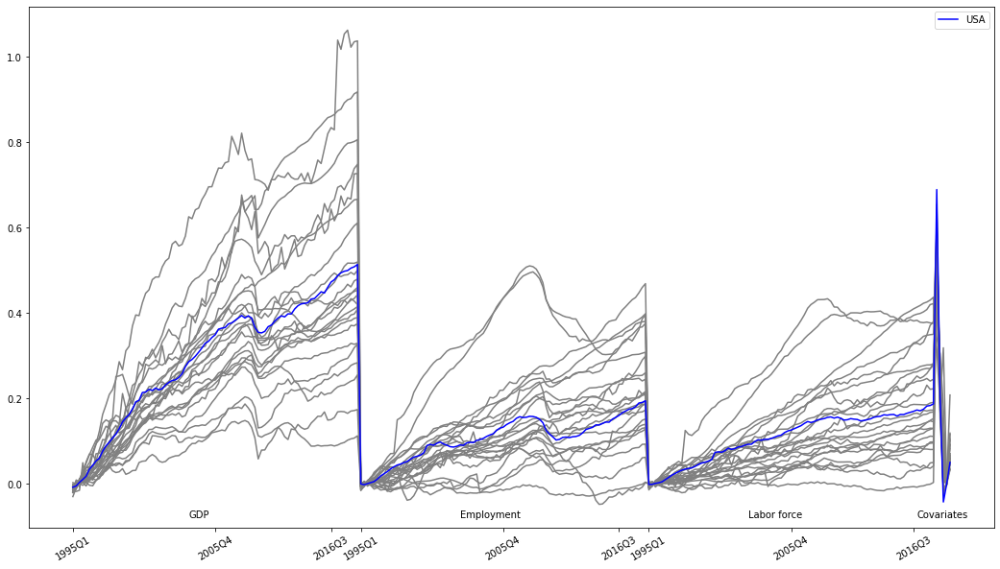

In [8]:
plt.figure(figsize=(18,10))
for i in range(24):
    plt.plot(X[:,i], color='grey')
plt.plot(y, color='blue', label='USA')
plt.legend()
plt.xticks(np.array([0, 43, 78, 87, 130, 165, 174, 217, 254]), 
           ['1995Q1', '2005Q4', '2016Q3', '1995Q1', '2005Q4', 
            '2016Q3', '1995Q1', '2005Q4', '2016Q3'], rotation=30)
plt.text(35, -.08, 'GDP')
plt.text(117, -.08, 'Employment')
plt.text(204, -.08, 'Labor force')
plt.text(255, -.08, 'Covariates');

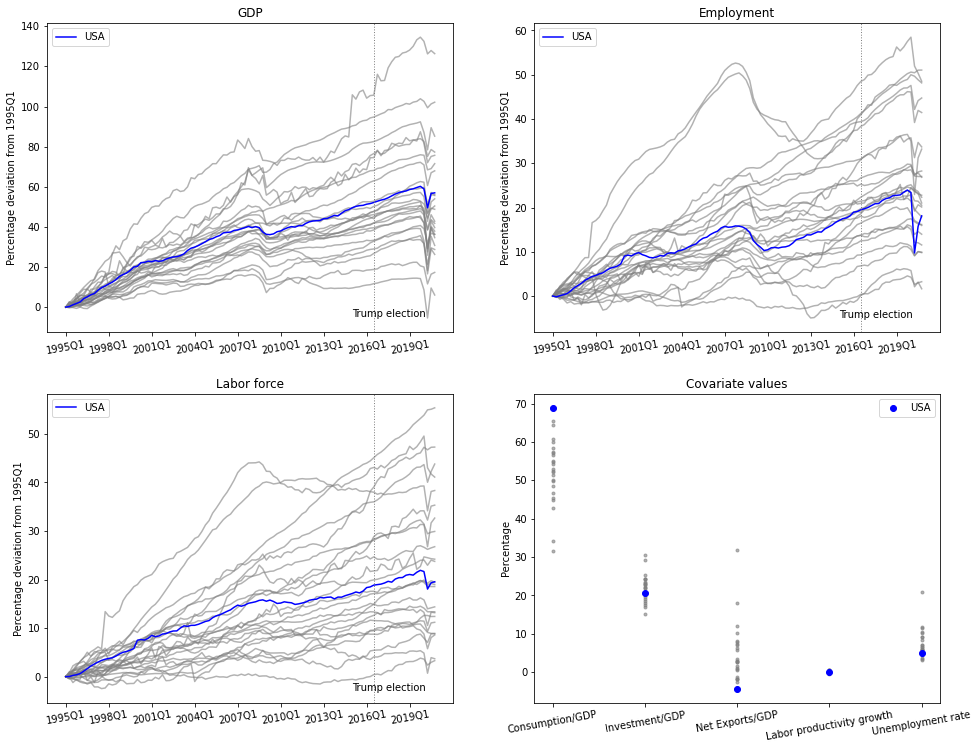

In [9]:
plt.figure(figsize=(16,12.5))

def plot_dataplots_overview(variable, title, textxlocation):    
    for i, country in enumerate(countries):
        df = variable[variable.Country == country].reset_index().Value
        color = 'blue' if country == 'United States' else 'grey'
        alpha = 1.0 if country == 'United States' else 0.6
        label = 'USA' if country == 'United States' else None
        plt.plot(100*np.log((df/df[0])), color=color, alpha=alpha, label=label)

    plt.title(title)
    plt.ylabel('Percentage deviation from 1995Q1')
    plt.legend()
    plt.xticks(np.arange(0,104,12), ['1995Q1', '1998Q1', '2001Q1', '2004Q1', '2007Q1',
                                   '2010Q1', '2013Q1', '2016Q1', '2019Q1'],
              rotation=10)
    plt.axvline(x=86, color='grey', linestyle='dotted', linewidth=1)
    plt.text(80, textxlocation, 'Trump election')

# Create figures
plt.subplot(2,2,1)
plot_dataplots_overview(GDP, 'GDP', -5)

plt.subplot(2,2,2)
plot_dataplots_overview(Employment, 'Employment', -5)

plt.subplot(2,2,3)
plot_dataplots_overview(Labor_force, 'Labor force', -3)

plt.subplot(2,2,4)
for i in range(24):
    plt.scatter(range(5), 100*X[-5:,i], color='grey', alpha=.6, marker='.')
plt.scatter(range(5), 100*y[-5:], label='USA', color='blue', marker='o')

plt.title('Covariate values')
plt.ylabel('Percentage')
plt.legend();
plt.xticks(range(5), 
           ["Consumption/GDP", "Investment/GDP", "Net Exports/GDP",
            "Labor productivity growth", "Unemployment rate"],
          rotation=10);

## 3. Paper Reproduction <a class="anchor" id="chapter3"></a>
### 3.1 Fitting Synthetic Control estimator <a class="anchor" id="section3_1"></a>

In [10]:
SCfit = SyntheticControl().fit(X,y)

Function evaluation 1000/100000 	loss = 0.051486450783913534
Function evaluation 2000/100000 	loss = 0.05108838608649841
Function evaluation 3000/100000 	loss = 0.0506308053601037
Function evaluation 4000/100000 	loss = 0.049808074423354706
Function evaluation 5000/100000 	loss = 0.04897845312163458
Function evaluation 6000/100000 	loss = 0.0487932099313076
Function evaluation 7000/100000 	loss = 0.048548100155532396
Function evaluation 8000/100000 	loss = 0.04832159440735234
Function evaluation 9000/100000 	loss = 0.04804638649389474
Function evaluation 10000/100000 	loss = 0.047729202432180776
Function evaluation 11000/100000 	loss = 0.0475101313273819
Function evaluation 12000/100000 	loss = 0.04706707399482078
Function evaluation 13000/100000 	loss = 0.04676302724584063
Function evaluation 14000/100000 	loss = 0.04653081075335331
Function evaluation 15000/100000 	loss = 0.04629530452721859
Function evaluation 16000/100000 	loss = 0.04606143190257231
Function evaluation 17000/100000

### 3.2 Reproduce Tables <a class="anchor" id="section3_2"></a>
#### 3.2.1 Table 1 <a class="anchor" id="section3_2_1"></a>

In [11]:
covariates_1 = np.round(np.hstack([100*y[-5:], 100*X[-5:] @ SCfit.weights.T]), 1)
index = ["Consumption/GDP", "Investment/GDP", "Net Exports/GDP","Labor productivity growth", "Unemployment rate"]
columns = ['US', 'Doppelganger']

pd.DataFrame(data=covariates_1, 
             index=index, 
             columns=columns)

,US,Doppelganger
Consumption/GDP,68.9,57.6
Investment/GDP,20.6,21.3
Net Exports/GDP,-4.3,2.0
Labor productivity growth,-0.0,-0.0
Unemployment rate,5.0,7.0


#### 3.2.2 Table 2 <a class="anchor" id="section3_2_2"></a>

In [12]:
pd.DataFrame(np.round(SCfit.weights.T,2), 
             index=countries[:-1], 
             columns=['Weight'])

,Weight
Australia,0.00
Austria,0.00
Belgium,0.00
Canada,0.20
Denmark,0.00
Finland,0.00
France,0.00
Germany,0.00
Hungary,0.00
Iceland,0.00


### 3.3 Reproduce Figures <a class="anchor" id="section3_3"></a>
#### 3.3.1 Preparation <a class="anchor" id="section3_3_1"></a>

##### Define functions for - normalizing to unity - plotting figures

In [13]:
def normalize_to_unity(df, country, start_date, end_date):
    """
        Normalize vector to average specified by start_date, end_date

        Parameters
        ----------
        df : dataframe
            Values for variable with (at least) columns Country, Time and Value
            
        country : string
            Country for which the variable needs to be normalized.
            
        start_date : float
            First value to take average over, for normalization. Included.
        
        end_date : float
            Last value to take average over, for normalization. Included.

        Returns
        -------
        y_predicted : array of shape (n_samples)
            Returns normalized (to specified dates) values for specified country.
    """
    country_df = df[df.Country == country].reset_index(drop=True)
    year_avg = country_df[(country_df.Time >= start_date) & (country_df.Time <= end_date)].Value.mean()
    normalized_vector = np.array(np.log(country_df.Value/year_avg))
    
    return normalized_vector

In [14]:
def plot_treatment_doppelganger_aggregate(df_treatment, df_doppelganger,
                                          std, title, ytitle, start_date, end_date, ymin, ymax,
                                          textscale=0.85, textxlocation=2014.5, 
                                          df_aggregate_doppelganger=None):
    """
        Plot treatment country and doppelganger data, and extra doppelganger, if specified.

        Parameters
        ----------
        df_treatment : array of shape (n_samples)
            Values for variable for treatment country.
            
        df_doppelganger : array of shape (n_samples)
            Values for variable for doppelganger.
            
        title : string
            Title of plot.
            
        ytitle : string
            Title of y-axis.
            
        start_date : float
            Start date plot x-axis. 
        
        end_date : float
            End date plot x-axis. 
            
        ymin : float
            Start value plot y-axis.
            
        ymax : float
            End value plot y-axis.
            
        df_aggregate_doppelganger : array of shape (n_samples) , default = None
            Values for variable for aggregate doppelganger.
            
        Returns
        -------
        plot : plot
            Returns plot.
    """    
    # Plot treatment and doppelganger, and standard errors
    plt.plot(np.arange(start_date, end_date, 0.25), df_treatment,
             color='b', label='USA')
    plt.plot(np.arange(start_date, end_date, 0.25), df_doppelganger,
             color='r', linestyle='dashed', label='Doppelganger baseline')
    
    # Plot extra doppelganger, if specified
    try:
        plt.plot(np.arange(start_date, end_date, 0.25), df_aggregate_doppelganger,
                 color='black', linestyle='dashdot', label='Doppelganger')
        plt.fill_between(np.arange(start_date, end_date, 0.25), (df_aggregate_doppelganger - 2*std).flatten(), 
                     (df_aggregate_doppelganger + 2*std).flatten(), color='grey', alpha=.4)
    except:
        plt.fill_between(np.arange(start_date, end_date, 0.25), 
                         (df_doppelganger - 2*std).flatten(), 
                         (df_doppelganger + 2*std).flatten(), 
                         color='grey', alpha=.4)
        
    if ymin > 0:
        textylocation = 1/textscale * ymin
    else:
        textylocation = textscale * ymin
    
    # Add details
    plt.axvline(x=2016.5, ymin=-100, ymax=100, color='grey', linestyle='dotted', linewidth=1)
    plt.axis([start_date, end_date-0.25, ymin, ymax])
    plt.title(title)
    plt.ylabel(ytitle)
    plt.legend()
    plt.text(textxlocation, textylocation, 'Trump election')
    if start_date == 1995:
        plt.xticks(range(1995, 2022, 3), ['1995Q1', '1998Q1', '2001Q1',
                                          '2004Q1', '2007Q1', '2010Q1',
                                         '2013Q1', '2016Q1', '2019Q1']);
    elif start_date == 2015.5:
        plt.xticks(range(2016, 2022, 1), ['2016Q1', '2017Q1', '2018Q1',
                                         '2019Q1', '2020Q1', '2021Q1']);
    elif start_date == 2015.75:
        plt.xticks(range(2016, 2021, 1), ['2016Q1', '2017Q1', '2018Q1',
                                         '2019Q1', '2020Q1']);

#### 3.3.2 Figure 1 <a class="anchor" id="section3_3_2"></a>
##### Preparation

In [15]:
def calc_doppelganger_statistics(variable, start_date, end_date):
    df_USA_1995 = 100*normalize_to_unity(variable, 'United States', start_date, end_date)

    df_donor_1995 = []
    for country in countries:
        if country == 'United States': 
            continue 
        df_normalized_1995 = 100*normalize_to_unity(variable, country, start_date, end_date)
        df_donor_1995.append(df_normalized_1995)
        
    df_donor_1995 = np.array(df_donor_1995)
    df_doppelganger_1995 = np.dot(df_donor_1995.T, SCfit.weights.T)

    if start_date == 1995.00:
        gap_df = df_USA_1995[:87] - df_doppelganger_1995[:87].T
        std_df = gap_df.std()
        
        return df_USA_1995, df_donor_1995, df_normalized_1995, df_doppelganger_1995, gap_df, std_df
    else:
        return df_USA_1995, df_donor_1995, df_normalized_1995, df_doppelganger_1995

(GDP_USA_1995, GDP_donor_1995, GDP_normalized_1995, 
 GDP_doppelganger_1995, gap_GDP, std_GDP) = (
    calc_doppelganger_statistics(GDP, 1995.00, 1995.75))

(Employment_USA_1995, Employment_donor_1995, Employment_normalized_1995, 
 Employment_doppelganger_1995, gap_Employment, std_Employment) = (
    calc_doppelganger_statistics(Employment, 1995.00, 1995.75))

(Labor_force_USA_1995, Labor_force_donor_1995, Labor_force_normalized_1995, 
 Labor_force_doppelganger_1995, gap_Labor_force, std_Labor_force) = (
    calc_doppelganger_statistics(Labor_force, 1995.00, 1995.75))

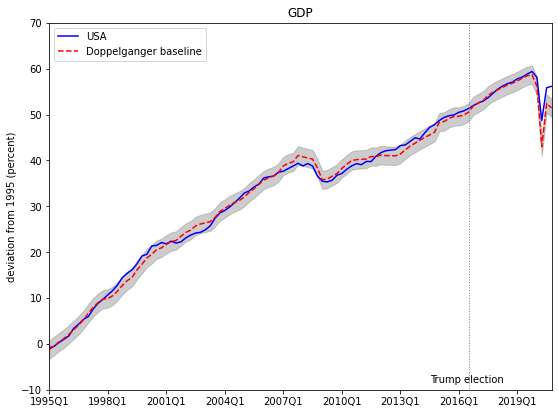

In [16]:
plt.figure(figsize=(9, 6.75))   
plot_treatment_doppelganger_aggregate(GDP_USA_1995, GDP_doppelganger_1995, std_GDP, 'GDP', 
                                      'deviation from 1995 (percent)', 1995, 2021, -10, 70)

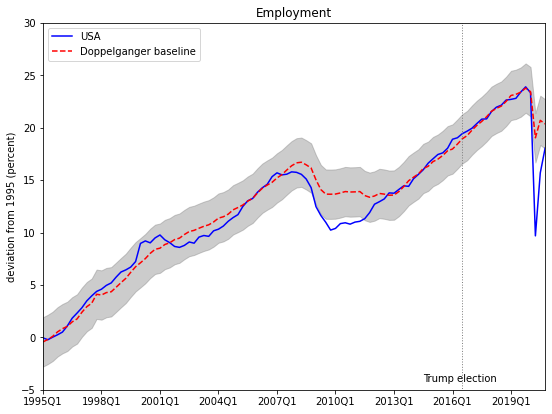

In [17]:
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(Employment_USA_1995, Employment_doppelganger_1995, std_Employment, 
                                      'Employment', 'deviation from 1995 (percent)', 1995, 2021, -5, 30)

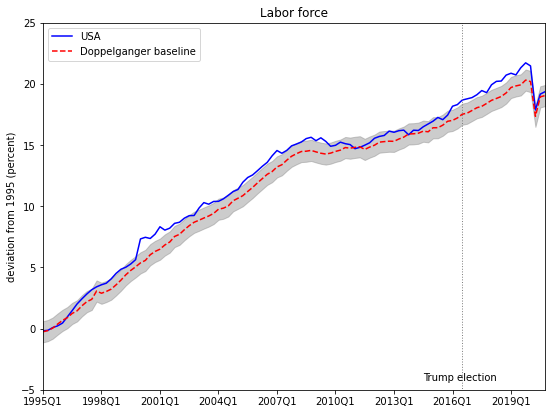

In [18]:
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(Labor_force_USA_1995, Labor_force_doppelganger_1995, std_Labor_force, 
                                      'Labor force', 'deviation from 1995 (percent)', 1995, 2021, -5, 25)

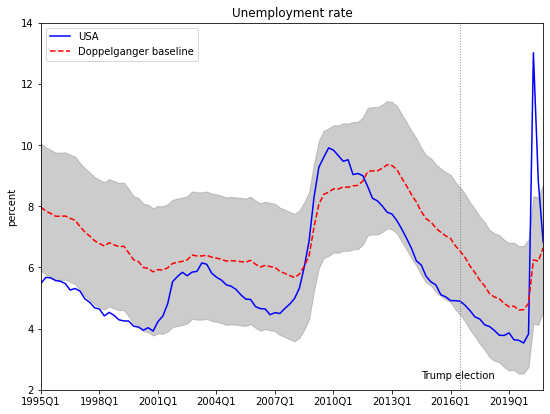

In [19]:
# Get data USA
Unemployment_rate_USA = (
    Unemployment_rate[Unemployment_rate.Country == 'United States'].Value.reset_index(drop=True))
    
# Calculate data doppelganger  
Unemployment_rate_donor = Unemployment_rate[Unemployment_rate.Country != 'United States'].Value.values
Unemployment_rate_donor = Unemployment_rate_donor.reshape(SCfit.n_donorcountries, len(Unemployment_rate_USA))
Unemployment_rate_doppelganger = Unemployment_rate_donor.T @ SCfit.weights.T

# Calculate gap and standard deviation
gap_Unemployment_rate = Unemployment_rate_USA[:87] - Unemployment_rate_doppelganger[:87].flatten()
std_Unemployment_rate = gap_Unemployment_rate.std()

# Create figure
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(Unemployment_rate_USA, Unemployment_rate_doppelganger, 
                                      std_Unemployment_rate, 'Unemployment rate', 'percent', 1995, 2021, 2, 14)

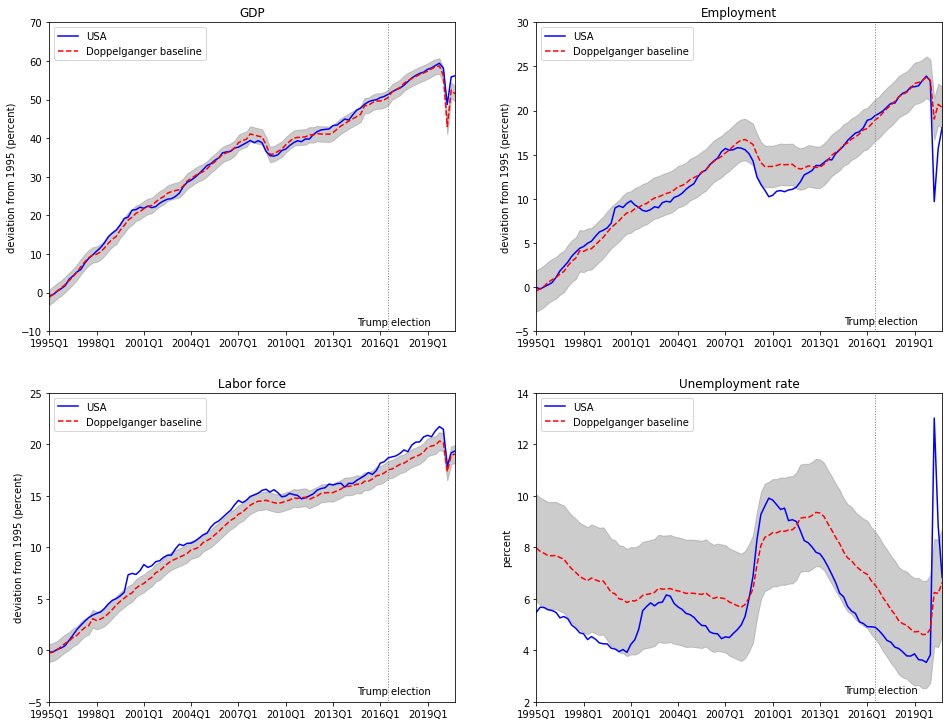

In [20]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
plot_treatment_doppelganger_aggregate(GDP_USA_1995, GDP_doppelganger_1995, std_GDP, 'GDP', 
                                      'deviation from 1995 (percent)', 
                                      1995, 2021, -10, 70)
plt.subplot(2,2,2)
plot_treatment_doppelganger_aggregate(Employment_USA_1995, Employment_doppelganger_1995, std_Employment, 
                                      'Employment', 'deviation from 1995 (percent)', 
                                      1995, 2021, -5, 30)
plt.subplot(2,2,3)
plot_treatment_doppelganger_aggregate(Labor_force_USA_1995, Labor_force_doppelganger_1995, std_Labor_force, 
                                      'Labor force', 'deviation from 1995 (percent)', 
                                      1995, 2021, -5, 25)
plt.subplot(2,2,4)
plot_treatment_doppelganger_aggregate(Unemployment_rate_USA, Unemployment_rate_doppelganger, 
                                      std_Unemployment_rate, 'Unemployment rate', 'percent', 
                                      1995, 2021, 2, 14)

#### 3.3.3 Figure 2 <a class="anchor" id="section3_3_3"></a>
##### Preparation

In [21]:
(GDP_USA_2016, GDP_donor_2016, GDP_normalized_2016, GDP_doppelganger_2016) = (
    calc_doppelganger_statistics(GDP, 2016.50, 2016.50))

(Employment_USA_2016, Employment_donor_2016, Employment_normalized_2016, Employment_doppelganger_2016) = (
    calc_doppelganger_statistics(Employment, 2016.50, 2016.50))

(Labor_force_USA_2016, Labor_force_donor_2016, Labor_force_normalized_2016, Labor_force_doppelganger_2016) = (
    calc_doppelganger_statistics(Labor_force, 2016.50, 2016.50))

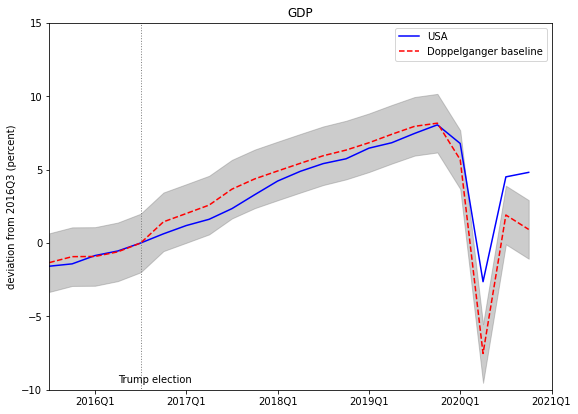

In [22]:
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(GDP_USA_2016[82:], GDP_doppelganger_2016[82:], std_GDP, 
                                      'GDP', 'deviation from 2016Q3 (percent)', 
                                      2015.5, 2021, -10, 15, 0.95, 2016.25)

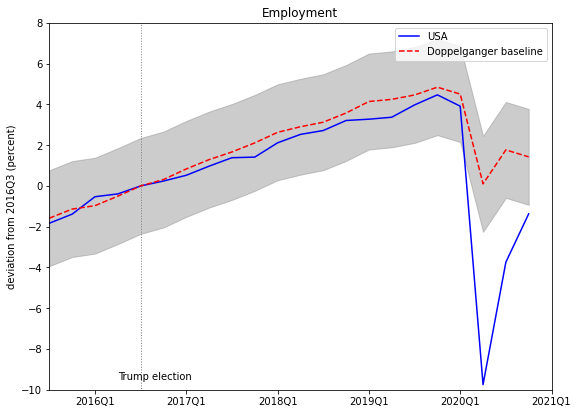

In [23]:
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(Employment_USA_2016[82:], Employment_doppelganger_2016[82:], 
                                      std_Employment, 'Employment', 'deviation from 2016Q3 (percent)', 
                                      2015.5, 2021, -10, 8, 0.95, 2016.25)

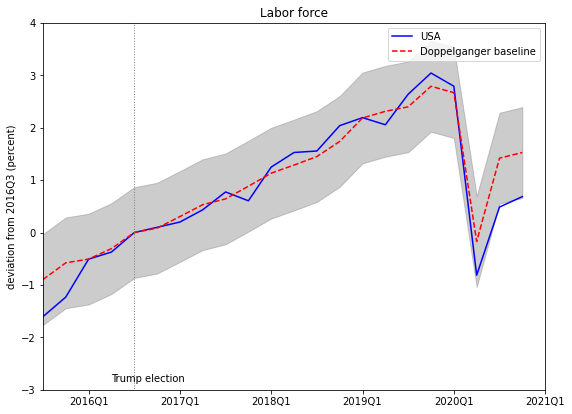

In [24]:
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(Labor_force_USA_2016[82:], Labor_force_doppelganger_2016[82:], 
                                      std_Labor_force, 'Labor force', 'deviation from 2016Q3 (percent)', 
                                      2015.5, 2021, -3, 4, 0.95, 2016.25)

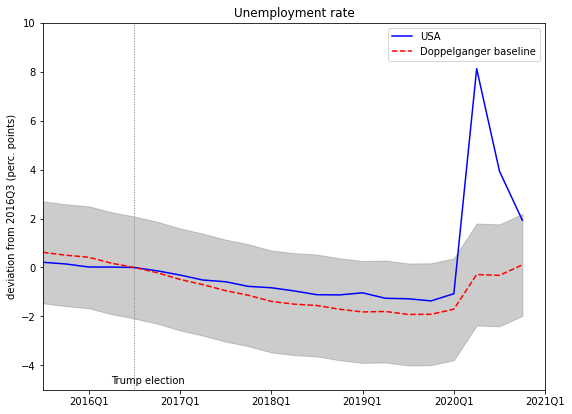

In [25]:
# Get data USA
Unemployment_rate_USA_2016 = Unemployment_rate_USA - Unemployment_rate_USA[86]

# Get data donor countries
Unemployment_rate_donor_2016 = np.array([])
for country in countries:
    if country == 'United States': continue 
    Unemployment_rate_donor = Unemployment_rate[Unemployment_rate.Country == country].Value.reset_index(drop=True)
    Unemployment_rate_normalized_2016 = Unemployment_rate_donor - Unemployment_rate_donor[86]
    Unemployment_rate_donor_2016 = np.append(Unemployment_rate_donor_2016, Unemployment_rate_normalized_2016)
Unemployment_rate_donor_2016 = Unemployment_rate_donor_2016.reshape(SCfit.n_donorcountries, 
                                                                        len(Unemployment_rate_USA_2016))

# Calculate data doppelganger
Unemployment_rate_doppelganger_2016 = Unemployment_rate_donor_2016.T @ SCfit.weights.T

# Create figure
plt.figure(figsize=(9, 6.75))
plot_treatment_doppelganger_aggregate(Unemployment_rate_USA_2016[82:], Unemployment_rate_doppelganger_2016[82:], 
                                      std_Unemployment_rate, 'Unemployment rate', 
                                      'deviation from 2016Q3 (perc. points)', 
                                      2015.5, 2021, -5, 10, 0.95, 2016.25)

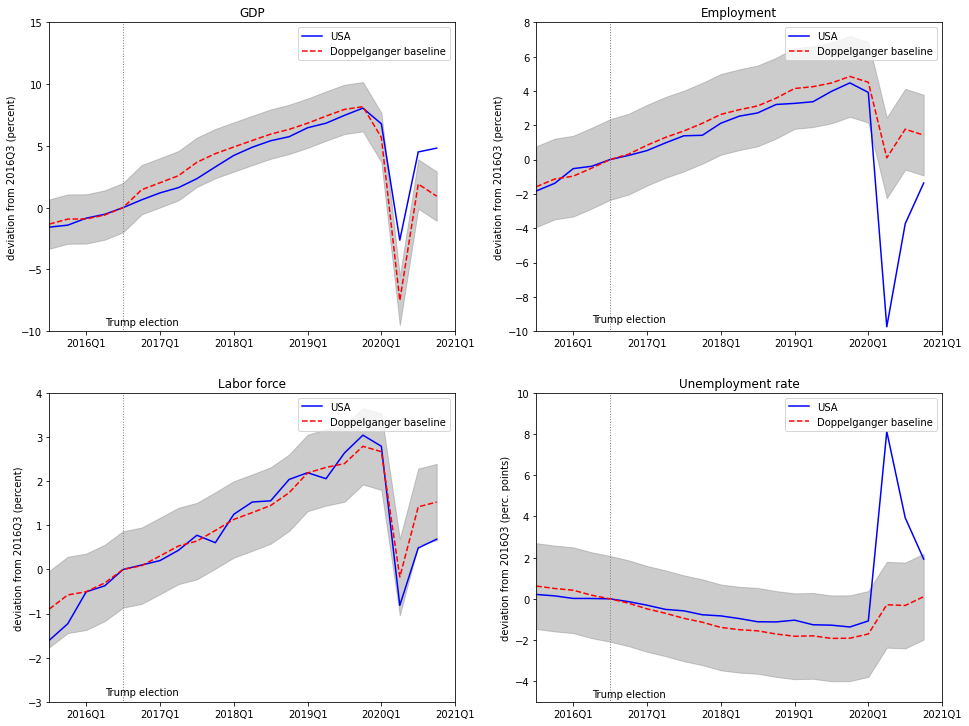

In [26]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
plot_treatment_doppelganger_aggregate(GDP_USA_2016[82:], GDP_doppelganger_2016[82:], std_GDP, 
                                      'GDP', 'deviation from 2016Q3 (percent)', 
                                      2015.5, 2021, -10, 15, 0.95, 2016.25)
plt.subplot(2,2,2)
plot_treatment_doppelganger_aggregate(Employment_USA_2016[82:], Employment_doppelganger_2016[82:], 
                                      std_Employment, 'Employment', 'deviation from 2016Q3 (percent)', 
                                      2015.5, 2021, -10, 8, 0.95, 2016.25)
plt.subplot(2,2,3)
plot_treatment_doppelganger_aggregate(Labor_force_USA_2016[82:], Labor_force_doppelganger_2016[82:], 
                                      std_Labor_force, 'Labor force', 'deviation from 2016Q3 (percent)', 
                                      2015.5, 2021, -3, 4, 0.95, 2016.25)
plt.subplot(2,2,4)
plot_treatment_doppelganger_aggregate(Unemployment_rate_USA_2016[82:], Unemployment_rate_doppelganger_2016[82:], 
                                      std_Unemployment_rate, 'Unemployment rate', 
                                      'deviation from 2016Q3 (perc. points)', 
                                      2015.5, 2021, -5, 10, 0.95, 2016.25)

### 3.4 Inference Original Method <a class="anchor" id="section3_4"></a>
#### 3.4.1 Country Placebo Permutation Tests <a class="anchor" id="section3_4_1"></a>
#### Define functions

In [27]:
full_GDP_df = pd.DataFrame(
    np.vstack([GDP_donor_2016, GDP_USA_2016]).T, columns=countries)
full_Employment_df = pd.DataFrame(
    np.vstack([Employment_donor_2016, Employment_USA_2016]).T, columns=countries)
full_Labor_force_df = pd.DataFrame(
    np.vstack([Labor_force_donor_2016, Labor_force_USA_2016]).T, columns=countries)
full_Unemployment_rate_df = pd.DataFrame(
    np.vstack([Unemployment_rate_donor_2016, Unemployment_rate_USA_2016]).T, columns=countries)

In [145]:
def gap_computer(full_X_df, placebo_country, w):
    df_treated_X = full_X_df[placebo_country]
    df_untreated_X = full_X_df.drop(placebo_country, axis=1)
    doppelganger_X = df_untreated_X.dot(w.T)
    result = (df_treated_X.values - doppelganger_X.values.flatten())
    
    return result

def placebo_weight_and_gap_computer(df_complete, method):
    weight_dict = dict()
    gap_dict_GDP = dict()
    gap_dict_Employment = dict()
    gap_dict_Labor_force = dict()
    gap_dict_Unemployment_rate = dict()
    count = 0
    for placebo_country in countries:
        count += 1
        print('\n' + str(count) + '/25' ' Performing SCM with placebo country ' + placebo_country)

        y = df_complete[placebo_country].values.reshape(len(df_complete[placebo_country]), 1)
        X = df_complete.iloc[:, df_complete.columns != placebo_country].values
        
        SCplacebo = method(verbose_inner=False).fit(X,y)
        w = SCplacebo.weights
        
        weight_dict[placebo_country] = w

        gap_dict_GDP[placebo_country] = gap_computer(full_GDP_df, placebo_country, w)
        gap_dict_Employment[placebo_country] = gap_computer(full_Employment_df, placebo_country, w)
        gap_dict_Labor_force[placebo_country] = gap_computer(full_Labor_force_df, placebo_country, w)
        gap_dict_Unemployment_rate[placebo_country] = gap_computer(full_Unemployment_rate_df, placebo_country, w)

    return weight_dict, gap_dict_GDP, gap_dict_Employment, gap_dict_Labor_force, gap_dict_Unemployment_rate

def time_weight_and_gap_computer(df_complete, method, indices):
    time_weight_dict = dict()
    time_gap_dict_GDP = dict()
    time_gap_dict_Employment = dict()
    time_gap_dict_Labor_force = dict()
    time_gap_dict_Unemployment_rate = dict()
    count = 0
    for index in indices:
        print('\n' + str(count+1) + '/21' ' Performing SCM with time placebo ' + str_indices[count])

        y = df_complete.iloc[index, -1].values.reshape(len(index), 1)
        X = df_complete.iloc[index, :-1].values
        
        SCtimeplacebo = method(verbose_inner=False).fit(X,y)
        w = SCtimeplacebo.weights
        
        time_weight_dict[str_indices[count]] = w

        time_gap_dict_GDP[str_indices[count]] = gap_computer(full_GDP_df, 'United States', w)
        time_gap_dict_Employment[str_indices[count]] = gap_computer(full_Employment_df, 'United States', w)
        time_gap_dict_Labor_force[str_indices[count]] = gap_computer(full_Labor_force_df, 'United States', w)
        time_gap_dict_Unemployment_rate[str_indices[count]] = gap_computer(full_Unemployment_rate_df, 'United States', w)

        count += 1
        
    return time_weight_dict, time_gap_dict_GDP, time_gap_dict_Employment, time_gap_dict_Labor_force, time_gap_dict_Unemployment_rate


def placebo_gap_plotter_short(gap_dict_X, title):
    plt.title(title)

    for country in countries:
        if country == 'United States':
            plt.plot(gap_dict_X[country][82:], color='blue', label='USA')
        else:
            plt.plot(gap_dict_X[country][82:], color='grey', alpha=.5)

    plt.legend(loc='upper left')
    plt.xticks(np.arange(2, 19, 4), ['2016Q1', '2017Q1', '2018Q1', '2019Q1', '2020Q1'])
    plt.axvline(x=4, ymin=-10, ymax=10, color='grey', linestyle='dotted', linewidth=1)
    plt.ylabel('deviation from 2016Q3')

def placebo_gap_plotter_full(gap_dict_X, title):
    plt.title(title)

    for country in countries:
        if country == 'United States':
            plt.plot(gap_dict_X[country], color='blue', label='USA')
        else:
            plt.plot(gap_dict_X[country], color='grey', alpha=.5)

    plt.legend(loc='upper left')
    plt.xticks(np.arange(0, 104, 10), ['1995Q1', '1997Q3', '2000Q1', '2002Q3',
                                      '2005Q1', '2007Q3', '2010Q1', '2012Q3',
                                      '2015Q1', '2017Q3', '2020Q1'], rotation=30)
    plt.axvline(x=86, ymin=-10, ymax=10, color='grey', linestyle='dotted', linewidth=1)
    plt.ylabel('deviation from 2016Q3')
    
def time_gap_plotter_short(time_gap_dict_X, title):
    plt.title(title)
    count = 0

    for index in indices:
        if str_indices[count] != 'full':
            plt.plot(time_gap_dict_X[str_indices[count]][82:], color='grey', alpha=.5)
        else:
            plt.plot(time_gap_dict_X[str_indices[count]][82:], color='blue', label='Full model')
            
        count += 1

    plt.legend(loc='upper left')
    plt.xticks(np.arange(2, 19, 4), ['2016Q1', '2017Q1', '2018Q1', '2019Q1', '2020Q1'])
    plt.axvline(x=4, ymin=-10, ymax=10, color='grey', linestyle='dotted', linewidth=1)
    plt.ylabel('deviation from 2016Q3')
    
def time_gap_plotter_full(time_gap_dict_X, title):
    plt.title(title)
    count = 0

    for index in indices:
        if str_indices[count] != 'full':
            plt.plot(time_gap_dict_X[str_indices[count]], color='grey', alpha=.5)
        else:
            plt.plot(time_gap_dict_X[str_indices[count]], color='blue', label='Full model')
            
        count += 1

    plt.legend(loc='upper left')
    plt.xticks(np.arange(0, 104, 10), ['1995Q1', '1997Q3', '2000Q1', '2002Q3',
                                      '2005Q1', '2007Q3', '2010Q1', '2012Q3',
                                      '2015Q1', '2017Q3', '2020Q1'], rotation=30)
    plt.axvline(x=86, ymin=-10, ymax=10, color='grey', linestyle='dotted', linewidth=1)
    plt.ylabel('deviation from 2016Q3')
    
def test_statistic(gap_dict_X, sign=None):
    if sign == 'positive':
        gap_dict_X_positive = np.clip(gap_dict_X, 0, None)
        gap_sum = np.sum(gap_dict_X_positive**2)
    elif sign == 'negative':
        gap_dict_X_negative = np.clip(gap_dict_X, None, 0)
        gap_sum = np.sum(gap_dict_X_negative**2)
    else:
        gap_sum = np.sum(gap_dict_X**2)
        
    return gap_sum/len(gap_dict_X)

def ratiofit_pre_post(gap_dict_X, sign='positive'):
    avg_ratiofit_countrydict = dict()
    t_ratiofit_countrydict = dict()
    pre_treatment_fits = dict()
    
    for country in countries:
        pre_treatment_fit = test_statistic(gap_dict_X[country][:87])
        pre_treatment_fits[country] = pre_treatment_fit

        if sign == 'positive':
            post_treatment_fit = test_statistic(gap_dict_X[country][87:], 'positive')
        else:
            post_treatment_fit = test_statistic(gap_dict_X[country][87:], 'negative')   
        avg_ratio = post_treatment_fit/pre_treatment_fit
        avg_ratiofit_countrydict[country] = avg_ratio
        
        ratio_t = gap_dict_X[country][87:]/pre_treatment_fit
        t_ratiofit_countrydict[country] = ratio_t
        t_ratiofit_rank_matrix = (pd.DataFrame(t_ratiofit_countrydict)).rank(axis=1)
    
    return pre_treatment_fits, avg_ratiofit_countrydict, t_ratiofit_countrydict, t_ratiofit_rank_matrix

def time_ratiofit_pre_post(time_gap_dict_X, sign='positive'):
    avg_ratiofit_timedict = dict()
    t_ratiofit_timedict = dict()
    pre_treatment_fits = dict()
    count = 0
    
    for index in indices:
        pre_treatment_fit = test_statistic(time_gap_dict_X[str_indices[count]][:87])
        pre_treatment_fits[str_indices[count]] = pre_treatment_fit

        if sign == 'positive':
            post_treatment_fit = test_statistic(time_gap_dict_X[str_indices[count]][87:], 'positive')
        else:
            post_treatment_fit = test_statistic(time_gap_dict_X[str_indices[count]][87:], 'negative')   
        time_avg_ratio = post_treatment_fit/pre_treatment_fit
        avg_ratiofit_timedict[str_indices[count]] = time_avg_ratio
        
        ratio_t = time_gap_dict_X[str_indices[count]][87:]/pre_treatment_fit
        t_ratiofit_timedict[str_indices[count]] = ratio_t
        t_ratiofit_time_rank_matrix = (pd.DataFrame(t_ratiofit_timedict)).rank(axis=1)
        
        count +=1
    
    return pre_treatment_fits, avg_ratiofit_timedict, t_ratiofit_timedict, t_ratiofit_time_rank_matrix

def pseudo_p_value(gap_dict_X):
    J = len(gap_dict_X)
    t_ratiofit_rank_matrix = ratiofit_pre_post(gap_dict_X)[3]['United States']
    pseudo_p_values = ((t_ratiofit_rank_matrix-1)/(J-1)).values
    return pseudo_p_values, (1-pseudo_p_values)

def time_pseudo_p_value(time_gap_dict_X):
    N = len(time_gap_dict_X)
    t_ratiofit_time_rank_matrix = time_ratiofit_pre_post(time_gap_dict_X)[3]['full']
    time_pseudo_p_values = ((t_ratiofit_time_rank_matrix-1)/(N-1)).values
    return time_pseudo_p_values, (1-time_pseudo_p_values)

In [29]:
df_XY = pd.DataFrame(np.hstack([X, y]), columns=countries)
(baseline_weight_dict, gap_dict_GDP, gap_dict_Employment, 
 gap_dict_Labor_force, gap_dict_Unemployment_rate) = placebo_weight_and_gap_computer(df_XY, SyntheticControl)


1/25 Performing SCM with placebo country Australia

2/25 Performing SCM with placebo country Austria

3/25 Performing SCM with placebo country Belgium

4/25 Performing SCM with placebo country Canada

5/25 Performing SCM with placebo country Denmark

6/25 Performing SCM with placebo country Finland

7/25 Performing SCM with placebo country France

8/25 Performing SCM with placebo country Germany
Optimization terminated successfully.
         Current function value: 0.079630
         Iterations: 24345
         Function evaluations: 28657

9/25 Performing SCM with placebo country Hungary

10/25 Performing SCM with placebo country Iceland

11/25 Performing SCM with placebo country Ireland
Optimization terminated successfully.
         Current function value: 5.988658
         Iterations: 24610
         Function evaluations: 30828

12/25 Performing SCM with placebo country Italy
Optimization terminated successfully.
         Current function value: 0.302979
         Iterations: 35413
    

#### Create p-values

In [30]:
p_values_GDP_baseline_pos, p_values_GDP_baseline_neg = pseudo_p_value(gap_dict_GDP)
p_values_Employment_baseline_pos, p_values_Employment_baseline_neg = pseudo_p_value(gap_dict_Employment)
p_values_Labor_force_baseline_pos, p_values_Labor_force_baseline_neg = pseudo_p_value(gap_dict_Labor_force)
(p_values_Unemployment_rate_baseline_pos, 
 p_values_Unemployment_rate_baseline_neg) = pseudo_p_value(gap_dict_Unemployment_rate)

avg_pvalue_baseline = []
for gap_dict_X in [gap_dict_GDP, gap_dict_Employment, gap_dict_Labor_force, gap_dict_Unemployment_rate]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_baseline.append('+')
    else:
        avg_pvalue_baseline.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_baseline = (pd.concat([pos_df,neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_baseline.append(df_avg_te_baseline)
    
avg_pvalue_baseline = np.hstack(avg_pvalue_baseline)

#### Plot

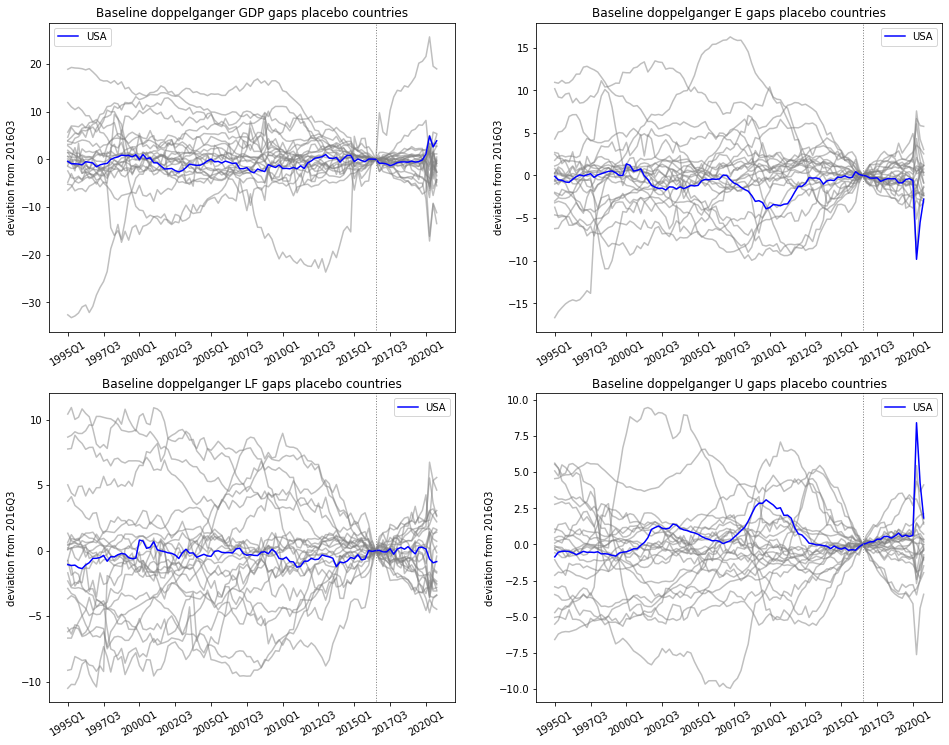

In [131]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP, 'Baseline doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment, 'Baseline doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force, 'Baseline doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate, 'Baseline doppelganger U gaps placebo countries')

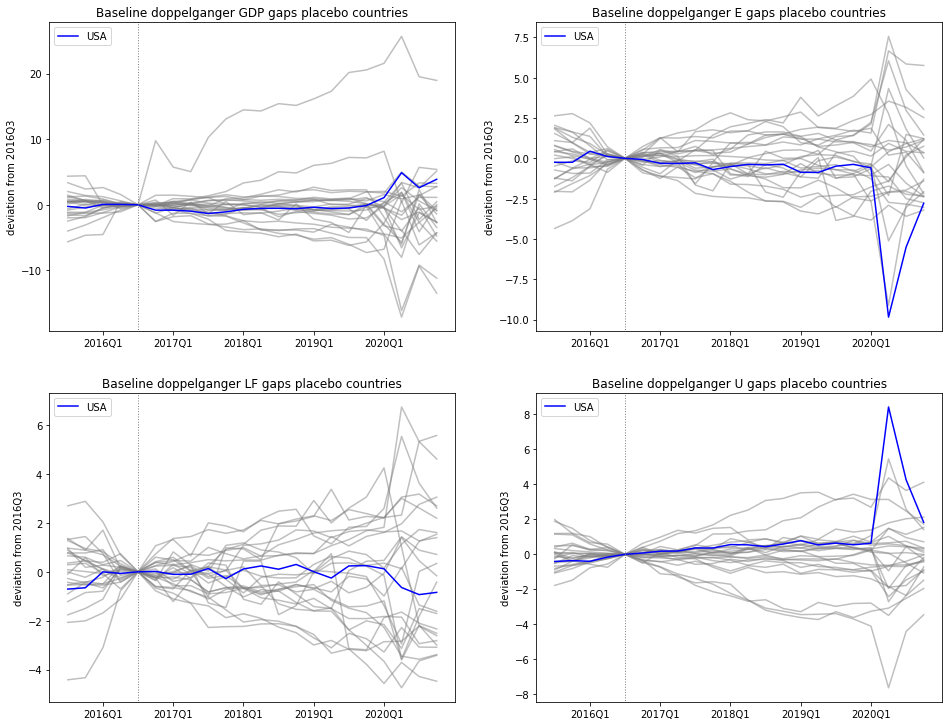

In [132]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP, 'Baseline doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment, 'Baseline doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force, 'Baseline doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate, 'Baseline doppelganger U gaps placebo countries')

In [33]:
df_results_baseline = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_baseline_pos,2), np.round(p_values_GDP_baseline_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_baseline_pos,2), np.round(p_values_Employment_baseline_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_baseline_pos,2), np.round(p_values_Labor_force_baseline_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_baseline_pos,2), np.round(p_values_Unemployment_rate_baseline_neg,2)
    ]).T)

p_baseline = pd.DataFrame(np.vstack([df_results_baseline.values, avg_pvalue_baseline]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_baseline.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_baseline

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.000000 & 1.000000 & - & 0.330000 & 0.670000 & + & 0.830000 & 0.170000 & + & 0.750000 & 0.250000 \\
2017Q1 & - & 0.000000 & 1.000000 & - & 0.210000 & 0.790000 & - & 0.170000 & 0.830000 & + & 0.920000 & 0.080000 \\
2017Q2 & - & 0.080000 & 0.920000 & - & 0.210000 & 0.790000 & - & 0.170000 & 0.830000 & + & 0.750000 & 0.250000 \\
2017Q3 & - & 0.080000 & 0.920000 & - & 0.290000 & 0.710000 & + & 0.920000 & 0.080000 & + & 0.880000 & 0.120000 \\
2017Q4 & - & 0.080000 & 0.920000 & - & 0.250000 & 0.750000 & - & 0.120000 & 0.880000 & + & 0.830000 & 0.170000 \\
2018Q1 & - & 0.080000 & 0.920000 & - & 0.250000 & 0.750000 & + & 0.920000 & 0.080000 & + & 0.920000 & 0.080000 \\
2018Q2 & - & 0.120000 & 0.880000 & - & 0.290000 & 0.710000 & + & 0.920000 & 0.080000 & + & 0.880000 & 0.120000 \\
2018Q3 & - & 0.170000 & 0.830000 & - & 0.330000 & 0.670000 & +

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.0,1.0,-,0.33,0.67,+,0.83,0.17,+,0.75,0.25
2017Q1,-,0.0,1.0,-,0.21,0.79,-,0.17,0.83,+,0.92,0.08
2017Q2,-,0.08,0.92,-,0.21,0.79,-,0.17,0.83,+,0.75,0.25
2017Q3,-,0.08,0.92,-,0.29,0.71,+,0.92,0.08,+,0.88,0.12
2017Q4,-,0.08,0.92,-,0.25,0.75,-,0.12,0.88,+,0.83,0.17
2018Q1,-,0.08,0.92,-,0.25,0.75,+,0.92,0.08,+,0.92,0.08
2018Q2,-,0.12,0.88,-,0.29,0.71,+,0.92,0.08,+,0.88,0.12
2018Q3,-,0.17,0.83,-,0.33,0.67,+,0.92,0.08,+,0.79,0.21
2018Q4,-,0.12,0.88,-,0.29,0.71,+,0.92,0.08,+,0.83,0.17
2019Q1,-,0.17,0.83,-,0.21,0.79,+,0.62,0.38,+,0.88,0.12


#### 3.4.2 Time Placebo Permutation Tests <a class="anchor" id="section3_4_2"></a>

In [34]:
def indices_creator(i):
    return np.r_[0:(87-i), 87:(174-i), 174:(261-i), 261:266]
    
# name is last quarter included
indices2016q3 = indices_creator(0)
indices2016q2 = indices_creator(1)
indices2016q1 = indices_creator(2)
indices2015q4 = indices_creator(3)
indices2015q3 = indices_creator(4)
indices2015q2 = indices_creator(5)
indices2015q1 = indices_creator(6)
indices2014q4 = indices_creator(7)
indices2014q3 = indices_creator(8)
indices2014q2 = indices_creator(9)
indices2014q1 = indices_creator(10)
indices2013q4 = indices_creator(11)
indices2013q3 = indices_creator(12)
indices2013q2 = indices_creator(13)
indices2013q1 = indices_creator(14)
indices2012q4 = indices_creator(15)
indices2012q3 = indices_creator(16)
indices2012q2 = indices_creator(17)
indices2012q1 = indices_creator(18)
indices2011q4 = indices_creator(19)
indices2011q3 = indices_creator(20)

str_indices = ['full', '2016q2', '2016q1',
               '2015q4', '2015q3', '2015q2', '2015q1',
               '2014q4', '2014q3', '2014q2', '2014q1',
               '2013q4', '2013q3', '2013q2', '2013q1',
               '2012q4', '2012q3', '2012q2', '2012q1',
               '2011q4', '2011q3']

indices = [indices2016q3, indices2016q2, indices2016q1, 
           indices2015q4, indices2015q3, indices2015q2, indices2015q1,
           indices2014q4, indices2014q3, indices2014q2, indices2014q1,
           indices2013q4, indices2013q3, indices2013q2, indices2013q1, 
           indices2012q4, indices2012q3, indices2012q2, indices2012q1,
           indices2011q4, indices2011q3]

In [35]:
(baseline_time_weight_dict, time_gap_dict_GDP, 
 time_gap_dict_Employment, time_gap_dict_Labor_force, 
 time_gap_dict_Unemployment_rate) = time_weight_and_gap_computer(df_XY, SyntheticControl, indices)


1/21 Performing SCM with time placebo full

2/21 Performing SCM with time placebo 2016q2

3/21 Performing SCM with time placebo 2016q1

4/21 Performing SCM with time placebo 2015q4

5/21 Performing SCM with time placebo 2015q3

6/21 Performing SCM with time placebo 2015q2
Optimization terminated successfully.
         Current function value: 0.044095
         Iterations: 43264
         Function evaluations: 47317

7/21 Performing SCM with time placebo 2015q1

8/21 Performing SCM with time placebo 2014q4

9/21 Performing SCM with time placebo 2014q3

10/21 Performing SCM with time placebo 2014q2

11/21 Performing SCM with time placebo 2014q1

12/21 Performing SCM with time placebo 2013q4

13/21 Performing SCM with time placebo 2013q3

14/21 Performing SCM with time placebo 2013q2

15/21 Performing SCM with time placebo 2013q1

16/21 Performing SCM with time placebo 2012q4

17/21 Performing SCM with time placebo 2012q3

18/21 Performing SCM with time placebo 2012q2

19/21 Performing SCM

#### Create p-values

In [36]:
(time_p_values_GDP_baseline_pos, 
 time_p_values_GDP_baseline_neg) = time_pseudo_p_value(time_gap_dict_GDP)
(time_p_values_Employment_baseline_pos, 
 time_p_values_Employment_baseline_neg) = time_pseudo_p_value(time_gap_dict_Employment)
(time_p_values_Labor_force_baseline_pos, 
 time_p_values_Labor_force_baseline_neg) = time_pseudo_p_value(time_gap_dict_Labor_force)
(time_p_values_Unemployment_rate_baseline_pos, 
 time_p_values_Unemployment_rate_baseline_neg) = time_pseudo_p_value(time_gap_dict_Unemployment_rate)

time_avg_pvalue_baseline = []
for time_gap_dict_X in [time_gap_dict_GDP, time_gap_dict_Employment, 
                        time_gap_dict_Labor_force, time_gap_dict_Unemployment_rate]:
    time_avgte = np.round(np.mean(time_gap_dict_X['full'][87:]),2)
    if time_avgte > 0:
        time_avg_pvalue_baseline.append('+')
    else:
        time_avg_pvalue_baseline.append('-')
    time_pos_df = np.round((pd.DataFrame(
        time_ratiofit_pre_post(time_gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/20,2)
    time_neg_df = np.round((pd.DataFrame(
        time_ratiofit_pre_post(time_gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/20,2)
    time_df_avg_te_baseline = (pd.concat([time_pos_df, time_neg_df], axis=1).iloc[-1,:].values)
    time_avg_pvalue_baseline.append(time_df_avg_te_baseline)
    
time_avg_pvalue_baseline = np.hstack(time_avg_pvalue_baseline)

#### Plot

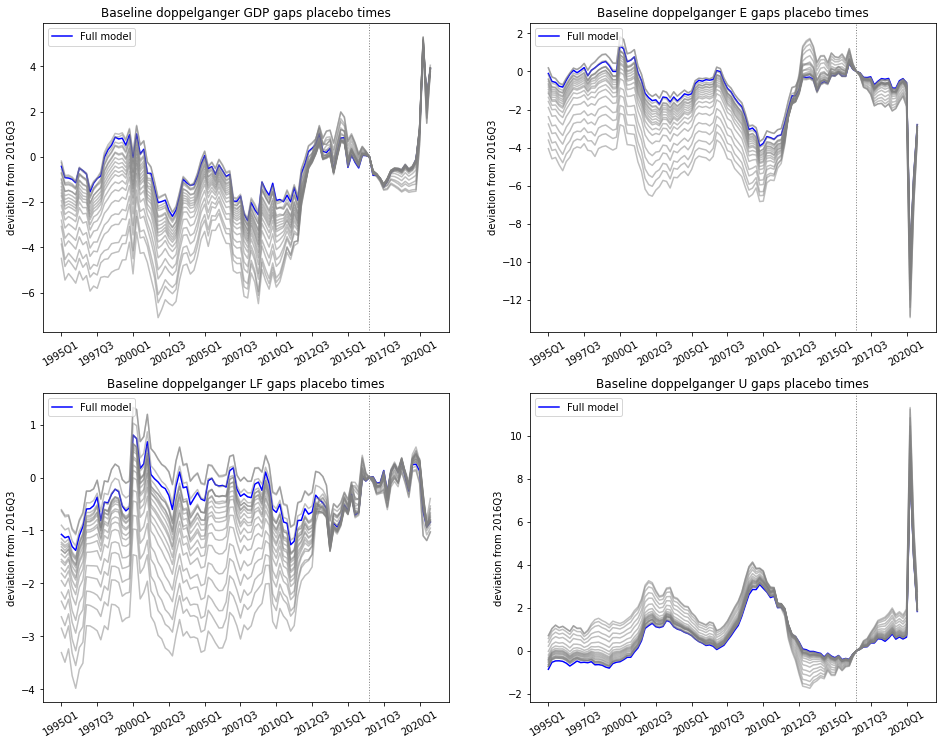

In [140]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)

time_gap_plotter_full(time_gap_dict_GDP, 'Baseline doppelganger GDP gaps placebo times')

plt.subplot(2,2,2)
time_gap_plotter_full(time_gap_dict_Employment, 'Baseline doppelganger E gaps placebo times')

plt.subplot(2,2,3)
time_gap_plotter_full(time_gap_dict_Labor_force, 'Baseline doppelganger LF gaps placebo times')

plt.subplot(2,2,4)
time_gap_plotter_full(time_gap_dict_Unemployment_rate, 'Baseline doppelganger U gaps placebo times')

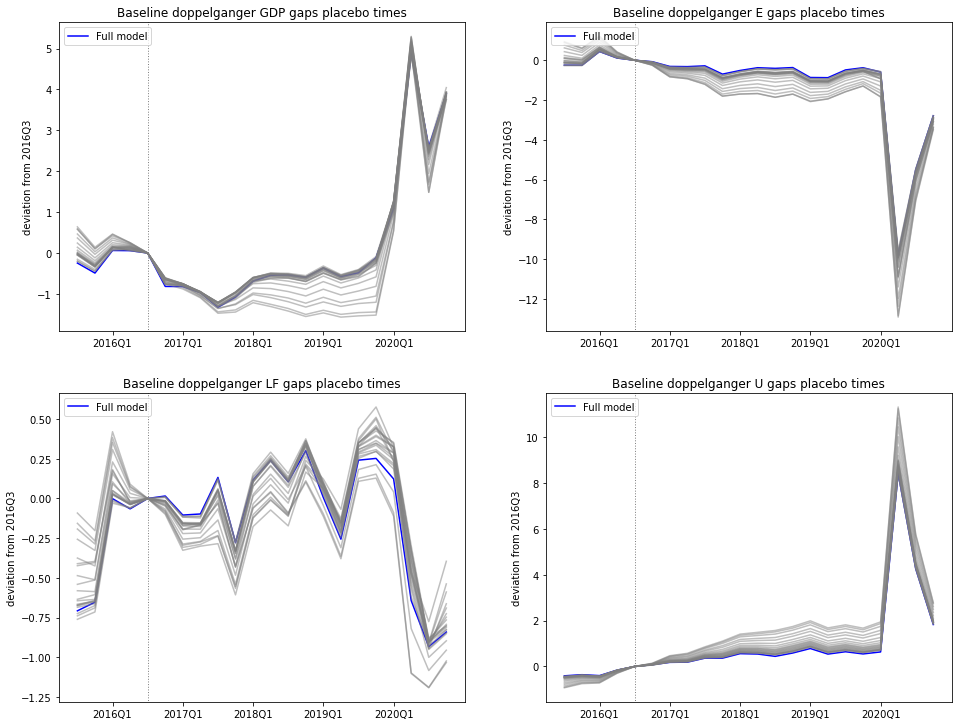

In [141]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)

time_gap_plotter_short(time_gap_dict_GDP, 'Baseline doppelganger GDP gaps placebo times')

plt.subplot(2,2,2)
time_gap_plotter_short(time_gap_dict_Employment, 'Baseline doppelganger E gaps placebo times')

plt.subplot(2,2,3)
time_gap_plotter_short(time_gap_dict_Labor_force, 'Baseline doppelganger LF gaps placebo times')

plt.subplot(2,2,4)
time_gap_plotter_short(time_gap_dict_Unemployment_rate, 'Baseline doppelganger U gaps placebo times')

In [142]:
df_time_results_baseline = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            time_gap_dict_GDP['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_GDP_baseline_pos,2), np.round(time_p_values_GDP_baseline_neg,2),
        (pd.DataFrame(np.sign(
            time_gap_dict_Employment['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_Employment_baseline_pos,2), np.round(time_p_values_Employment_baseline_neg,2),
        (pd.DataFrame(np.sign(
            time_gap_dict_Labor_force['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_Labor_force_baseline_pos,2), np.round(time_p_values_Labor_force_baseline_neg,2),
        (pd.DataFrame(np.sign(
            time_gap_dict_Unemployment_rate['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_Unemployment_rate_baseline_pos,2), np.round(time_p_values_Unemployment_rate_baseline_neg,2)
    ]).T)

time_p_baseline = pd.DataFrame(np.vstack([df_time_results_baseline.values, time_avg_pvalue_baseline]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(time_p_baseline.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

time_p_baseline

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.050000 & 0.950000 & - & 0.200000 & 0.800000 & + & 1.000000 & 0.000000 & + & 0.900000 & 0.100000 \\
2017Q1 & - & 0.050000 & 0.950000 & - & 0.150000 & 0.850000 & - & 0.200000 & 0.800000 & + & 0.250000 & 0.750000 \\
2017Q2 & - & 0.100000 & 0.900000 & - & 0.200000 & 0.800000 & - & 0.200000 & 0.800000 & + & 0.050000 & 0.950000 \\
2017Q3 & - & 0.100000 & 0.900000 & - & 0.300000 & 0.700000 & + & 1.000000 & 0.000000 & + & 0.400000 & 0.600000 \\
2017Q4 & - & 0.100000 & 0.900000 & - & 0.150000 & 0.850000 & - & 0.150000 & 0.850000 & + & 0.050000 & 0.950000 \\
2018Q1 & - & 0.100000 & 0.900000 & - & 0.200000 & 0.800000 & + & 1.000000 & 0.000000 & + & 0.250000 & 0.750000 \\
2018Q2 & - & 0.100000 & 0.900000 & - & 0.200000 & 0.800000 & + & 1.000000 & 0.000000 & + & 0.200000 & 0.800000 \\
2018Q3 & - & 0.100000 & 0.900000 & - & 0.250000 & 0.750000 & +

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.05,0.95,-,0.2,0.8,+,1.0,0.0,+,0.9,0.1
2017Q1,-,0.05,0.95,-,0.15,0.85,-,0.2,0.8,+,0.25,0.75
2017Q2,-,0.1,0.9,-,0.2,0.8,-,0.2,0.8,+,0.05,0.95
2017Q3,-,0.1,0.9,-,0.3,0.7,+,1.0,0.0,+,0.4,0.6
2017Q4,-,0.1,0.9,-,0.15,0.85,-,0.15,0.85,+,0.05,0.95
2018Q1,-,0.1,0.9,-,0.2,0.8,+,1.0,0.0,+,0.25,0.75
2018Q2,-,0.1,0.9,-,0.2,0.8,+,1.0,0.0,+,0.2,0.8
2018Q3,-,0.1,0.9,-,0.25,0.75,+,1.0,0.0,+,0.0,1.0
2018Q4,-,0.1,0.9,-,0.25,0.75,+,1.0,0.0,+,0.1,0.9
2019Q1,-,0.1,0.9,-,0.15,0.85,+,0.2,0.8,+,0.25,0.75


## 4. Sensitivity Analysis <a class="anchor" id="chapter4"></a>
### 4.1 SCM with one target variable <a class="anchor" id="section4_1"></a>
#### 4.1.1 Weights SC estimators <a class="anchor" id="section4_1_1"></a>

In [40]:
# Prepare data
GDP_indices = np.r_[0:87, 261:266]
Employment_indices = np.r_[87:174, 261:266]
Labor_force_indices = np.r_[174:266]
Covariate_indices = np.r_[261:266]

# Create y vectors, X matrices for SCM procedure with Unemployment rate
Unemployment_rate_USA_1995 = normalize_to_unity(Unemployment_rate, 'United States', 1995.00, 1995.75)

Unemployment_rate_donor_1995 = np.array([])
for country in countries:
    if country == 'United States': continue 
    Unemployment_rate_normalized_1995 = normalize_to_unity(Unemployment_rate, country, 1995.00, 1995.75)
    Unemployment_rate_donor_1995 = np.append(Unemployment_rate_donor_1995, Unemployment_rate_normalized_1995)
Unemployment_rate_donor_1995 = Unemployment_rate_donor_1995.reshape(24,104).T

In [41]:
# Create y vectors, X matrices for SCM procedure
y_GDP, X_GDP = y[GDP_indices], X[GDP_indices, :]
y_Employment, X_Employment = y[Employment_indices], X[Employment_indices, :]
y_Labor_force, X_Labor_force = y[Labor_force_indices], X[Labor_force_indices, :]
y_Unemployment_rate = (np.append(Unemployment_rate_USA_1995[:87], y[Covariate_indices])).reshape(92,1)
X_Unemployment_rate = np.vstack([Unemployment_rate_donor_1995[:87, :], X[Covariate_indices]])

# Fit SC estimator
SCfit_GDP = SyntheticControl().fit(X_GDP, y_GDP)
SCfit_Employment = SyntheticControl().fit(X_Employment, y_Employment)
SCfit_Labor_force = SyntheticControl().fit(X_Labor_force, y_Labor_force)
SCfit_Unemployment_rate = SyntheticControl().fit(X_Unemployment_rate, y_Unemployment_rate)

Function evaluation 1000/100000 	loss = 0.013661126482832981
Function evaluation 2000/100000 	loss = 0.012452532847756746
Function evaluation 3000/100000 	loss = 0.012254885164147146
Function evaluation 4000/100000 	loss = 0.012215417088608458
Function evaluation 5000/100000 	loss = 0.012213302768028058
Function evaluation 6000/100000 	loss = 0.01221320293977873
Function evaluation 7000/100000 	loss = 0.012220631695577725
Function evaluation 8000/100000 	loss = 0.012213200963555363
Function evaluation 9000/100000 	loss = 0.0122132008070277
Function evaluation 10000/100000 	loss = 0.012213200298589664
Function evaluation 11000/100000 	loss = 0.012213198993519732
Function evaluation 12000/100000 	loss = 0.01221319526851429
Function evaluation 13000/100000 	loss = 0.012213189584380797
Function evaluation 14000/100000 	loss = 0.012213188809833509
Function evaluation 15000/100000 	loss = 0.012213188154576544
Function evaluation 16000/100000 	loss = 0.012213187341450975
Function evaluation 1

Function evaluation 77000/100000 	loss = 0.011205086407151309
Function evaluation 78000/100000 	loss = 0.011205085884557046
Function evaluation 79000/100000 	loss = 0.011237414027228733
Function evaluation 80000/100000 	loss = 0.011205085233318323
Function evaluation 81000/100000 	loss = 0.011205085058638889
Function evaluation 82000/100000 	loss = 0.011205084942742197
Function evaluation 83000/100000 	loss = 0.011205084861600734
Function evaluation 84000/100000 	loss = 0.011205084822853668
Function evaluation 85000/100000 	loss = 0.01120508482202434
Function evaluation 86000/100000 	loss = 0.011205084822020503
Function evaluation 87000/100000 	loss = 0.011237414809599767
Function evaluation 88000/100000 	loss = 0.011237414809599736
Function evaluation 89000/100000 	loss = 0.01123741480959976
Function evaluation 90000/100000 	loss = 0.011237414809599784
Function evaluation 91000/100000 	loss = 0.01123741480959973
Function evaluation 92000/100000 	loss = 0.01123741480959973
Function eva

In [42]:
weights_SA1 = np.hstack([np.round(SCfit.weights.T,2), np.round(SCfit_GDP.weights.T,2), 
                            np.round(SCfit_Employment.weights.T,2), np.round(SCfit_Labor_force.weights.T,2),
                            np.round(SCfit_Unemployment_rate.weights.T,2)])

weights_table_SA1 = pd.DataFrame(weights_SA1,
                                 index=countries[:-1],
                                 columns = ['baseline', 'GDP-based', 'E-based', 'LF-based', 'U-based'])

weights_table_SA1

,baseline,GDP-based,E-based,LF-based,U-based
Australia,0.00,0.22,0.00,0.00,0.00
Austria,0.00,0.00,0.00,0.00,0.00
Belgium,0.00,0.00,0.00,0.00,0.00
Canada,0.20,0.00,0.00,0.13,0.00
Denmark,0.00,0.00,0.00,0.00,0.00
Finland,0.00,0.00,0.00,0.00,0.00
France,0.00,0.00,0.00,0.00,0.00
Germany,0.00,0.00,0.00,0.00,0.00
Hungary,0.00,0.00,0.00,0.00,0.00
Iceland,0.00,0.00,0.00,0.00,0.42


#### 4.1.2 Values covariates SC estimators <a class="anchor" id="section4_1_2"></a>

In [43]:
covariates_SA1 = np.round(np.hstack([100*y[-5:], 
                                    100*X[-5:] @ SCfit.weights.T,
                                    100*X[-5:] @ SCfit_GDP.weights.T,
                                    100*X[-5:] @ SCfit_Employment.weights.T,
                                    100*X[-5:] @ SCfit_Labor_force.weights.T,
                                    100*X[-5:] @ SCfit_Unemployment_rate.weights.T,]
                                  )
                         , 1)

covariates_table_SA1 = pd.DataFrame(data=covariates_SA1,
                                    index = ["Consumption/GDP","Investment/GDP","Net Exports/GDP",
                                             "Labor productivity growth","Unemployment rate"],
                                    columns = ['US', 'baseline', 'GDP-based', 'E-based', 'LF-based', 'U-based'])

covariates_table_SA1

,US,baseline,GDP-based,E-based,LF-based,U-based
Consumption/GDP,68.9,57.6,61.7,63.2,62.7,54.9
Investment/GDP,20.6,21.3,19.4,17.8,19.0,20.6
Net Exports/GDP,-4.3,2.0,-0.4,-0.4,-0.4,3.1
Labor productivity growth,-0.0,-0.0,-0.0,-0.1,0.1,0.2
Unemployment rate,5.0,7.0,5.6,6.2,8.4,4.5


#### 4.1.3 Figures SC estimators (Figure 1) <a class="anchor" id="section4_1_3"></a>

In [44]:
def gap_and_std_calculator(X_USA_2016, X_donor_2016, SCfit_X):
    gap_X = X_USA_2016[:87] - (X_donor_2016.T @ SCfit_X.weights.T)[:87].T
    std_X = gap_X.std()
    return gap_X, std_X 

gap_GDP2, std_GDP2 = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfit)
gap_GDP3, std_GDP3 = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfit_GDP)
gap_GDP4, std_GDP4 = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfit_Employment)
gap_GDP5, std_GDP5 = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfit_Labor_force)
gap_GDP6, std_GDP6 = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfit_Unemployment_rate)

gap_Employment2, std_Employment2 = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfit)
gap_Employment3, std_Employment3 = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfit_GDP)
gap_Employment4, std_Employment4 = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfit_Employment)
gap_Employment5, std_Employment5 = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfit_Labor_force)
gap_Employment6, std_Employment6 = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfit_Unemployment_rate)

gap_Labor_force2, std_Labor_force2 = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfit)
gap_Labor_force3, std_Labor_force3 = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfit_GDP)
gap_Labor_force4, std_Labor_force4 = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfit_Employment)
gap_Labor_force5, std_Labor_force5 = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfit_Labor_force)
gap_Labor_force6, std_Labor_force6 = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfit_Unemployment_rate)

gap_Unemployment_rate2, std_Unemployment_rate2 = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfit)
gap_Unemployment_rate3, std_Unemployment_rate3 = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfit_GDP)
gap_Unemployment_rate4, std_Unemployment_rate4 = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfit_Employment)
gap_Unemployment_rate5, std_Unemployment_rate5 = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfit_Labor_force)
gap_Unemployment_rate6, std_Unemployment_rate6 = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfit_Unemployment_rate)

In [45]:
def plotter_SA1(X_USA_2016, X_donor_2016, 
              std_X2, std_X3, std_X4, std_X5, std_X6,
              ymin, ymax, title, ylabel):
    plt.plot(np.arange(2015.5, 2021, 0.25), X_USA_2016[82:],
    color='b', label='USA')
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit.weights.T)[82:],
        color='r', linestyle='dashed', label='Doppelganger baseline')
    plt.fill_between(np.arange(2015.5, 2021, 0.25),
                     ((X_donor_2016.T @ SCfit.weights.T)[82:] - 2*std_X2).flatten(),
                     ((X_donor_2016.T @ SCfit.weights.T)[82:] + 2*std_X2).flatten(), color='r', alpha=.1)
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit_GDP.weights.T)[82:],
        color='green', linestyle='dashed', label='GDP-based')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfit_GDP.weights.T)[82:] - 2*std_X3).flatten(), 
                     ((X_donor_2016.T @ SCfit_GDP.weights.T)[82:] + 2*std_X3).flatten(), color='green', alpha=.1)
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit_Employment.weights.T)[82:],
        color='purple', linestyle='dashed', label='E-based')
    plt.fill_between(np.arange(2015.5, 2021, 0.25),
                     ((X_donor_2016.T @ SCfit_Employment.weights.T)[82:] - 2*std_X4).flatten(), 
                     ((X_donor_2016.T @ SCfit_Employment.weights.T)[82:] + 2*std_X4).flatten(), color='purple', alpha=.1)
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit_Labor_force.weights.T)[82:],
        color='grey', linestyle='dashed', label='LF-based')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfit_Labor_force.weights.T)[82:] - 2*std_X5).flatten(),
                     ((X_donor_2016.T @ SCfit_Labor_force.weights.T)[82:] + 2*std_X5).flatten(), color='grey', alpha=.1)
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit_Unemployment_rate.weights.T)[82:],
        color='y', linestyle='dashed', label='U-based')
    plt.fill_between(np.arange(2015.5, 2021, 0.25),
                     ((X_donor_2016.T @ SCfit_Unemployment_rate.weights.T)[82:] - 2*std_X6).flatten(),
                     ((X_donor_2016.T @ SCfit_Unemployment_rate.weights.T)[82:] + 2*std_X6).flatten(), color='y', alpha=.1)

    # Add details
    plt.axvline(x=2016.5, ymin=-100, ymax=100, color='grey', linestyle='dotted', linewidth=1)
    plt.axis([2015.5, 2020.75, ymin, ymax])
    plt.title(title)
    plt.ylabel(ylabel)
    plt.legend(loc = 'upper left', fontsize = '8')

    plt.text(2016.25, 0.95*ymin, 'Trump election')
    plt.xticks(range(2016, 2021, 1), ['2016Q1', '2017Q1', '2018Q1',
             '2019Q1', '2020Q1'])

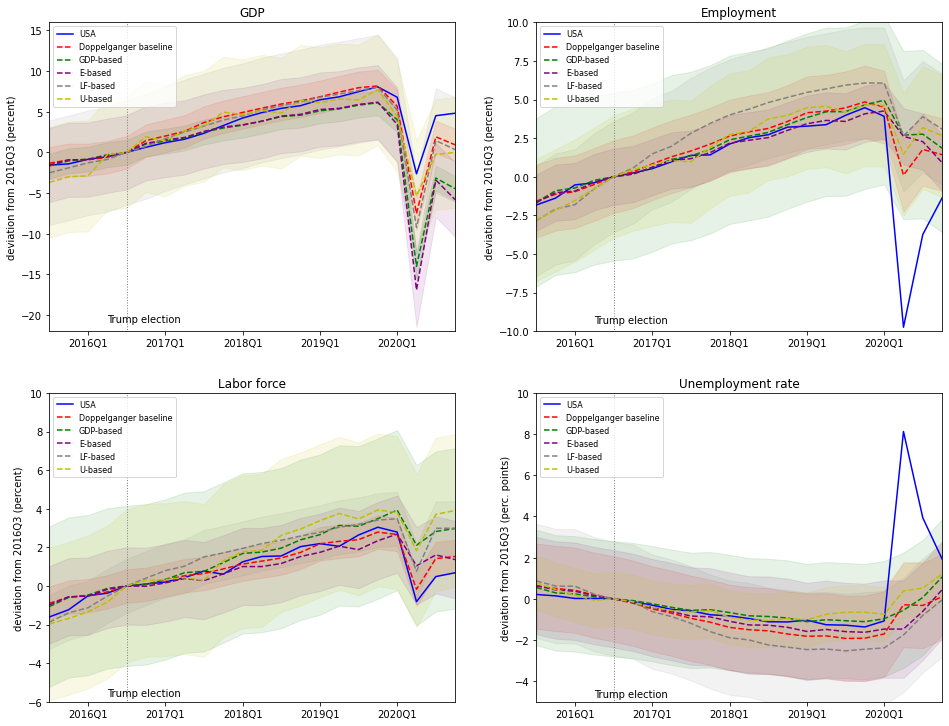

In [46]:
# Create figure
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
plotter_SA1(GDP_USA_2016, GDP_donor_2016,
            std_GDP2, std_GDP3, std_GDP4, std_GDP5, std_GDP6,
            -22, 16, 'GDP', 'deviation from 2016Q3 (percent)')

plt.subplot(2,2,2)
plotter_SA1(Employment_USA_2016, Employment_donor_2016,
            std_Employment2, std_Employment3, std_Employment4, std_Employment5, std_Employment6,
            -10, 10, 'Employment', 'deviation from 2016Q3 (percent)')

plt.subplot(2,2,3)
plotter_SA1(Labor_force_USA_2016, Labor_force_donor_2016,
            std_Labor_force2, std_Labor_force3, std_Labor_force4, std_Labor_force5, std_Labor_force6,
            -6, 10, 'Labor force', 'deviation from 2016Q3 (percent)')

plt.subplot(2,2,4)
plotter_SA1(Unemployment_rate_USA_2016, Unemployment_rate_donor_2016,
            std_Unemployment_rate2, std_Unemployment_rate3, std_Unemployment_rate4,
            std_Unemployment_rate5, std_Unemployment_rate6,
            -5, 10, 'Unemployment rate', 'deviation from 2016Q3 (perc. points)')

#### 4.1.4 Inference<a class="anchor" id="section4_1_4"></a>
#####  4.1.4.1 GDP-based <a class="anchor" id="section4_1_4_1"></a> 

In [47]:
df_XY_GDP = pd.DataFrame(np.hstack([X_GDP, y_GDP]), columns=countries)
(weight_dict_GDPbased, gap_dict_GDP_GDPbased, gap_dict_Employment_GDPbased,
 gap_dict_Labor_force_GDPbased, gap_dict_Unemployment_rate_GDPbased
) = placebo_weight_and_gap_computer(df_XY_GDP, SyntheticControl);


1/25 Performing SCM with placebo country Australia
Optimization terminated successfully.
         Current function value: 0.019482
         Iterations: 73808
         Function evaluations: 80796

2/25 Performing SCM with placebo country Austria
Optimization terminated successfully.
         Current function value: 0.002821
         Iterations: 39235
         Function evaluations: 45182

3/25 Performing SCM with placebo country Belgium
Optimization terminated successfully.
         Current function value: 0.002217
         Iterations: 26749
         Function evaluations: 30248

4/25 Performing SCM with placebo country Canada
Optimization terminated successfully.
         Current function value: 0.006005
         Iterations: 57703
         Function evaluations: 64344

5/25 Performing SCM with placebo country Denmark
Optimization terminated successfully.
         Current function value: 0.009902
         Iterations: 13328
         Function evaluations: 15558

6/25 Performing SCM with pla

##### Calculate p-values

In [48]:
p_values_GDP_GDPbased_pos, p_values_GDP_GDPbased_neg = pseudo_p_value(gap_dict_GDP_GDPbased)
p_values_Employment_GDPbased_pos, p_values_Employment_GDPbased_neg = pseudo_p_value(gap_dict_Employment_GDPbased)
(p_values_Labor_force_GDPbased_pos, 
 p_values_Labor_force_GDPbased_neg) = pseudo_p_value(gap_dict_Labor_force_GDPbased)
(p_values_Unemployment_rate_GDPbased_pos, 
 p_values_Unemployment_rate_GDPbased_neg) = pseudo_p_value(gap_dict_Unemployment_rate_GDPbased)

avg_pvalue_GDPbased = []
for gap_dict_X in [gap_dict_GDP_GDPbased, gap_dict_Employment_GDPbased, 
                   gap_dict_Labor_force_GDPbased, gap_dict_Unemployment_rate_GDPbased]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_GDPbased.append('+')
    else:
        avg_pvalue_GDPbased.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_GDPbased = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_GDPbased.append(df_avg_te_GDPbased)
    
avg_pvalue_GDPbased = np.hstack(avg_pvalue_GDPbased)

##### Plot

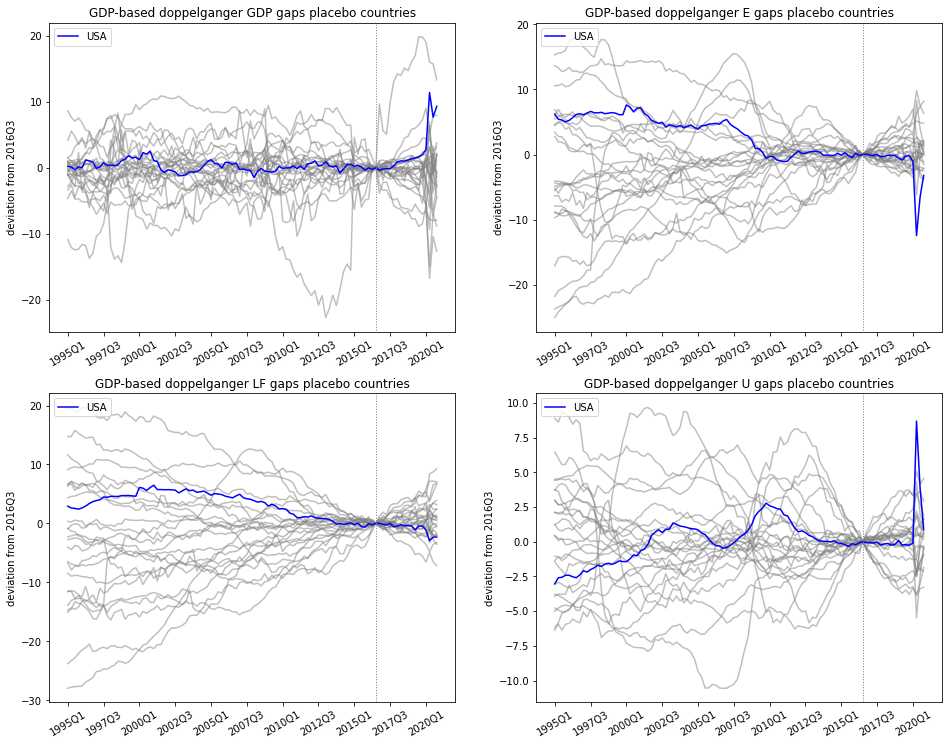

In [146]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_GDPbased, 'GDP-based doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_GDPbased, 'GDP-based doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_GDPbased, 'GDP-based doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_GDPbased, 'GDP-based doppelganger U gaps placebo countries')

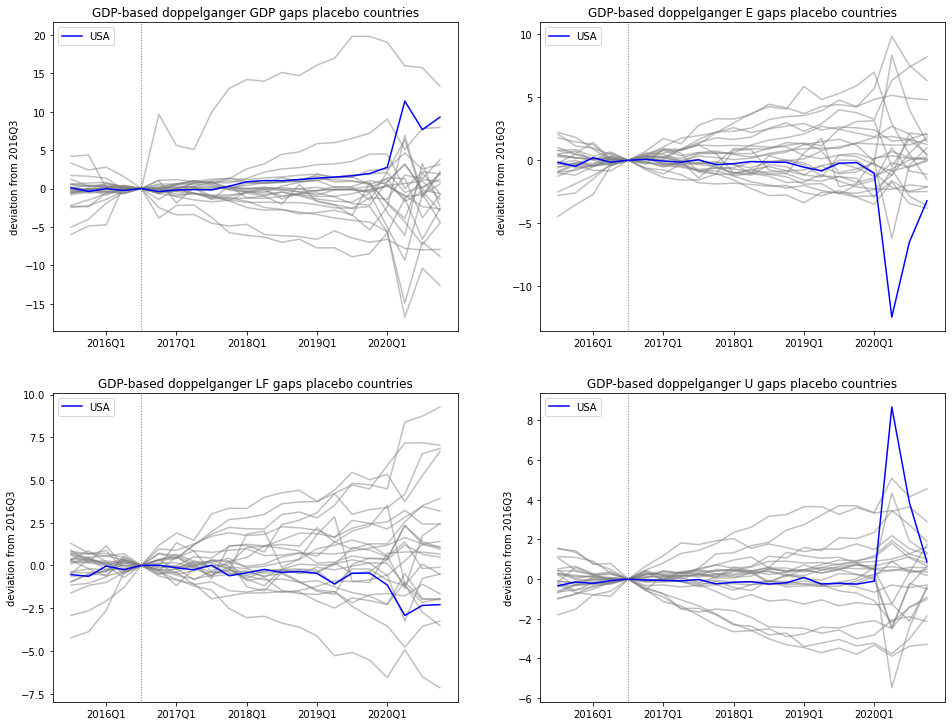

In [147]:
plt.figure(figsize=(16,12.5))

# GDP
plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_GDPbased, 
                    'GDP-based doppelganger GDP gaps placebo countries')

# Employment
plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_GDPbased, 
                    'GDP-based doppelganger E gaps placebo countries')

# Labor force
plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_GDPbased, 
                    'GDP-based doppelganger LF gaps placebo countries')

# Unemployment rate
plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_GDPbased, 
                    'GDP-based doppelganger U gaps placebo countries')

#### Table p-values

In [51]:
df_results_GDPbased = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_GDPbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_GDPbased_pos,2), np.round(p_values_GDP_GDPbased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_GDPbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_GDPbased_pos,2), np.round(p_values_Employment_GDPbased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_GDPbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_GDPbased_pos,2), np.round(p_values_Labor_force_GDPbased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_GDPbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_GDPbased_pos,2), np.round(p_values_Unemployment_rate_GDPbased_neg,2)
    ]).T)

p_GDPbased = pd.DataFrame(np.vstack([df_results_GDPbased.values, avg_pvalue_GDPbased]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_GDPbased.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_GDPbased

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.000000 & 1.000000 & + & 0.580000 & 0.420000 & + & 0.540000 & 0.460000 & - & 0.250000 & 0.750000 \\
2017Q1 & - & 0.210000 & 0.790000 & - & 0.420000 & 0.580000 & - & 0.250000 & 0.750000 & - & 0.250000 & 0.750000 \\
2017Q2 & - & 0.170000 & 0.830000 & - & 0.380000 & 0.620000 & - & 0.210000 & 0.790000 & - & 0.210000 & 0.790000 \\
2017Q3 & - & 0.210000 & 0.790000 & + & 0.540000 & 0.460000 & + & 0.540000 & 0.460000 & - & 0.420000 & 0.580000 \\
2017Q4 & + & 0.960000 & 0.040000 & - & 0.290000 & 0.710000 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 \\
2018Q1 & + & 0.960000 & 0.040000 & - & 0.420000 & 0.580000 & - & 0.290000 & 0.710000 & - & 0.210000 & 0.790000 \\
2018Q2 & + & 1.000000 & 0.000000 & - & 0.460000 & 0.540000 & - & 0.420000 & 0.580000 & - & 0.250000 & 0.750000 \\
2018Q3 & + & 0.960000 & 0.040000 & - & 0.460000 & 0.540000 & -

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.0,1.0,+,0.58,0.42,+,0.54,0.46,-,0.25,0.75
2017Q1,-,0.21,0.79,-,0.42,0.58,-,0.25,0.75,-,0.25,0.75
2017Q2,-,0.17,0.83,-,0.38,0.62,-,0.21,0.79,-,0.21,0.79
2017Q3,-,0.21,0.79,+,0.54,0.46,+,0.54,0.46,-,0.42,0.58
2017Q4,+,0.96,0.04,-,0.29,0.71,-,0.08,0.92,-,0.12,0.88
2018Q1,+,0.96,0.04,-,0.42,0.58,-,0.29,0.71,-,0.21,0.79
2018Q2,+,1.0,0.0,-,0.46,0.54,-,0.42,0.58,-,0.25,0.75
2018Q3,+,0.96,0.04,-,0.46,0.54,-,0.29,0.71,-,0.17,0.83
2018Q4,+,0.92,0.08,-,0.42,0.58,-,0.29,0.71,-,0.21,0.79
2019Q1,+,0.92,0.08,-,0.38,0.62,-,0.29,0.71,+,0.46,0.54


#####  4.1.4.2 E-based <a class="anchor" id="section4_1_4_2"></a> 

In [52]:
df_XY_Employment = pd.DataFrame(np.hstack([X_Employment, y_Employment]), columns=countries)
(weight_dict_Employmentbased, gap_dict_GDP_Employmentbased,
 gap_dict_Employment_Employmentbased, gap_dict_Labor_force_Employmentbased,
 gap_dict_Unemployment_rate_Employmentbased) = placebo_weight_and_gap_computer(df_XY_Employment, SyntheticControl)


1/25 Performing SCM with placebo country Australia
Optimization terminated successfully.
         Current function value: 0.055601
         Iterations: 22655
         Function evaluations: 25776

2/25 Performing SCM with placebo country Austria
Optimization terminated successfully.
         Current function value: 0.012021
         Iterations: 32712
         Function evaluations: 36529

3/25 Performing SCM with placebo country Belgium
Optimization terminated successfully.
         Current function value: 0.001301
         Iterations: 86527
         Function evaluations: 95756

4/25 Performing SCM with placebo country Canada
Optimization terminated successfully.
         Current function value: 0.007221
         Iterations: 78094
         Function evaluations: 84947

5/25 Performing SCM with placebo country Denmark
Optimization terminated successfully.
         Current function value: 0.014987
         Iterations: 39498
         Function evaluations: 43857

6/25 Performing SCM with pla

##### Calculate p-values

In [53]:
p_values_GDP_Employmentbased_pos, p_values_GDP_Employmentbased_neg = pseudo_p_value(gap_dict_GDP_Employmentbased)
p_values_Employment_Employmentbased_pos, p_values_Employment_Employmentbased_neg = pseudo_p_value(gap_dict_Employment_Employmentbased)
(p_values_Labor_force_Employmentbased_pos, 
 p_values_Labor_force_Employmentbased_neg) = pseudo_p_value(gap_dict_Labor_force_Employmentbased)
(p_values_Unemployment_rate_Employmentbased_pos, 
 p_values_Unemployment_rate_Employmentbased_neg) = pseudo_p_value(gap_dict_Unemployment_rate_Employmentbased)

avg_pvalue_Employmentbased = []
for gap_dict_X in [gap_dict_GDP_Employmentbased, gap_dict_Employment_Employmentbased, 
                   gap_dict_Labor_force_Employmentbased, gap_dict_Unemployment_rate_Employmentbased]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_Employmentbased.append('+')
    else:
        avg_pvalue_Employmentbased.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_Employmentbased = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_Employmentbased.append(df_avg_te_Employmentbased)
    
avg_pvalue_Employmentbased = np.hstack(avg_pvalue_Employmentbased)

##### Plot

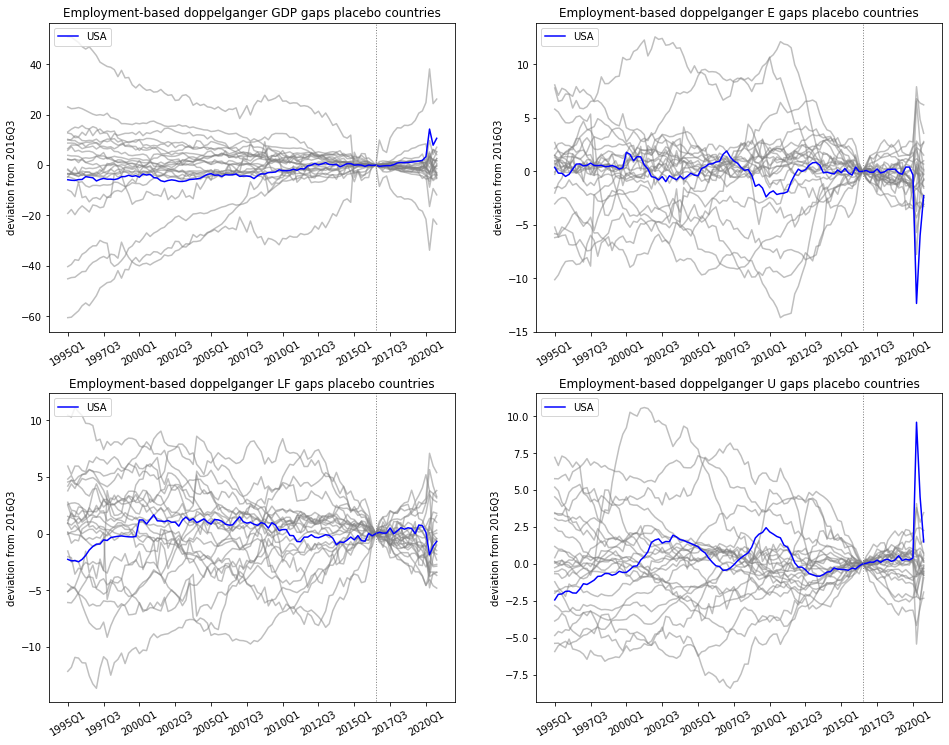

In [148]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_Employmentbased, 'Employment-based doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_Employmentbased, 'Employment-based doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_Employmentbased, 'Employment-based doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_Employmentbased, 'Employment-based doppelganger U gaps placebo countries')


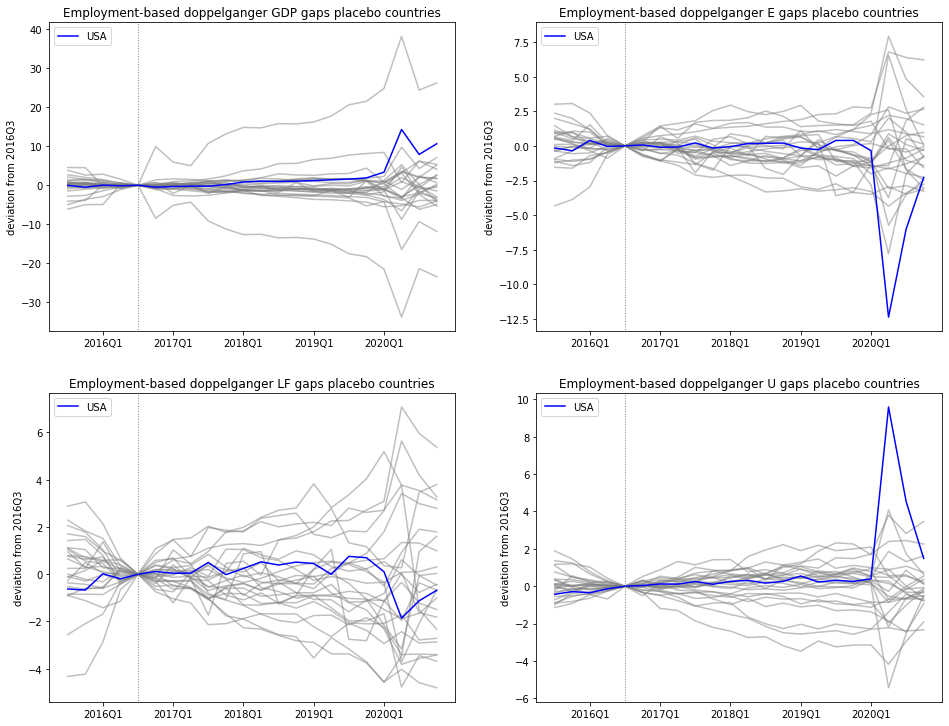

In [149]:
plt.figure(figsize=(16,12.5))

# GDP
plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_Employmentbased, 
                    'Employment-based doppelganger GDP gaps placebo countries')

# Employment
plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_Employmentbased, 
                    'Employment-based doppelganger E gaps placebo countries')

# Labor force
plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_Employmentbased, 
                    'Employment-based doppelganger LF gaps placebo countries')

# Unemployment rate
plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_Employmentbased, 
                    'Employment-based doppelganger U gaps placebo countries')

#### Table p-values

In [56]:
df_results_Employmentbased = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_Employmentbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_Employmentbased_pos,2), np.round(p_values_GDP_Employmentbased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_Employmentbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_Employmentbased_pos,2), np.round(p_values_Employment_Employmentbased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_Employmentbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_Employmentbased_pos,2), np.round(p_values_Labor_force_Employmentbased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_Employmentbased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_Employmentbased_pos,2), np.round(p_values_Unemployment_rate_Employmentbased_neg,2)
    ]).T)

p_Employmentbased = pd.DataFrame(np.vstack([df_results_Employmentbased.values, avg_pvalue_Employmentbased]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_Employmentbased.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_Employmentbased

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.250000 & 0.750000 & + & 0.830000 & 0.170000 & + & 0.920000 & 0.080000 & + & 0.620000 & 0.380000 \\
2017Q1 & - & 0.290000 & 0.710000 & - & 0.290000 & 0.710000 & + & 0.710000 & 0.290000 & + & 0.790000 & 0.210000 \\
2017Q2 & - & 0.290000 & 0.710000 & - & 0.290000 & 0.710000 & + & 0.880000 & 0.120000 & + & 0.710000 & 0.290000 \\
2017Q3 & - & 0.380000 & 0.620000 & + & 0.920000 & 0.080000 & + & 1.000000 & 0.000000 & + & 0.880000 & 0.120000 \\
2017Q4 & + & 0.710000 & 0.290000 & - & 0.330000 & 0.670000 & - & 0.580000 & 0.420000 & + & 0.540000 & 0.460000 \\
2018Q1 & + & 0.830000 & 0.170000 & - & 0.460000 & 0.540000 & + & 0.960000 & 0.040000 & + & 0.830000 & 0.170000 \\
2018Q2 & + & 0.830000 & 0.170000 & + & 0.960000 & 0.040000 & + & 1.000000 & 0.000000 & + & 0.830000 & 0.170000 \\
2018Q3 & + & 0.830000 & 0.170000 & + & 0.920000 & 0.080000 & +

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.25,0.75,+,0.83,0.17,+,0.92,0.08,+,0.62,0.38
2017Q1,-,0.29,0.71,-,0.29,0.71,+,0.71,0.29,+,0.79,0.21
2017Q2,-,0.29,0.71,-,0.29,0.71,+,0.88,0.12,+,0.71,0.29
2017Q3,-,0.38,0.62,+,0.92,0.08,+,1.0,0.0,+,0.88,0.12
2017Q4,+,0.71,0.29,-,0.33,0.67,-,0.58,0.42,+,0.54,0.46
2018Q1,+,0.83,0.17,-,0.46,0.54,+,0.96,0.04,+,0.83,0.17
2018Q2,+,0.83,0.17,+,0.96,0.04,+,1.0,0.0,+,0.83,0.17
2018Q3,+,0.83,0.17,+,0.92,0.08,+,0.96,0.04,+,0.62,0.38
2018Q4,+,0.83,0.17,+,0.83,0.17,+,1.0,0.0,+,0.58,0.42
2019Q1,+,0.83,0.17,-,0.38,0.62,+,0.96,0.04,+,0.88,0.12


#####  4.1.4.3 LF-based <a class="anchor" id="section4_1_4_3"></a> 

In [57]:
df_XY_Labor_force = pd.DataFrame(np.hstack([X_Labor_force, y_Labor_force]), columns=countries)
(
    weight_dict_Labor_forcebased, gap_dict_GDP_Labor_forcebased, 
    gap_dict_Employment_Labor_forcebased, gap_dict_Labor_force_Labor_forcebased, 
    gap_dict_Unemployment_rate_Labor_forcebased
) = placebo_weight_and_gap_computer(df_XY_Labor_force, SyntheticControl)


1/25 Performing SCM with placebo country Australia
Optimization terminated successfully.
         Current function value: 0.024189
         Iterations: 8179
         Function evaluations: 10286

2/25 Performing SCM with placebo country Austria
Optimization terminated successfully.
         Current function value: 0.012092
         Iterations: 33324
         Function evaluations: 40126

3/25 Performing SCM with placebo country Belgium
Optimization terminated successfully.
         Current function value: 0.001803
         Iterations: 36576
         Function evaluations: 40212

4/25 Performing SCM with placebo country Canada

5/25 Performing SCM with placebo country Denmark
Optimization terminated successfully.
         Current function value: 0.019078
         Iterations: 34774
         Function evaluations: 40214

6/25 Performing SCM with placebo country Finland
Optimization terminated successfully.
         Current function value: 0.003671
         Iterations: 66843
         Function

##### Calculate p-values

In [58]:
p_values_GDP_Labor_forcebased_pos, p_values_GDP_Labor_forcebased_neg = pseudo_p_value(gap_dict_GDP_Labor_forcebased)
p_values_Employment_Labor_forcebased_pos, p_values_Employment_Labor_forcebased_neg = pseudo_p_value(gap_dict_Employment_Labor_forcebased)
(p_values_Labor_force_Labor_forcebased_pos, 
 p_values_Labor_force_Labor_forcebased_neg) = pseudo_p_value(gap_dict_Labor_force_Labor_forcebased)
(p_values_Unemployment_rate_Labor_forcebased_pos, 
 p_values_Unemployment_rate_Labor_forcebased_neg) = pseudo_p_value(gap_dict_Unemployment_rate_Labor_forcebased)

avg_pvalue_Labor_forcebased = []
for gap_dict_X in [gap_dict_GDP_Labor_forcebased, gap_dict_Employment_Labor_forcebased, 
                   gap_dict_Labor_force_Labor_forcebased, gap_dict_Unemployment_rate_Labor_forcebased]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_Labor_forcebased.append('+')
    else:
        avg_pvalue_Labor_forcebased.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_Labor_forcebased = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_Labor_forcebased.append(df_avg_te_Labor_forcebased)
    
avg_pvalue_Labor_forcebased = np.hstack(avg_pvalue_Labor_forcebased)


##### Plot

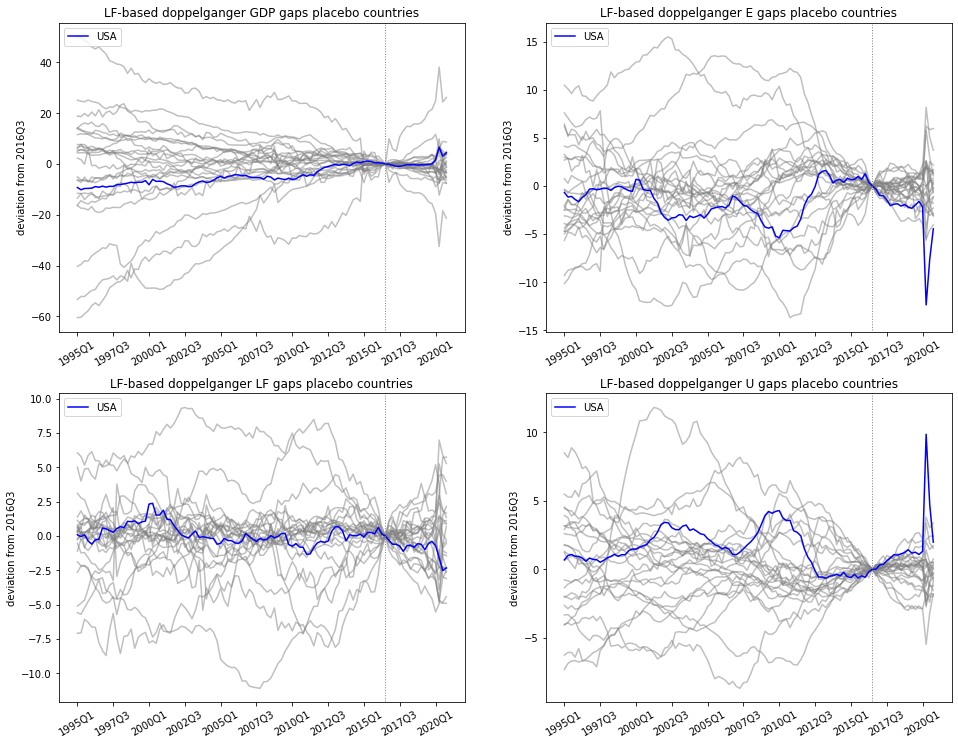

In [150]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_Labor_forcebased, 'LF-based doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_Labor_forcebased, 'LF-based doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_Labor_forcebased, 'LF-based doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_Labor_forcebased, 'LF-based doppelganger U gaps placebo countries')


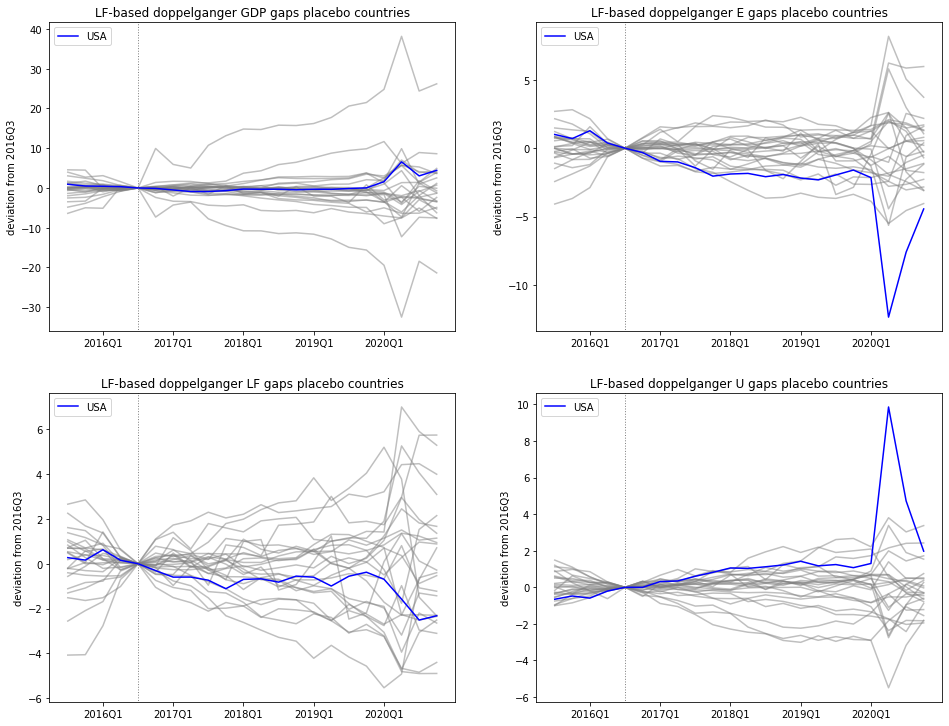

In [151]:
plt.figure(figsize=(16,12.5))

# GDP
plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_Labor_forcebased, 
                    'LF-based doppelganger GDP gaps placebo countries')

# Employment
plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_Labor_forcebased, 
                    'LF-based doppelganger E gaps placebo countries')

# Labor force
plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_Labor_forcebased, 
                    'LF-based doppelganger LF gaps placebo countries')

# Unemployment rate
plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_Labor_forcebased, 
                    'LF-based doppelganger U gaps placebo countries')

#### Table p-values

In [61]:
df_results_Labor_forcebased = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_Labor_forcebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_Labor_forcebased_pos,2), np.round(p_values_GDP_Labor_forcebased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_Labor_forcebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_Labor_forcebased_pos,2), np.round(p_values_Employment_Labor_forcebased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_Labor_forcebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_Labor_forcebased_pos,2), np.round(p_values_Labor_force_Labor_forcebased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_Labor_forcebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_Labor_forcebased_pos,2), np.round(p_values_Unemployment_rate_Labor_forcebased_neg,2)
    ]).T)

p_Labor_forcebased = pd.DataFrame(np.vstack([df_results_Labor_forcebased.values, avg_pvalue_Labor_forcebased]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_Labor_forcebased.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_Labor_forcebased

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.460000 & 0.540000 & - & 0.290000 & 0.710000 & - & 0.080000 & 0.920000 & - & 0.420000 & 0.580000 \\
2017Q1 & - & 0.380000 & 0.620000 & - & 0.170000 & 0.830000 & - & 0.040000 & 0.960000 & + & 0.790000 & 0.210000 \\
2017Q2 & - & 0.210000 & 0.790000 & - & 0.080000 & 0.920000 & - & 0.040000 & 0.960000 & + & 0.750000 & 0.250000 \\
2017Q3 & - & 0.290000 & 0.710000 & - & 0.170000 & 0.830000 & - & 0.120000 & 0.880000 & + & 0.830000 & 0.170000 \\
2017Q4 & - & 0.290000 & 0.710000 & - & 0.170000 & 0.830000 & - & 0.120000 & 0.880000 & + & 0.790000 & 0.210000 \\
2018Q1 & - & 0.500000 & 0.500000 & - & 0.120000 & 0.880000 & - & 0.170000 & 0.830000 & + & 0.790000 & 0.210000 \\
2018Q2 & - & 0.500000 & 0.500000 & - & 0.120000 & 0.880000 & - & 0.210000 & 0.790000 & + & 0.750000 & 0.250000 \\
2018Q3 & - & 0.540000 & 0.460000 & - & 0.170000 & 0.830000 & -

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.46,0.54,-,0.29,0.71,-,0.08,0.92,-,0.42,0.58
2017Q1,-,0.38,0.62,-,0.17,0.83,-,0.04,0.96,+,0.79,0.21
2017Q2,-,0.21,0.79,-,0.08,0.92,-,0.04,0.96,+,0.75,0.25
2017Q3,-,0.29,0.71,-,0.17,0.83,-,0.12,0.88,+,0.83,0.17
2017Q4,-,0.29,0.71,-,0.17,0.83,-,0.12,0.88,+,0.79,0.21
2018Q1,-,0.5,0.5,-,0.12,0.88,-,0.17,0.83,+,0.79,0.21
2018Q2,-,0.5,0.5,-,0.12,0.88,-,0.21,0.79,+,0.75,0.25
2018Q3,-,0.54,0.46,-,0.17,0.83,-,0.25,0.75,+,0.79,0.21
2018Q4,-,0.42,0.58,-,0.21,0.79,-,0.29,0.71,+,0.79,0.21
2019Q1,-,0.54,0.46,-,0.21,0.79,-,0.25,0.75,+,0.79,0.21


#####  4.1.4.4 U-based <a class="anchor" id="section4_1_4_4"></a> 

In [62]:
df_XY_Unemployment_rate = pd.DataFrame(np.hstack([X_Unemployment_rate, y_Unemployment_rate]), columns=countries)
(weight_dict_Unemployment_ratebased, gap_dict_GDP_Unemployment_ratebased, 
 gap_dict_Employment_Unemployment_ratebased, gap_dict_Labor_force_Unemployment_ratebased, 
 gap_dict_Unemployment_rate_Unemployment_ratebased) = placebo_weight_and_gap_computer(
    df_XY_Unemployment_rate, SyntheticControl)


1/25 Performing SCM with placebo country Australia
Optimization terminated successfully.
         Current function value: 0.254641
         Iterations: 26755
         Function evaluations: 30647

2/25 Performing SCM with placebo country Austria
Optimization terminated successfully.
         Current function value: 0.481176
         Iterations: 53297
         Function evaluations: 59178

3/25 Performing SCM with placebo country Belgium
Optimization terminated successfully.
         Current function value: 0.177087
         Iterations: 10660
         Function evaluations: 12813

4/25 Performing SCM with placebo country Canada
Optimization terminated successfully.
         Current function value: 0.074612
         Iterations: 55925
         Function evaluations: 61311

5/25 Performing SCM with placebo country Denmark
Optimization terminated successfully.
         Current function value: 0.461718
         Iterations: 27482
         Function evaluations: 31149

6/25 Performing SCM with pla

##### Calculate p-values

In [63]:
p_values_GDP_Unemployment_ratebased_pos, p_values_GDP_Unemployment_ratebased_neg = pseudo_p_value(gap_dict_GDP_Unemployment_ratebased)
p_values_Employment_Unemployment_ratebased_pos, p_values_Employment_Unemployment_ratebased_neg = pseudo_p_value(gap_dict_Employment_Unemployment_ratebased)
(p_values_Labor_force_Unemployment_ratebased_pos, 
 p_values_Labor_force_Unemployment_ratebased_neg) = pseudo_p_value(gap_dict_Labor_force_Unemployment_ratebased)
(p_values_Unemployment_rate_Unemployment_ratebased_pos, 
 p_values_Unemployment_rate_Unemployment_ratebased_neg) = pseudo_p_value(gap_dict_Unemployment_rate_Unemployment_ratebased)

avg_pvalue_Unemployment_ratebased = []
for gap_dict_X in [gap_dict_GDP_Unemployment_ratebased, gap_dict_Employment_Unemployment_ratebased, 
                   gap_dict_Labor_force_Unemployment_ratebased, gap_dict_Unemployment_rate_Unemployment_ratebased]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_Unemployment_ratebased.append('+')
    else:
        avg_pvalue_Unemployment_ratebased.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_Unemployment_ratebased = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_Unemployment_ratebased.append(df_avg_te_Unemployment_ratebased)
    
avg_pvalue_Unemployment_ratebased = np.hstack(avg_pvalue_Unemployment_ratebased)

##### Plot

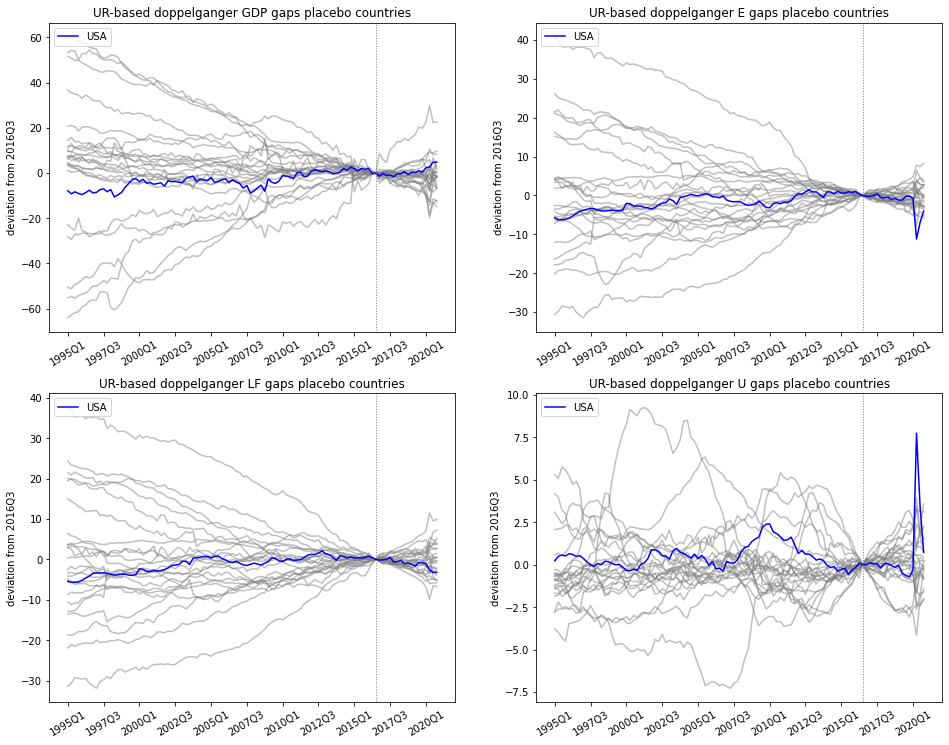

In [152]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_Unemployment_ratebased, 'UR-based doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_Unemployment_ratebased, 'UR-based doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_Unemployment_ratebased, 'UR-based doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_Unemployment_ratebased, 'UR-based doppelganger U gaps placebo countries')


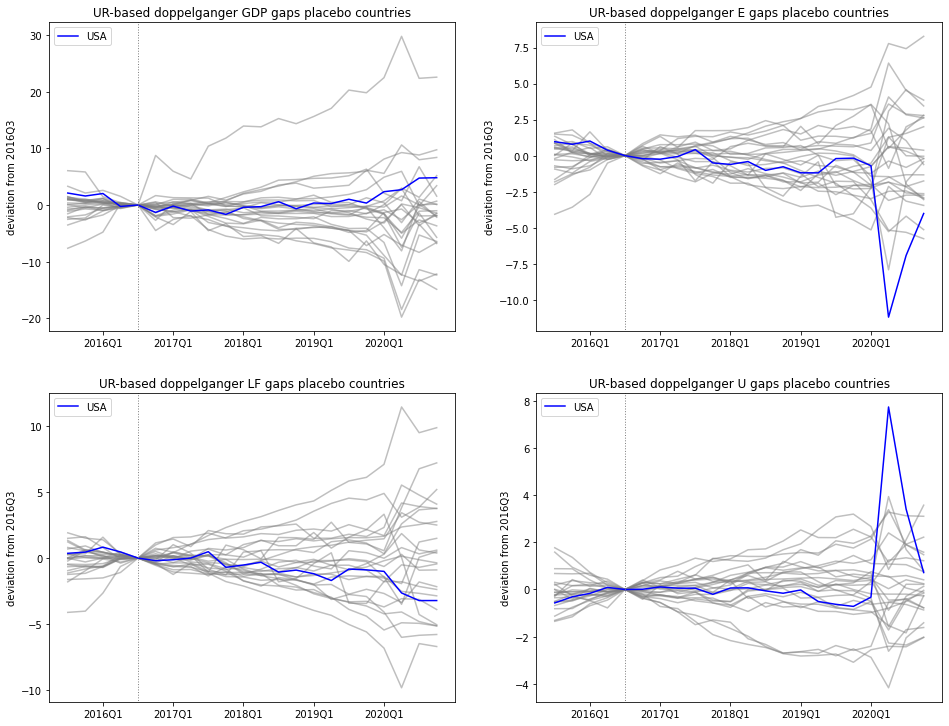

In [153]:
plt.figure(figsize=(16,12.5))

# GDP
plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_Unemployment_ratebased,
                    'UR-based doppelganger GDP gaps placebo countries')

# Employment
plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_Unemployment_ratebased,
                    'UR-based doppelganger E gaps placebo countries')

# Labor force
plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_Unemployment_ratebased,
                    'UR-based doppelganger LF gaps placebo countries')

# Unemployment rate
plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_Unemployment_ratebased,
                    'UR-based doppelganger U gaps placebo countries')

#### Table p-values

In [66]:
df_results_Unemployment_ratebased = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_Unemployment_ratebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_Unemployment_ratebased_pos,2), np.round(p_values_GDP_Unemployment_ratebased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_Unemployment_ratebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_Unemployment_ratebased_pos,2), np.round(p_values_Employment_Unemployment_ratebased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_Unemployment_ratebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_Unemployment_ratebased_pos,2), np.round(p_values_Labor_force_Unemployment_ratebased_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_Unemployment_ratebased['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_Unemployment_ratebased_pos,2), np.round(p_values_Unemployment_rate_Unemployment_ratebased_neg,2)
    ]).T)

p_Unemployment_ratebased = pd.DataFrame(np.vstack([df_results_Unemployment_ratebased.values, avg_pvalue_Unemployment_ratebased]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_Unemployment_ratebased.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_Unemployment_ratebased

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.330000 & 0.670000 & - & 0.120000 & 0.880000 & - & 0.120000 & 0.880000 & + & 0.540000 & 0.460000 \\
2017Q1 & - & 0.380000 & 0.620000 & - & 0.120000 & 0.880000 & - & 0.120000 & 0.880000 & + & 0.710000 & 0.290000 \\
2017Q2 & - & 0.210000 & 0.790000 & - & 0.210000 & 0.790000 & + & 0.620000 & 0.380000 & + & 0.540000 & 0.460000 \\
2017Q3 & - & 0.290000 & 0.710000 & + & 0.960000 & 0.040000 & + & 0.960000 & 0.040000 & + & 0.460000 & 0.540000 \\
2017Q4 & - & 0.290000 & 0.710000 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 & - & 0.210000 & 0.790000 \\
2018Q1 & - & 0.380000 & 0.620000 & - & 0.120000 & 0.880000 & - & 0.120000 & 0.880000 & + & 0.500000 & 0.500000 \\
2018Q2 & - & 0.460000 & 0.540000 & - & 0.210000 & 0.790000 & - & 0.170000 & 0.830000 & + & 0.500000 & 0.500000 \\
2018Q3 & + & 0.920000 & 0.080000 & - & 0.080000 & 0.920000 & -

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.33,0.67,-,0.12,0.88,-,0.12,0.88,+,0.54,0.46
2017Q1,-,0.38,0.62,-,0.12,0.88,-,0.12,0.88,+,0.71,0.29
2017Q2,-,0.21,0.79,-,0.21,0.79,+,0.62,0.38,+,0.54,0.46
2017Q3,-,0.29,0.71,+,0.96,0.04,+,0.96,0.04,+,0.46,0.54
2017Q4,-,0.29,0.71,-,0.08,0.92,-,0.12,0.88,-,0.21,0.79
2018Q1,-,0.38,0.62,-,0.12,0.88,-,0.12,0.88,+,0.5,0.5
2018Q2,-,0.46,0.54,-,0.21,0.79,-,0.17,0.83,+,0.5,0.5
2018Q3,+,0.92,0.08,-,0.08,0.92,-,0.12,0.88,-,0.25,0.75
2018Q4,-,0.33,0.67,-,0.12,0.88,-,0.12,0.88,-,0.17,0.83
2019Q1,+,0.88,0.12,-,0.08,0.92,-,0.08,0.92,-,0.33,0.67


### 4.2 SCM with different V matrices <a class="anchor" id="section4_2"></a>
#### 4.2.1 Alternatives class definitions<a class="anchor" id="section4_2_1"></a>

In [67]:
class SyntheticControlVAR:
    """
    The synthetic control method is a statistical method used to evaluate the effect
    of an intervention in comparative case studies. It involves the construction of 
    a weighted combination of groups used as controls, to which the treatment group is 
    compared.


    Parameters
    ----------
    weight_nonnegative_restr : bool, default = True
        Whether to include nonnegative restriction on weights.
        
    weight_sum_restr : bool, default = True
        Whether to include restriction of summing to 1 of weights.
        
    verbose_inner
    
        
    Attributes
    ----------
    n_donorcountries : int
        Number of donor countries seen during method `fit`.
    
    weights : ndarray of shape n_donorcountries
        Fitted coefficient of the features in the decision function. When fit_intercept is
        set to true, coefficients includes bias term, hence first value is intercept.
        
    
    Methods
    ----------
    fit(X,y)
        Fit Synthetic Control Method and estimate weights.
    """
    
    def __init__(
        self,
        weight_nonnegative_restr = True,
        weight_sum_restr = True,
        verbose_inner = False,
    ):
        self.weight_nonnegative_restr = weight_nonnegative_restr
        self.weight_sum_restr = weight_sum_restr
        self.verbose_inner = verbose_inner
       
    def fit(self, X, y):
        """
        Fit Synthetic Control Method.

        Parameters
        ----------
        X : array of shape (n_samples, n_donorcountries)
            Data of donor countries, stacked in matrix.
        y : array of shape (n_samples)
            Data of treatment country, stacked in vector.

        Returns
        -------
        self : object
            Fitted Estimator.
        """

        # Find number of donor countries
        self.n_donorcountries = np.shape(X)[1]

        # Define V matrix
        self.V = np.diag(1/np.var(X, axis=1))

        # Set up optimization for quadratic programming
        H = np.dot(X.T, np.dot(self.V, X))
        l = np.shape(X)[1]

        # Transform to correct CVxOPT types
        Q = matrix((H + H.T)/2)
        r = matrix((-np.dot(y.T, np.dot(self.V,X))).T)
        G = matrix(-np.eye(l))
        h = matrix(np.zeros(l))
        A = matrix(np.ones(l)).T
        b = matrix(1.0)

        # Optimization and resulting weights
        if not self.weight_nonnegative_restr:
            G, h  = None, None
        if not self.weight_sum_restr:
            A, b = None, None

        self.weights = np.array(solvers.qp(Q, r, G, h, A, b)['x']).T[0]

        return self


class SyntheticControlCV:
    """
    The synthetic control method is a statistical method used to evaluate the effect
    of an intervention in comparative case studies. It involves the construction of 
    a weighted combination of groups used as controls, to which the treatment group is 
    compared.
    
    
    Parameters
    ----------
    outer_loop_method : string, default = 'Nelder-Mead'
        Optimisation procedure used in outer scipy.minimize loop. Options are [‘Nelder-Mead’, 
        ‘Powell’, ‘CG’, ‘BFGS’, ‘Newton-CG’, ‘L-BFGS-B’, ‘TNC’, ‘COBYLA’, ‘SLSQP’, 
        ‘trust-constr’, ‘dogleg’, ‘trust-ncg’, ‘trust-exact’, ‘trust-krylov’, custom] 

    maxiter : int, default = 1000000
        Maximum number of iterations in optimisation.

    maxfev : int, default = 1000000
        Maximum number of function evaluations in optimisation.

    xatol : float, default = 1e-3
        X tolerance for optimisation loop.

    fatol : float, default = 1e-12
        Function tolerance for optimisation loop.

    verbose_outer : bool, default = True
        Boolean to print or suppress epochs in outer loop.

    verbose_inner : bool, default = True
        Boolean to print or suppress epochs in inner loop.

    weight_nonnegative_restr : bool, default = True
        Whether to include nonnegative restriction on weights.

    weight_sum_restr : bool, default = True
        Whether to include restriction of summing to 1 of weights.


    Attributes
    ----------
    n_donorcountries : int
        Number of donor countries seen during method `fit`.

    weights : ndarray of shape n_donorcountries
        Fitted coefficient of the features in the decision function. When fit_intercept is
        set to true, coefficients includes bias term, hence first value is intercept.


    Methods
    ---------- 
    fit(X,y)
        Fit Synthetic Control Method and estimate weights.

    """

    def __init__(
        self,
        outer_loop_method = 'Nelder-Mead',
        maxiter = maxiter,
        maxfev = maxfev,
        xatol = 1e-3,
        fatol = 1e-12,
        verbose_outer = True,
        verbose_inner = True,
        weight_nonnegative_restr = True,
        weight_sum_restr = True,
        count = 0,
    ):
        self.outer_loop_method = outer_loop_method
        self.maxiter = maxiter
        self.maxfev = maxfev
        self.xatol = xatol
        self.fatol = fatol
        self.verbose_outer = verbose_outer
        self.verbose_inner = verbose_inner
        self.weight_nonnegative_restr = weight_nonnegative_restr
        self.weight_sum_restr = weight_sum_restr
        self.count = count
        
    def _loss_function(self, v2, y_train, X_train, y_validation, X_validation):
        """
        Define loss function for inner loop.

        Parameters
        ----------
        v2 : array of shape (n_samples - 1)
            Initial values for V matrix.

        y_train : array of shape (n_training_samples)
            Training data of treatment country, stacked in vector.

        X_train : array of shape (n_training_samples, n_donorcountries)
            Training data of donor countries, stacked in matrix.

        y_validation : array of shape (n_validation_samples)
            Validation data of treatment country, stacked in vector.

        X_validation : array of shape (n_validation_samples, n_donorcountries)
            Validation data of donor countries, stacked in matrix.


        Returns
        -------
        SSR : float
            Sum of squared residuals after optimization inner loop.
        """

        # Initalize matrices
        V = np.diag(np.insert(np.exp(v2), 0, 1))
        H = np.dot(X_train.T, np.dot(V, X_train))
        l = np.shape(X_train)[1]

        # Create correct CVxOPT matrices for quad. optimization loop with constraints
        Q = matrix((H + H.T)/2)
        r = matrix((-np.dot(y_train.T, np.dot(V, X_train))).T)
        G = matrix(-np.eye(l))
        h = matrix(np.zeros(l))
        A = matrix(np.ones(l)).T
        b = matrix(1.0)

        # Optimization
        if not self.weight_nonnegative_restr:
            G, h  = None, None
        if not self.weight_sum_restr:
            A, b = None, None

        w = solvers.qp(Q, r, G, h, A, b)['x']
        SSR = np.sum((y_validation - np.dot(X_validation, w))**2)

        # Print progress
        self.count += 1
        if (self.verbose_inner) & (self.count%1000==0):
            print(f'Function evaluation {self.count}/{self.maxfev} \tloss = {SSR}')

        return SSR

    def fit(self, X, y):
        """
        Fit Synthetic Control Method.

        Parameters
        ----------
        X : array of shape (n_samples, n_donorcountries)
            Data of donor countries, stacked in matrix.
        y : array of shape (n_samples)
            Data of treatment country, stacked in vector.

        Returns
        -------
        self : object
            Fitted Estimator.
        """

        # Find number of donor countries
        self.n_donorcountries = np.shape(X)[1]

        # 1. Divide the pre-intervention periods into a initial training and validation period
        # Training set contains 1995-2006 + cov, validation set contains 2006-2016 + cov
        y_train = np.vstack([y[0:44], y[87:87+44], y[174:174+44], y[-5:]])
        X_train = np.vstack([X[0:44, :], X[87:87+44, :], X[174:174+44, :], X[-5:, :]])
        y_validation = np.vstack([y[44:87], y[87+44:174], y[174+44:261], y[-5:]])
        X_validation = np.vstack([X[44:87, :], X[87+44:174, :], X[174+44:261, :], X[-5:, :]])

        # Set starting values for outer loop
        s = np.hstack((y_train, X_train)).std(axis=1)
        s1, s2 = s[0], s[1:]
        v20 = np.log((s1/s2)**2)
        minimize_options = {'maxiter': self.maxiter, 
                            'maxfev': self.maxfev,
                            'disp': self.verbose_outer,
                            'xatol': self.xatol, 
                            'fatol': self.fatol}

        # Outer loop
        result = minimize(self._loss_function, v20, args=(y_train, X_train, y_validation, X_validation), 
                          method=self.outer_loop_method, options = minimize_options)
        v2 = result.x

        # Store results outer loop
        self.success = result.success
        self.message = result.message

        # Restore weights from V weights
        self.V = np.diag(np.insert(np.exp(v2), 0, 1))
        H = np.dot(X_train.T, np.dot(self.V, X_train))
        l = np.shape(X_train)[1]

        # Transform to correct CVxOPT types
        Q = matrix((H + H.T)/2)
        r = matrix((-np.dot(y_train.T, np.dot(self.V, X_train))).T)
        G = matrix(-np.eye(l))
        h = matrix(np.zeros(l))
        A = matrix(np.ones(l)).T
        b = matrix(1.0)

        # Optimization and resulting weights
        if not self.weight_nonnegative_restr:
            G, h  = None, None
        if not self.weight_sum_restr:
            A, b = None, None

        self.weights = np.array(solvers.qp(Q, r, G, h, A, b)['x']).T

        return self

#### 4.2.2 Weights SC estimators<a class="anchor" id="section4_2_2"></a>

In [68]:
SCfitVAR = SyntheticControlVAR().fit(X,y)
SCfitCV = SyntheticControlCV().fit(X,y)

Function evaluation 1000/100000 	loss = 0.05435923877708243
Function evaluation 2000/100000 	loss = 0.04996160326024256
Function evaluation 3000/100000 	loss = 0.04405890890491538
Function evaluation 4000/100000 	loss = 0.043124013836090325
Function evaluation 5000/100000 	loss = 0.0426179324189936
Function evaluation 6000/100000 	loss = 0.042417520946186844
Function evaluation 7000/100000 	loss = 0.04218155451932046
Function evaluation 8000/100000 	loss = 0.04185090369832102
Function evaluation 9000/100000 	loss = 0.04150213161836751
Function evaluation 10000/100000 	loss = 0.041317152186520045
Function evaluation 11000/100000 	loss = 0.0411694256449297
Function evaluation 12000/100000 	loss = 0.041005292627863676
Function evaluation 13000/100000 	loss = 0.040816074787199313
Function evaluation 14000/100000 	loss = 0.04060938712798025
Function evaluation 15000/100000 	loss = 0.04039402398494552
Function evaluation 16000/100000 	loss = 0.040233024965545094
Function evaluation 17000/100

In [69]:
weights_SA2 = np.hstack([np.round(SCfit.weights.T,2),
                         np.round(SCfitVAR.weights.T.reshape(24,1),2),
                         np.round(SCfitCV.weights.T,2)])

weights_table_SA2 = pd.DataFrame(weights_SA2,
                                 index=countries[:-1],
                                 columns = ['baseline', 'inverted variance', 'cross-validation'])

weights_table_SA2

,baseline,inverted variance,cross-validation
Australia,0.00,0.00,0.00
Austria,0.00,0.00,0.00
Belgium,0.00,0.00,0.00
Canada,0.20,0.25,0.28
Denmark,0.00,0.00,0.00
Finland,0.00,0.00,0.00
France,0.00,0.00,0.00
Germany,0.00,0.00,0.00
Hungary,0.00,0.00,0.00
Iceland,0.00,0.00,0.00


#### 4.2.3. Values covariates SC estimators (Table 1)<a class="anchor" id="section4_2_3"></a>

In [70]:
covariates_SA2 = np.round(np.hstack([100*y[-5:], 
                                    100*X[-5:] @ SCfit.weights.T,
                                    (100*X[-5:] @ SCfitVAR.weights.T).reshape(5,1),
                                    100*X[-5:] @ SCfitCV.weights.T]
                                  )
                         , 1)

covariates_table_SA2 = pd.DataFrame(data=covariates_SA2,
                                    index=["Consumption/GDP","Investment/GDP",
                                           "Net Exports/GDP","Labor productivity growth","Unemployment rate"],
                                    columns=['US', 'baseline', 'inverted variance', 'cross-validation'])

covariates_table_SA2

,US,baseline,inverted variance,cross-validation
Consumption/GDP,68.9,57.6,57.0,56.7
Investment/GDP,20.6,21.3,21.6,21.8
Net Exports/GDP,-4.3,2.0,2.4,2.2
Labor productivity growth,-0.0,-0.0,-0.0,-0.0
Unemployment rate,5.0,7.0,7.4,7.4


#### 4.2.4. Figures SC estimators (Figure 1)<a class="anchor" id="section4_2_4"></a>

In [71]:
gap_GDPbas, std_GDPbas = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfit)
gap_GDPvar, std_GDPvar = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfitVAR)
gap_GDPcv, std_GDPcv = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfitCV)

gap_Employmentbas, std_Employmentbas = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfit)
gap_Employmentvar, std_Employmentvar = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfitVAR)
gap_Employmentcv, std_Employmentcv = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfitCV)

gap_Labor_forcebas, std_Labor_forcebas = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfit)
gap_Labor_forcevar, std_Labor_forcevar = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfitVAR)
gap_Labor_forcecv, std_Labor_forcecv = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfitCV)

gap_Unemployment_ratebas, std_Unemployment_ratebas = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfit)
gap_Unemployment_ratevar, std_Unemployment_ratevar = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfitVAR)
gap_Unemployment_ratecv, std_Unemployment_ratecv = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfitCV)

In [72]:
def plotter_SA2(X_USA_2016, X_donor_2016,
                std_Xbas, std_Xvar, std_Xcv,
                ymin, ymax, title, ylabel):
    
    # Plot treatment and doppelganger, and standard errors
    plt.plot(np.arange(2015.5, 2021, 0.25), X_USA_2016[82:],
        color='b', label='USA')
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit.weights.T)[82:],
        color='r', linestyle='dashed', label='baseline')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfit.weights.T)[82:] - 2*std_Xbas).flatten(), 
                     ((X_donor_2016.T @ SCfit.weights.T)[82:] + 2*std_Xbas).flatten(), color='r', alpha=.1)
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfitVAR.weights.T)[82:],
        color='black', linestyle='dashed', label='Inverted variance')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfitVAR.weights.T)[82:] - 2*std_Xvar).flatten(), 
                     ((X_donor_2016.T @ SCfitVAR.weights.T)[82:] + 2*std_Xvar).flatten(), color='black', alpha=.1)
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfitCV.weights.T)[82:],
        color='green', linestyle='dashed', label='Cross-validation')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfitCV.weights.T)[82:] - 2*std_Xcv).flatten(), 
                     ((X_donor_2016.T @ SCfitCV.weights.T)[82:] + 2*std_Xcv).flatten(), color='green', alpha=.1)

    # Add details
    plt.axvline(x=2016.5, ymin=-100, ymax=100, color='grey', linestyle='dotted', linewidth=1)
    plt.axis([2015.5, 2020.75, ymin, ymax])
    plt.title(title)
    plt.ylabel(ylabel)
    plt.legend(loc = 'upper left', fontsize = '9')

    plt.text(2016.25, 0.95*ymin,'Trump election')
    plt.xticks(range(2016, 2021, 1), ['2016Q1', '2017Q1', '2018Q1',
             '2019Q1', '2020Q1']);

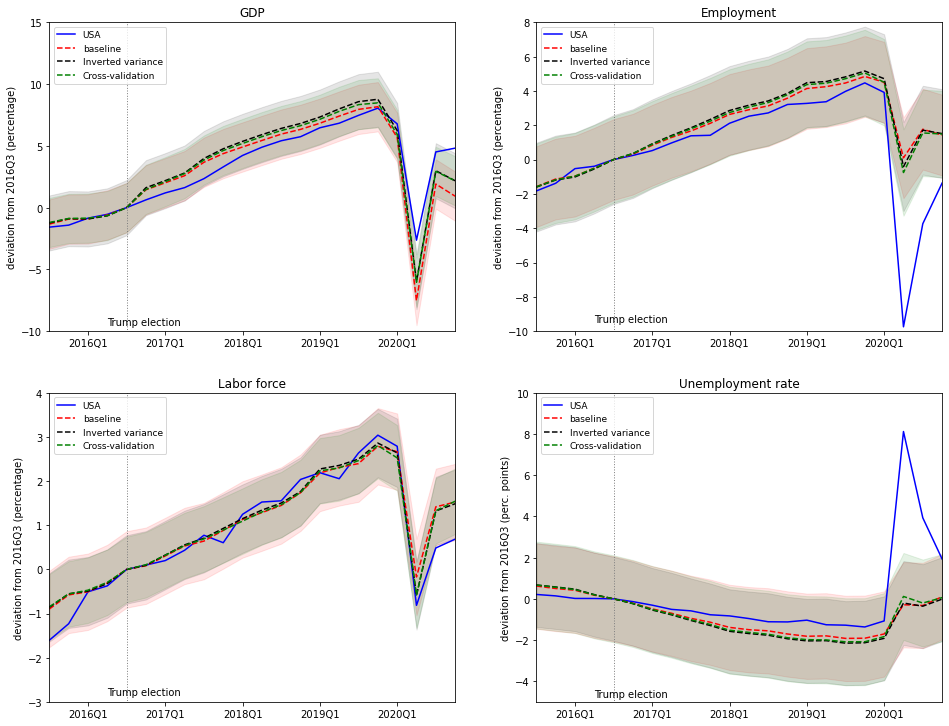

In [73]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
plotter_SA2(GDP_USA_2016, GDP_donor_2016,
            std_GDPbas, std_GDPvar, std_GDPcv,
            -10, 15, 'GDP', 'deviation from 2016Q3 (percentage)')

plt.subplot(2,2,2)
plotter_SA2(Employment_USA_2016, Employment_donor_2016,
            std_Employmentbas, std_Employmentvar, std_Employmentcv,
            -10, 8, 'Employment', 'deviation from 2016Q3 (percentage)')

plt.subplot(2,2,3)
plotter_SA2(Labor_force_USA_2016, Labor_force_donor_2016,
            std_Labor_forcebas, std_Labor_forcevar, std_Labor_forcecv,
            -3, 4, 'Labor force', 'deviation from 2016Q3 (percentage)')

plt.subplot(2,2,4)
plotter_SA2(Unemployment_rate_USA_2016, Unemployment_rate_donor_2016,
            std_Unemployment_ratebas, std_Unemployment_ratevar, std_Unemployment_ratecv,
            -5, 10, 'Unemployment rate', 'deviation from 2016Q3 (perc. points)')

#### 4.2.5 Inference<a class="anchor" id="section4_2_5"></a>
##### 4.2.5.1 Inverted variance-based <a class="anchor" id="section4_2_5_1"></a> 

In [74]:
(weight_dict_invv, gap_dict_GDP_invv, gap_dict_Employment_invv, 
 gap_dict_Labor_force_invv, gap_dict_Unemployment_rate_invv
) = placebo_weight_and_gap_computer(df_XY, SyntheticControlVAR);


1/25 Performing SCM with placebo country Australia

2/25 Performing SCM with placebo country Austria

3/25 Performing SCM with placebo country Belgium

4/25 Performing SCM with placebo country Canada

5/25 Performing SCM with placebo country Denmark

6/25 Performing SCM with placebo country Finland

7/25 Performing SCM with placebo country France

8/25 Performing SCM with placebo country Germany

9/25 Performing SCM with placebo country Hungary

10/25 Performing SCM with placebo country Iceland

11/25 Performing SCM with placebo country Ireland

12/25 Performing SCM with placebo country Italy

13/25 Performing SCM with placebo country Japan

14/25 Performing SCM with placebo country Korea

15/25 Performing SCM with placebo country Luxembourg

16/25 Performing SCM with placebo country Netherlands

17/25 Performing SCM with placebo country New Zealand

18/25 Performing SCM with placebo country Norway

19/25 Performing SCM with placebo country Portugal

20/25 Performing SCM with placebo 

##### Create p-values

In [75]:
p_values_GDP_invv_pos, p_values_GDP_invv_neg = pseudo_p_value(gap_dict_GDP_invv)
p_values_Employment_invv_pos, p_values_Employment_invv_neg = pseudo_p_value(gap_dict_Employment_invv)
(p_values_Labor_force_invv_pos, 
 p_values_Labor_force_invv_neg) = pseudo_p_value(gap_dict_Labor_force_invv)
(p_values_Unemployment_rate_invv_pos, 
 p_values_Unemployment_rate_invv_neg) = pseudo_p_value(gap_dict_Unemployment_rate_invv)

avg_pvalue_invv = []
for gap_dict_X in [gap_dict_GDP_invv, gap_dict_Employment_invv, 
                   gap_dict_Labor_force_invv, gap_dict_Unemployment_rate_invv]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_invv.append('+')
    else:
        avg_pvalue_invv.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_invv = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_invv.append(df_avg_te_invv)
    
avg_pvalue_invv = np.hstack(avg_pvalue_invv)

##### Plot

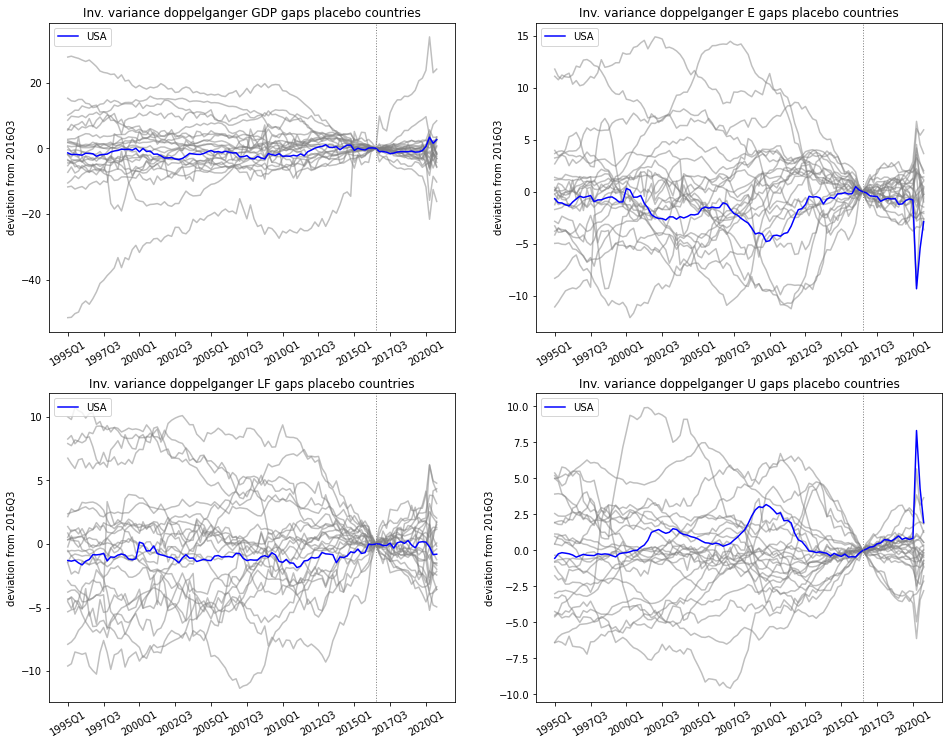

In [154]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_invv, 'Inv. variance doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_invv, 'Inv. variance doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_invv, 'Inv. variance doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_invv, 'Inv. variance doppelganger U gaps placebo countries')

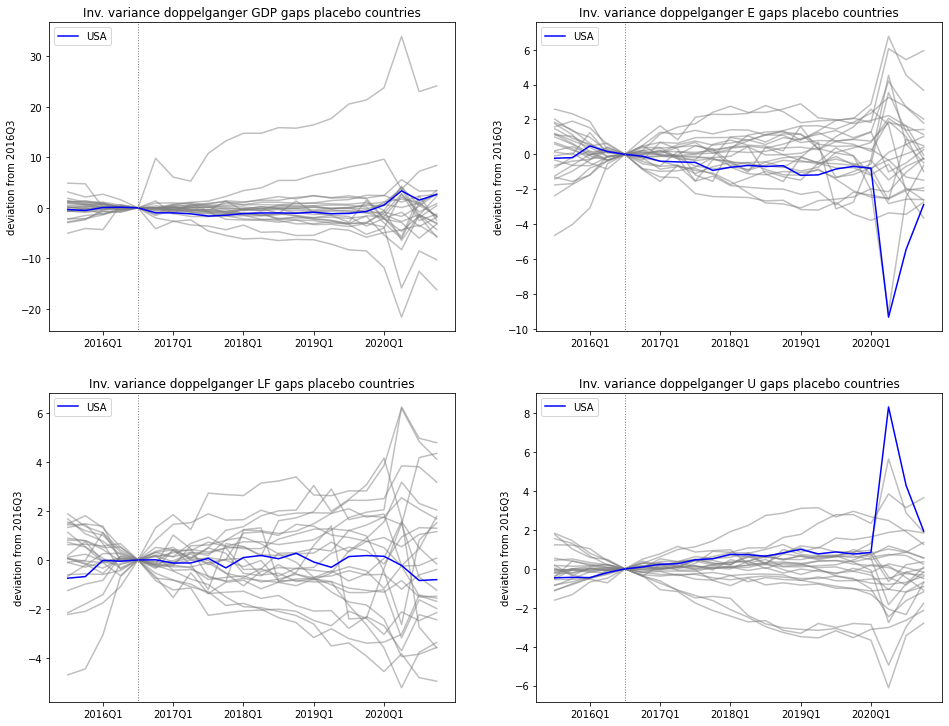

In [155]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_invv, 'Inv. variance doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_invv, 'Inv. variance doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_invv, 'Inv. variance doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_short(
    gap_dict_Unemployment_rate_invv, 'Inv. variance doppelganger U gaps placebo countries')

In [78]:
df_results_invv = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_invv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_invv_pos,2), np.round(p_values_GDP_invv_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_invv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_invv_pos,2), np.round(p_values_Employment_invv_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_invv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_invv_pos,2), np.round(p_values_Labor_force_invv_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_invv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_invv_pos,2), np.round(p_values_Unemployment_rate_invv_neg,2)
    ]).T)

p_invv = pd.DataFrame(np.vstack([df_results_invv.values, avg_pvalue_invv]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_invv.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_invv

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.040000 & 0.960000 & - & 0.290000 & 0.710000 & + & 0.620000 & 0.380000 & + & 0.750000 & 0.250000 \\
2017Q1 & - & 0.080000 & 0.920000 & - & 0.170000 & 0.830000 & - & 0.210000 & 0.790000 & + & 0.920000 & 0.080000 \\
2017Q2 & - & 0.120000 & 0.880000 & - & 0.120000 & 0.880000 & - & 0.120000 & 0.880000 & + & 0.880000 & 0.120000 \\
2017Q3 & - & 0.080000 & 0.920000 & - & 0.250000 & 0.750000 & + & 0.750000 & 0.250000 & + & 0.920000 & 0.080000 \\
2017Q4 & - & 0.120000 & 0.880000 & - & 0.170000 & 0.830000 & - & 0.170000 & 0.830000 & + & 0.920000 & 0.080000 \\
2018Q1 & - & 0.120000 & 0.880000 & - & 0.170000 & 0.830000 & + & 0.830000 & 0.170000 & + & 0.880000 & 0.120000 \\
2018Q2 & - & 0.120000 & 0.880000 & - & 0.250000 & 0.750000 & + & 0.830000 & 0.170000 & + & 0.880000 & 0.120000 \\
2018Q3 & - & 0.120000 & 0.880000 & - & 0.290000 & 0.710000 & +

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.04,0.96,-,0.29,0.71,+,0.62,0.38,+,0.75,0.25
2017Q1,-,0.08,0.92,-,0.17,0.83,-,0.21,0.79,+,0.92,0.08
2017Q2,-,0.12,0.88,-,0.12,0.88,-,0.12,0.88,+,0.88,0.12
2017Q3,-,0.08,0.92,-,0.25,0.75,+,0.75,0.25,+,0.92,0.08
2017Q4,-,0.12,0.88,-,0.17,0.83,-,0.17,0.83,+,0.92,0.08
2018Q1,-,0.12,0.88,-,0.17,0.83,+,0.83,0.17,+,0.88,0.12
2018Q2,-,0.12,0.88,-,0.25,0.75,+,0.83,0.17,+,0.88,0.12
2018Q3,-,0.12,0.88,-,0.29,0.71,+,0.71,0.29,+,0.88,0.12
2018Q4,-,0.12,0.88,-,0.25,0.75,+,0.88,0.12,+,0.92,0.08
2019Q1,-,0.12,0.88,-,0.17,0.83,-,0.38,0.62,+,0.83,0.17


##### 4.2.5.2 Cross-validation-based <a class="anchor" id="section4_2_5_2"></a> 

In [79]:
(weight_dict_cv, gap_dict_GDP_cv, gap_dict_Employment_cv, 
 gap_dict_Labor_force_cv, gap_dict_Unemployment_rate_cv
) = placebo_weight_and_gap_computer(df_XY, SyntheticControlCV);


1/25 Performing SCM with placebo country Australia

2/25 Performing SCM with placebo country Austria
Optimization terminated successfully.
         Current function value: 0.049001
         Iterations: 13456
         Function evaluations: 16301

3/25 Performing SCM with placebo country Belgium

4/25 Performing SCM with placebo country Canada
Optimization terminated successfully.
         Current function value: 0.065541
         Iterations: 24728
         Function evaluations: 38787

5/25 Performing SCM with placebo country Denmark

6/25 Performing SCM with placebo country Finland

7/25 Performing SCM with placebo country France

8/25 Performing SCM with placebo country Germany
Optimization terminated successfully.
         Current function value: 0.042977
         Iterations: 60346
         Function evaluations: 65752

9/25 Performing SCM with placebo country Hungary

10/25 Performing SCM with placebo country Iceland

11/25 Performing SCM with placebo country Ireland
Optimization ter

##### Create p-values

In [80]:
p_values_GDP_cv_pos, p_values_GDP_cv_neg = pseudo_p_value(gap_dict_GDP_cv)
p_values_Employment_cv_pos, p_values_Employment_cv_neg = pseudo_p_value(gap_dict_Employment_cv)
(p_values_Labor_force_cv_pos,
 p_values_Labor_force_cv_neg) = pseudo_p_value(gap_dict_Labor_force_cv)
(p_values_Unemployment_rate_cv_pos,
 p_values_Unemployment_rate_cv_neg) = pseudo_p_value(gap_dict_Unemployment_rate_cv)

avg_pvalue_cv = []
for gap_dict_X in [gap_dict_GDP_cv, gap_dict_Employment_cv,
                   gap_dict_Labor_force_cv, gap_dict_Unemployment_rate_cv]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_cv.append('+')
    else:
        avg_pvalue_cv.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_cv = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_cv.append(df_avg_te_cv)
    
avg_pvalue_cv = np.hstack(avg_pvalue_cv)

##### Plot

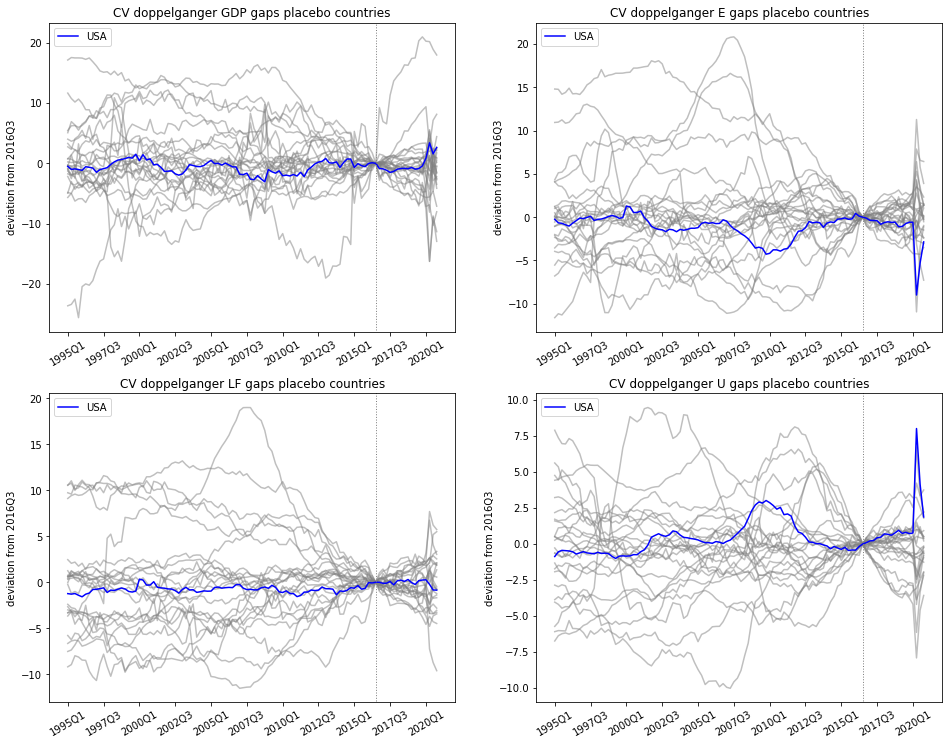

In [156]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_cv, 'CV doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_cv, 'CV doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_cv, 'CV doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_cv, 'CV doppelganger U gaps placebo countries')

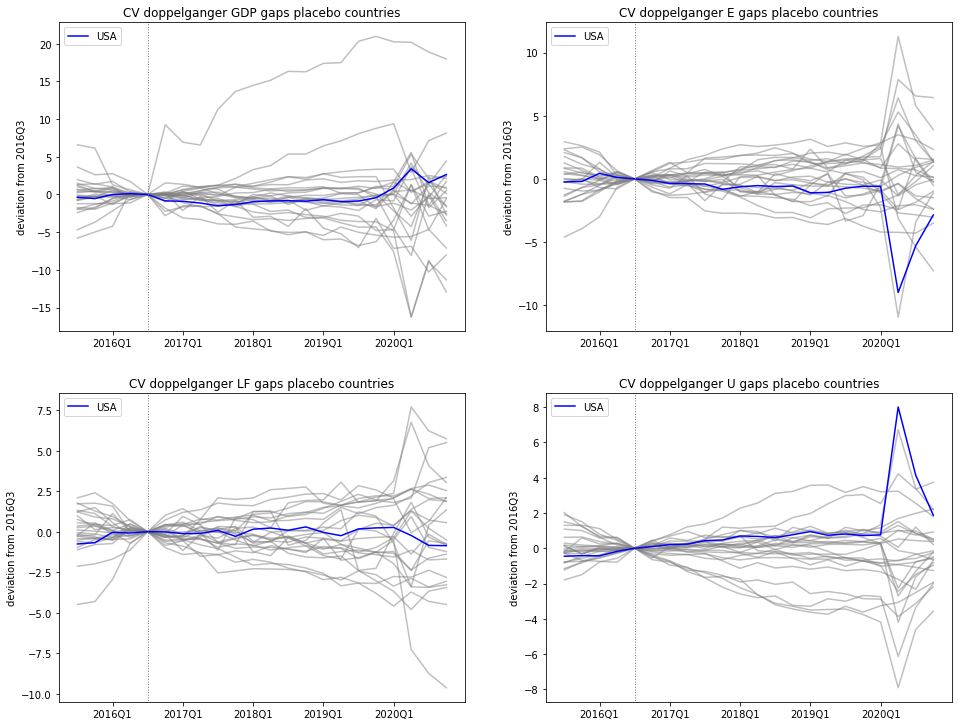

In [157]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_cv, 'CV doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_cv, 'CV doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_cv, 'CV doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_cv, 'CV doppelganger U gaps placebo countries')

In [83]:
df_results_cv = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_cv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_cv_pos,2), np.round(p_values_GDP_cv_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_cv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_cv_pos,2), np.round(p_values_Employment_cv_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_cv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_cv_pos,2), np.round(p_values_Labor_force_cv_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_cv['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_cv_pos,2), np.round(p_values_Unemployment_rate_cv_neg,2)
    ]).T)

p_cv = pd.DataFrame(np.vstack([df_results_cv.values, avg_pvalue_cv]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_cv.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_cv

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.000000 & 1.000000 & - & 0.250000 & 0.750000 & - & 0.380000 & 0.620000 & + & 0.750000 & 0.250000 \\
2017Q1 & - & 0.040000 & 0.960000 & - & 0.170000 & 0.830000 & - & 0.170000 & 0.830000 & + & 0.880000 & 0.120000 \\
2017Q2 & - & 0.040000 & 0.960000 & - & 0.170000 & 0.830000 & - & 0.210000 & 0.790000 & + & 0.830000 & 0.170000 \\
2017Q3 & - & 0.080000 & 0.920000 & - & 0.210000 & 0.790000 & + & 0.830000 & 0.170000 & + & 0.880000 & 0.120000 \\
2017Q4 & - & 0.080000 & 0.920000 & - & 0.210000 & 0.790000 & - & 0.170000 & 0.830000 & + & 0.880000 & 0.120000 \\
2018Q1 & - & 0.120000 & 0.880000 & - & 0.210000 & 0.790000 & + & 0.920000 & 0.080000 & + & 0.920000 & 0.080000 \\
2018Q2 & - & 0.120000 & 0.880000 & - & 0.250000 & 0.750000 & + & 0.920000 & 0.080000 & + & 0.830000 & 0.170000 \\
2018Q3 & - & 0.120000 & 0.880000 & - & 0.250000 & 0.750000 & +

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.0,1.0,-,0.25,0.75,-,0.38,0.62,+,0.75,0.25
2017Q1,-,0.04,0.96,-,0.17,0.83,-,0.17,0.83,+,0.88,0.12
2017Q2,-,0.04,0.96,-,0.17,0.83,-,0.21,0.79,+,0.83,0.17
2017Q3,-,0.08,0.92,-,0.21,0.79,+,0.83,0.17,+,0.88,0.12
2017Q4,-,0.08,0.92,-,0.21,0.79,-,0.17,0.83,+,0.88,0.12
2018Q1,-,0.12,0.88,-,0.21,0.79,+,0.92,0.08,+,0.92,0.08
2018Q2,-,0.12,0.88,-,0.25,0.75,+,0.92,0.08,+,0.83,0.17
2018Q3,-,0.12,0.88,-,0.25,0.75,+,0.92,0.08,+,0.88,0.12
2018Q4,-,0.12,0.88,-,0.25,0.75,+,0.92,0.08,+,0.83,0.17
2019Q1,-,0.12,0.88,-,0.21,0.79,-,0.33,0.67,+,0.88,0.12


### 4.3 SCM with different weight constraints<a class="anchor" id="section4_3"></a>
#### 4.3.1 Weights SC estimators<a class="anchor" id="section4_3_1"></a>

In [84]:
SCfitNOnonnegativeRES = SyntheticControl(weight_nonnegative_restr=False).fit(X,y)
SCfitNOsumRES = SyntheticControl(weight_sum_restr=False).fit(X,y)
SCfitNObothRES = SyntheticControl(weight_nonnegative_restr=False, weight_sum_restr=False).fit(X,y)

Function evaluation 1000/100000 	loss = 0.02012050541399881
Function evaluation 2000/100000 	loss = 0.01988180261408183
Function evaluation 3000/100000 	loss = 0.01969568096506672
Function evaluation 4000/100000 	loss = 0.019483943404878162
Function evaluation 5000/100000 	loss = 0.01933290945275041
Function evaluation 6000/100000 	loss = 0.019032498422101474
Function evaluation 7000/100000 	loss = 0.018773642876521772
Function evaluation 8000/100000 	loss = 0.018551647207691493
Function evaluation 9000/100000 	loss = 0.018391949984240513
Function evaluation 10000/100000 	loss = 0.0181987761934949
Function evaluation 11000/100000 	loss = 0.01798248466356131
Function evaluation 12000/100000 	loss = 0.017716059038321817
Function evaluation 13000/100000 	loss = 0.01754164207160711
Function evaluation 14000/100000 	loss = 0.01740374575477053
Function evaluation 15000/100000 	loss = 0.017269753132537386
Function evaluation 16000/100000 	loss = 0.017189218580434554
Function evaluation 17000/

Function evaluation 33000/100000 	loss = 0.029999965138693796
Function evaluation 34000/100000 	loss = 0.02998799358656863
Function evaluation 35000/100000 	loss = 0.029975966418256738
Function evaluation 36000/100000 	loss = 0.029963658264081244
Function evaluation 37000/100000 	loss = 0.029950802375559363
Function evaluation 38000/100000 	loss = 0.029937628455263734
Function evaluation 39000/100000 	loss = 0.029923232500548978
Function evaluation 40000/100000 	loss = 0.02990945241026293
Function evaluation 41000/100000 	loss = 0.029896752881532575
Function evaluation 42000/100000 	loss = 0.029887014440389
Function evaluation 43000/100000 	loss = 0.02987805292207313
Function evaluation 44000/100000 	loss = 0.029869923910331782
Function evaluation 45000/100000 	loss = 0.02986266683911735
Function evaluation 46000/100000 	loss = 0.029857385826036052
Function evaluation 47000/100000 	loss = 0.029854092506674576
Function evaluation 48000/100000 	loss = 0.029883418431337818
Function evalua

Function evaluation 65000/100000 	loss = 0.014337295431009763
Function evaluation 66000/100000 	loss = 0.014340270282133255
Function evaluation 67000/100000 	loss = 0.014341151989697327
Function evaluation 68000/100000 	loss = 0.014338883043958967
Function evaluation 69000/100000 	loss = 0.014339460665228246
Function evaluation 70000/100000 	loss = 0.014340389433455853
Function evaluation 71000/100000 	loss = 0.014339430739882026
Function evaluation 72000/100000 	loss = 0.014328082944046788
Function evaluation 73000/100000 	loss = 0.014335475048174342
Function evaluation 74000/100000 	loss = 0.014340237657525382
Function evaluation 75000/100000 	loss = 0.014328082944046788
Function evaluation 76000/100000 	loss = 0.014339240113111943
Function evaluation 77000/100000 	loss = 0.014335890915999409
Function evaluation 78000/100000 	loss = 0.014335886215271284
Function evaluation 79000/100000 	loss = 0.014328082944046788
Function evaluation 80000/100000 	loss = 0.014335274061569512
Function

In [85]:
weights_SA3 = np.hstack([np.round(SCfit.weights.T, 2),
                         np.round(SCfitNOnonnegativeRES.weights.T, 2),
                         np.round(SCfitNOsumRES.weights.T, 2),
                         np.round(SCfitNObothRES.weights.T, 2)])

weights_table_SA3 = pd.DataFrame(weights_SA3,
                                 index=countries[:-1],
                                 columns = ['baseline',  'No nonnegativity constraint',
                                            'No summation constraint', 'No weight constraints'])

weights_table_SA3

,baseline,No nonnegativity constraint,No summation constraint,No weight constraints
Australia,0.00,-0.15,0.00,-0.10
Austria,0.00,-0.05,0.00,-0.05
Belgium,0.00,-0.08,0.00,0.03
Canada,0.20,0.56,0.30,0.57
Denmark,0.00,-0.04,0.00,0.07
Finland,0.00,-0.00,0.00,-0.16
France,0.00,-0.08,0.00,0.01
Germany,0.00,-0.11,0.00,-0.08
Hungary,0.00,-0.12,0.00,0.01
Iceland,0.00,0.13,0.06,0.12


In [86]:
np.sum([SCfit.weights.T, 
        SCfitNOnonnegativeRES.weights.T, 
        SCfitNOsumRES.weights.T, 
        SCfitNObothRES.weights.T], axis=1).T

array([[1.        , 1.        , 1.19427458, 1.12261345]])

#### 4.3.2. Values covariates SC estimators (Table 1)<a class="anchor" id="section4_3_2"></a>

In [87]:
covariates_SA3 = np.round(np.hstack([100*y[-5:], 
                                    100*X[-5:] @ SCfit.weights.T,
                                    100*X[-5:] @ SCfitNOnonnegativeRES.weights.T,
                                    100*X[-5:] @ SCfitNOsumRES.weights.T,
                                    100*X[-5:] @ SCfitNObothRES.weights.T
                                   ]
                                  )
                         , 1)

covariates_table_SA3 = pd.DataFrame(data=covariates_SA3,
                                    index=["Consumption/GDP","Investment/GDP","Net Exports/GDP",
                                           "Labor productivity growth","Unemployment rate"],
                                    columns=['US', 'baseline', 'No nonnegativity constraint',
                                             'No summation constraint', 'No weight constraints'])

covariates_table_SA3

,US,baseline,No nonnegativity constraint,No summation constraint,No weight constraints
Consumption/GDP,68.9,57.6,67.3,67.5,68.2
Investment/GDP,20.6,21.3,20.7,26.5,22.6
Net Exports/GDP,-4.3,2.0,-3.0,2.0,-1.5
Labor productivity growth,-0.0,-0.0,-0.0,-0.0,-0.1
Unemployment rate,5.0,7.0,4.2,7.1,4.8


#### 4.3.3. Figures SC estimators (Figure 1)<a class="anchor" id="section4_3_3"></a>

In [88]:
gap_GDPnonn, std_GDPnonn = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfitNOnonnegativeRES)
gap_GDPsum, std_GDPsum = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfitNOsumRES)
gap_GDPnoboth, std_GDPnoboth = gap_and_std_calculator(GDP_USA_2016, GDP_donor_2016, SCfitNObothRES)

gap_Employmentnonn, std_Employmentnonn = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfitNOnonnegativeRES)
gap_Employmentsum, std_Employmentsum = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfitNOsumRES)
gap_Employmentnoboth, std_Employmentnoboth = gap_and_std_calculator(
    Employment_USA_2016, Employment_donor_2016, SCfitNObothRES)

gap_Labor_forcenonn, std_Labor_forcenonn = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfitNOnonnegativeRES)
gap_Labor_forcesum, std_Labor_forcesum = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfitNOsumRES)
gap_Labor_forcenoboth, std_Labor_forcenoboth = gap_and_std_calculator(
    Labor_force_USA_2016, Labor_force_donor_2016, SCfitNObothRES)

gap_Unemployment_ratenonn, std_Unemployment_ratenonn = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfitNOnonnegativeRES)
gap_Unemployment_ratesum, std_Unemployment_ratesum = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfitNOsumRES)
gap_Unemployment_ratenoboth, std_Unemployment_ratenoboth = gap_and_std_calculator(
    Unemployment_rate_USA_2016.values, Unemployment_rate_donor_2016, SCfitNObothRES)

In [89]:
def plotter_SA3(X_USA_2016, X_donor_2016,
                std_Xbas, std_Xnonn, std_Xsum, std_Xnoboth,
                ymin, ymax, title, ylabel):

    # Plot treatment and doppelganger, and standard errors
    plt.plot(np.arange(2015.5, 2021, 0.25), X_USA_2016[82:],
        color='b', label='USA')
    
    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfit.weights.T)[82:],
        color='r', linestyle='dashed', label='baseline')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfit.weights.T)[82:] - 2*std_Xbas).flatten(), 
                     ((X_donor_2016.T @ SCfit.weights.T)[82:] + 2*std_Xbas).flatten(), 
                     color='r', alpha=.1)

    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfitNOnonnegativeRES.weights.T)[82:],
        color='black', linestyle='dashed', label='No nonnegativity constraint')
    plt.fill_between(np.arange(2015.5, 2021, 0.25),
                     ((X_donor_2016.T @ SCfitNOnonnegativeRES.weights.T)[82:] - 2*std_Xnonn).flatten(), 
                     ((X_donor_2016.T @ SCfitNOnonnegativeRES.weights.T)[82:] + 2*std_Xnonn).flatten(), 
                     color='black', alpha=.1)

    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfitNOsumRES.weights.T)[82:],
        color='green', linestyle='dashed', label='No summation constraint')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfitNOsumRES.weights.T)[82:] - 2*std_Xsum).flatten(), 
                     ((X_donor_2016.T @ SCfitNOsumRES.weights.T)[82:] + 2*std_Xsum).flatten(), 
                     color='green', alpha=.1)

    plt.plot(np.arange(2015.5, 2021, 0.25), (X_donor_2016.T @ SCfitNObothRES.weights.T)[82:],
        color='purple', linestyle='dashed', label='No weight constraints')
    plt.fill_between(np.arange(2015.5, 2021, 0.25), 
                     ((X_donor_2016.T @ SCfitNObothRES.weights.T)[82:] - 2*std_Xnoboth).flatten(), 
                     ((X_donor_2016.T @ SCfitNObothRES.weights.T)[82:] + 2*std_Xnoboth).flatten(), 
                     color='purple', alpha=.1)

    # Add details
    plt.axvline(x=2016.5, ymin=-10, ymax=10, color='grey', linestyle='dotted', linewidth=1)
    plt.axis([2015.5, 2020.75, ymin, ymax])
    plt.title(title)
    plt.ylabel(ylabel)
    plt.legend(loc = 'upper left', fontsize = '9')

    plt.text(2016.25, 0.95*ymin,'Trump election')
    plt.xticks(range(2016, 2021, 1), ['2016Q1', '2017Q1', '2018Q1',
             '2019Q1', '2020Q1']);

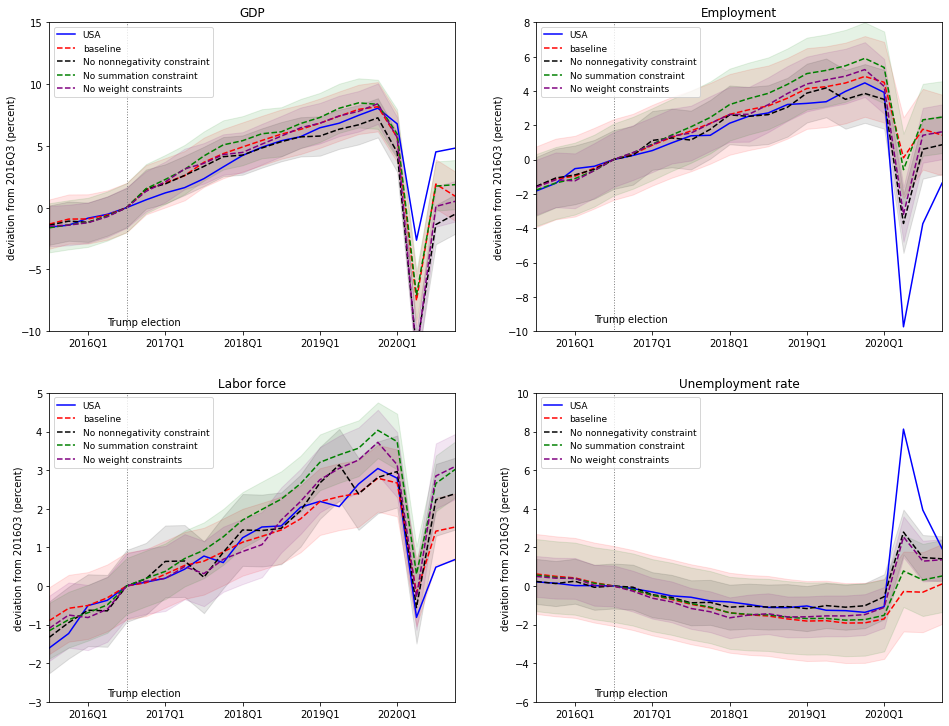

In [90]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
plotter_SA3(GDP_USA_2016, GDP_donor_2016,
            std_GDPbas, std_GDPnonn, std_GDPsum, std_GDPnoboth,
            -10, 15, 'GDP', 'deviation from 2016Q3 (percent)')

plt.subplot(2,2,2)
plotter_SA3(Employment_USA_2016, Employment_donor_2016,
            std_Employmentbas, std_Employmentnonn, std_Employmentsum, std_Employmentnoboth,
            -10, 8, 'Employment', 'deviation from 2016Q3 (percent)')

plt.subplot(2,2,3)
plotter_SA3(Labor_force_USA_2016, Labor_force_donor_2016,
            std_Labor_forcebas, std_Labor_forcenonn, std_Labor_forcesum, std_Labor_forcenoboth,
            -3, 5, 'Labor force', 'deviation from 2016Q3 (percent)')

plt.subplot(2,2,4)
plotter_SA3(Unemployment_rate_USA_2016, Unemployment_rate_donor_2016,
            std_Unemployment_ratebas, std_Unemployment_ratenonn,
            std_Unemployment_ratesum, std_Unemployment_ratenoboth,
            -6, 10, 'Unemployment rate', 'deviation from 2016Q3 (percent)')

#### 4.3.4. Inference <a class="anchor" id="section4_3_4"></a>
##### 4.3.4.1. No non-negativity constraint <a class="anchor" id="section4_3_4_1"></a>

In [91]:
def placebo_weight_and_gap_computer2(df_complete, Bweight_nonnegative_restr, Bweight_sum_rest):
    weight_dict = dict()
    gap_dict_GDP = dict()
    gap_dict_Employment = dict()
    gap_dict_Labor_force = dict()
    gap_dict_Unemployment_rate = dict()
    count = 0
    for placebo_country in countries:
        count += 1
        print('\n' + str(count) + '/25' ' Performing SCM with placebo country ' + placebo_country)

        y = df_complete[placebo_country].values.reshape(len(df_complete[placebo_country]), 1)
        X = df_complete.iloc[:, df_complete.columns != placebo_country].values
        
        SCplacebo = SyntheticControl(verbose_inner=False, 
                                     weight_nonnegative_restr=Bweight_nonnegative_restr,
                                     weight_sum_restr=Bweight_sum_rest
                                    ).fit(X,y)
        w = SCplacebo.weights
        
        weight_dict[placebo_country] = w

        gap_dict_GDP[placebo_country] = gap_computer(full_GDP_df, placebo_country, w)
        gap_dict_Employment[placebo_country] = gap_computer(full_Employment_df, placebo_country, w)
        gap_dict_Labor_force[placebo_country] = gap_computer(full_Labor_force_df, placebo_country, w)
        gap_dict_Unemployment_rate[placebo_country] = gap_computer(full_Unemployment_rate_df, placebo_country, w)

    return weight_dict, gap_dict_GDP, gap_dict_Employment, gap_dict_Labor_force, gap_dict_Unemployment_rate

In [92]:
(weight_dict_nonn, gap_dict_GDP_nonn, gap_dict_Employment_nonn, 
 gap_dict_Labor_force_nonn, gap_dict_Unemployment_rate_nonn
) = placebo_weight_and_gap_computer2(df_XY, False, True);


1/25 Performing SCM with placebo country Australia

2/25 Performing SCM with placebo country Austria

3/25 Performing SCM with placebo country Belgium

4/25 Performing SCM with placebo country Canada

5/25 Performing SCM with placebo country Denmark

6/25 Performing SCM with placebo country Finland

7/25 Performing SCM with placebo country France

8/25 Performing SCM with placebo country Germany

9/25 Performing SCM with placebo country Hungary

10/25 Performing SCM with placebo country Iceland

11/25 Performing SCM with placebo country Ireland

12/25 Performing SCM with placebo country Italy

13/25 Performing SCM with placebo country Japan

14/25 Performing SCM with placebo country Korea

15/25 Performing SCM with placebo country Luxembourg

16/25 Performing SCM with placebo country Netherlands

17/25 Performing SCM with placebo country New Zealand

18/25 Performing SCM with placebo country Norway

19/25 Performing SCM with placebo country Portugal

20/25 Performing SCM with placebo 

##### Create p-values

In [93]:
p_values_GDP_nonn_pos, p_values_GDP_nonn_neg = pseudo_p_value(gap_dict_GDP_nonn)
p_values_Employment_nonn_pos, p_values_Employment_nonn_neg = pseudo_p_value(gap_dict_Employment_nonn)
(p_values_Labor_force_nonn_pos, 
 p_values_Labor_force_nonn_neg) = pseudo_p_value(gap_dict_Labor_force_nonn)
(p_values_Unemployment_rate_nonn_pos, 
 p_values_Unemployment_rate_nonn_neg) = pseudo_p_value(gap_dict_Unemployment_rate_nonn)

avg_pvalue_nonn = []
for gap_dict_X in [gap_dict_GDP_nonn, gap_dict_Employment_nonn, 
                   gap_dict_Labor_force_nonn, gap_dict_Unemployment_rate_nonn]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_nonn.append('+')
    else:
        avg_pvalue_nonn.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_nonn = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_nonn.append(df_avg_te_nonn)
    
avg_pvalue_nonn = np.hstack(avg_pvalue_nonn)

##### Plot

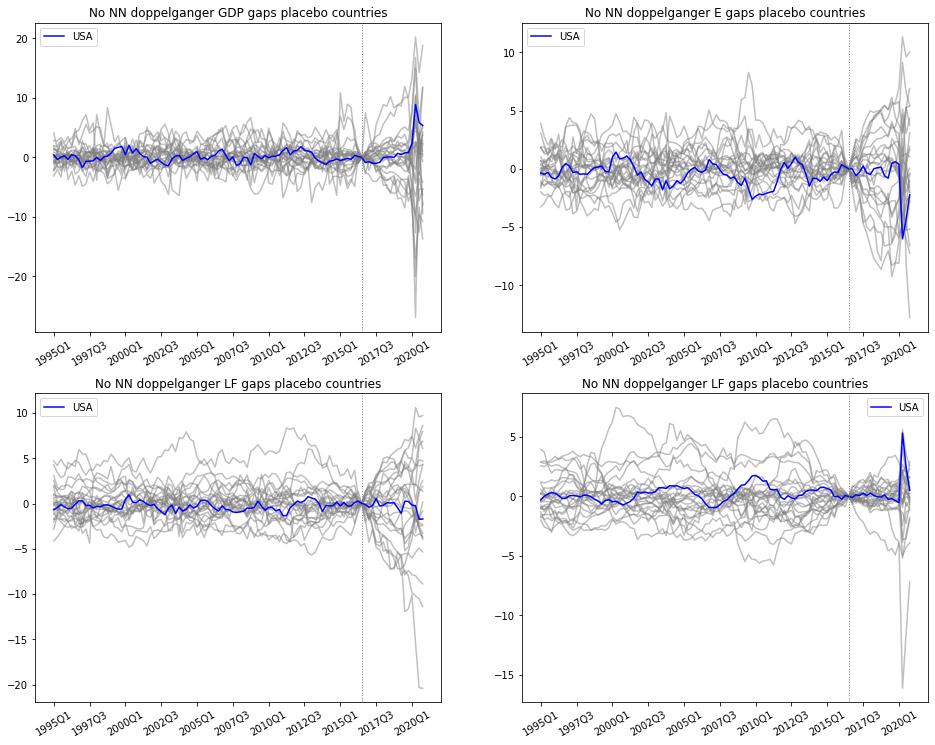

In [94]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_nonn, 'No NN doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_nonn, 'No NN doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_nonn, 'No NN doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_nonn, 'No NN doppelganger LF gaps placebo countries')


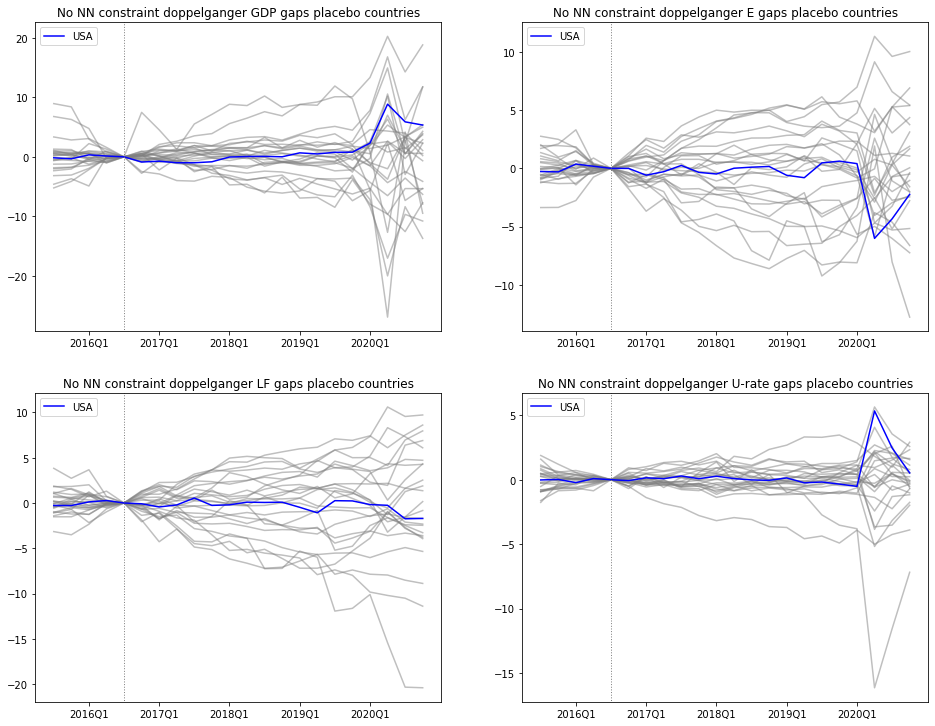

In [95]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_nonn, 'No NN constraint doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_nonn, 'No NN constraint doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_nonn, 
                    'No NN constraint doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_nonn, 
                    'No NN constraint doppelganger U-rate gaps placebo countries')

In [96]:
df_results_nonn = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_nonn['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_nonn_pos,2), np.round(p_values_GDP_nonn_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_nonn['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_nonn_pos,2), np.round(p_values_Employment_nonn_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_nonn['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_nonn_pos,2), np.round(p_values_Labor_force_nonn_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_nonn['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_nonn_pos,2), np.round(p_values_Unemployment_rate_nonn_neg,2)
    ]).T)

p_nonn = pd.DataFrame(np.vstack([df_results_nonn.values, avg_pvalue_nonn]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_nonn.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_nonn

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.000000 & 1.000000 & - & 0.460000 & 0.540000 & - & 0.250000 & 0.750000 & - & 0.210000 & 0.790000 \\
2017Q1 & - & 0.040000 & 0.960000 & - & 0.210000 & 0.790000 & - & 0.040000 & 0.960000 & + & 0.880000 & 0.120000 \\
2017Q2 & - & 0.080000 & 0.920000 & - & 0.330000 & 0.670000 & - & 0.210000 & 0.790000 & + & 0.790000 & 0.210000 \\
2017Q3 & - & 0.080000 & 0.920000 & + & 0.620000 & 0.380000 & + & 0.790000 & 0.210000 & + & 0.830000 & 0.170000 \\
2017Q4 & - & 0.080000 & 0.920000 & - & 0.380000 & 0.620000 & - & 0.250000 & 0.750000 & + & 0.750000 & 0.250000 \\
2018Q1 & - & 0.380000 & 0.620000 & - & 0.380000 & 0.620000 & - & 0.250000 & 0.750000 & + & 0.830000 & 0.170000 \\
2018Q2 & + & 0.500000 & 0.500000 & + & 0.500000 & 0.500000 & + & 0.620000 & 0.380000 & + & 0.670000 & 0.330000 \\
2018Q3 & + & 0.540000 & 0.460000 & + & 0.500000 & 0.500000 & +

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.0,1.0,-,0.46,0.54,-,0.25,0.75,-,0.21,0.79
2017Q1,-,0.04,0.96,-,0.21,0.79,-,0.04,0.96,+,0.88,0.12
2017Q2,-,0.08,0.92,-,0.33,0.67,-,0.21,0.79,+,0.79,0.21
2017Q3,-,0.08,0.92,+,0.62,0.38,+,0.79,0.21,+,0.83,0.17
2017Q4,-,0.08,0.92,-,0.38,0.62,-,0.25,0.75,+,0.75,0.25
2018Q1,-,0.38,0.62,-,0.38,0.62,-,0.25,0.75,+,0.83,0.17
2018Q2,+,0.5,0.5,+,0.5,0.5,+,0.62,0.38,+,0.67,0.33
2018Q3,+,0.54,0.46,+,0.5,0.5,+,0.54,0.46,-,0.38,0.62
2018Q4,+,0.5,0.5,+,0.5,0.5,+,0.58,0.42,-,0.38,0.62
2019Q1,+,0.71,0.29,-,0.38,0.62,-,0.21,0.79,+,0.75,0.25


##### 4.3.4.2. No sum constraint <a class="anchor" id="section4_3_4_2"></a>

In [97]:
(weight_dict_sum, gap_dict_GDP_sum, gap_dict_Employment_sum, 
 gap_dict_Labor_force_sum, gap_dict_Unemployment_rate_sum
) = placebo_weight_and_gap_computer2(df_XY, True, False);


1/25 Performing SCM with placebo country Australia

2/25 Performing SCM with placebo country Austria

3/25 Performing SCM with placebo country Belgium

4/25 Performing SCM with placebo country Canada

5/25 Performing SCM with placebo country Denmark

6/25 Performing SCM with placebo country Finland

7/25 Performing SCM with placebo country France

8/25 Performing SCM with placebo country Germany

9/25 Performing SCM with placebo country Hungary
Optimization terminated successfully.
         Current function value: 0.170328
         Iterations: 47584
         Function evaluations: 52486

10/25 Performing SCM with placebo country Iceland

11/25 Performing SCM with placebo country Ireland

12/25 Performing SCM with placebo country Italy

13/25 Performing SCM with placebo country Japan
Optimization terminated successfully.
         Current function value: 0.281802
         Iterations: 26952
         Function evaluations: 32552

14/25 Performing SCM with placebo country Korea

15/25 Perfor

##### Create p-values

In [98]:
p_values_GDP_sum_pos, p_values_GDP_sum_neg = pseudo_p_value(gap_dict_GDP_sum)
p_values_Employment_sum_pos, p_values_Employment_sum_neg = pseudo_p_value(gap_dict_Employment_sum)
(p_values_Labor_force_sum_pos, 
 p_values_Labor_force_sum_neg) = pseudo_p_value(gap_dict_Labor_force_sum)
(p_values_Unemployment_rate_sum_pos, 
 p_values_Unemployment_rate_sum_neg) = pseudo_p_value(gap_dict_Unemployment_rate_sum)

avg_pvalue_sum = []
for gap_dict_X in [gap_dict_GDP_sum, gap_dict_Employment_sum, 
                   gap_dict_Labor_force_sum, gap_dict_Unemployment_rate_sum]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_sum.append('+')
    else:
        avg_pvalue_sum.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_sum = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_sum.append(df_avg_te_sum)
    
avg_pvalue_sum = np.hstack(avg_pvalue_sum)

##### Plot

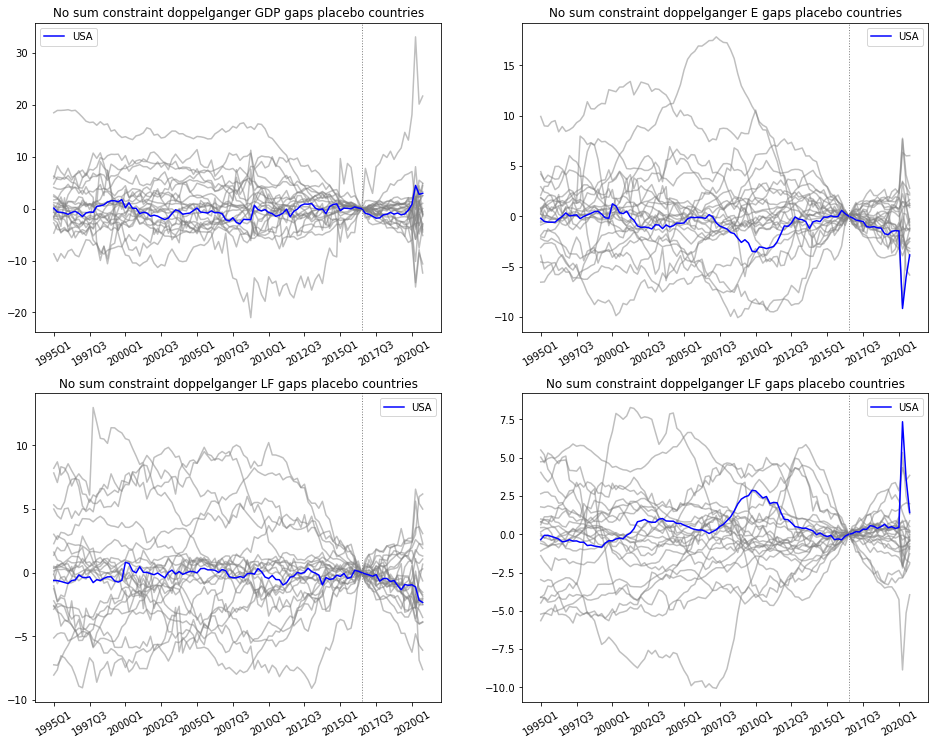

In [99]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_sum, 'No sum constraint doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_sum, 'No sum constraint doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_sum, 'No sum constraint doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_sum, 'No sum constraint doppelganger LF gaps placebo countries')

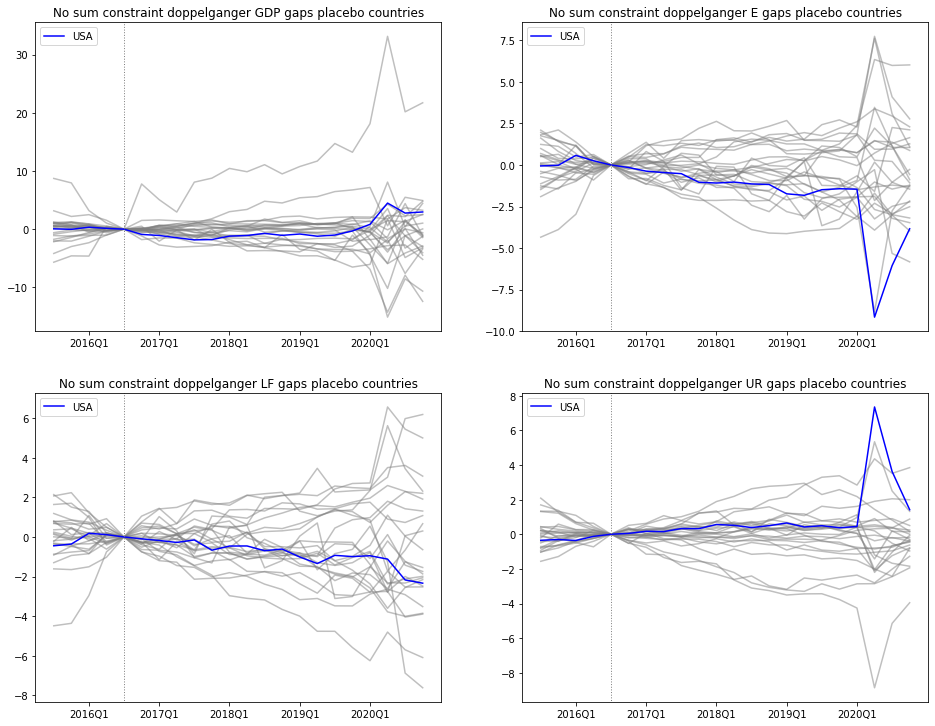

In [100]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_sum, 'No sum constraint doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_sum, 'No sum constraint doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_sum,
                    'No sum constraint doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_sum,
                    'No sum constraint doppelganger UR gaps placebo countries')

In [101]:
df_results_sum = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_sum['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_sum_pos,2), np.round(p_values_GDP_sum_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_sum['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_sum_pos,2), np.round(p_values_Employment_sum_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_sum['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_sum_pos,2), np.round(p_values_Labor_force_sum_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_sum['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_sum_pos,2), np.round(p_values_Unemployment_rate_sum_neg,2)
    ]).T)

p_sum = pd.DataFrame(np.vstack([df_results_sum.values, avg_pvalue_sum]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_sum.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_sum

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.000000 & 1.000000 & - & 0.250000 & 0.750000 & - & 0.080000 & 0.920000 & + & 0.710000 & 0.290000 \\
2017Q1 & - & 0.000000 & 1.000000 & - & 0.170000 & 0.830000 & - & 0.040000 & 0.960000 & + & 0.830000 & 0.170000 \\
2017Q2 & - & 0.040000 & 0.960000 & - & 0.120000 & 0.880000 & - & 0.000000 & 1.000000 & + & 0.710000 & 0.290000 \\
2017Q3 & - & 0.040000 & 0.960000 & - & 0.210000 & 0.790000 & - & 0.080000 & 0.920000 & + & 0.790000 & 0.210000 \\
2017Q4 & - & 0.080000 & 0.920000 & - & 0.080000 & 0.920000 & - & 0.000000 & 1.000000 & + & 0.830000 & 0.170000 \\
2018Q1 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 & - & 0.040000 & 0.960000 & + & 0.880000 & 0.120000 \\
2018Q2 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 & - & 0.040000 & 0.960000 & + & 0.830000 & 0.170000 \\
2018Q3 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 & -

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.0,1.0,-,0.25,0.75,-,0.08,0.92,+,0.71,0.29
2017Q1,-,0.0,1.0,-,0.17,0.83,-,0.04,0.96,+,0.83,0.17
2017Q2,-,0.04,0.96,-,0.12,0.88,-,0.0,1.0,+,0.71,0.29
2017Q3,-,0.04,0.96,-,0.21,0.79,-,0.08,0.92,+,0.79,0.21
2017Q4,-,0.08,0.92,-,0.08,0.92,-,0.0,1.0,+,0.83,0.17
2018Q1,-,0.08,0.92,-,0.12,0.88,-,0.04,0.96,+,0.88,0.12
2018Q2,-,0.08,0.92,-,0.12,0.88,-,0.04,0.96,+,0.83,0.17
2018Q3,-,0.08,0.92,-,0.12,0.88,-,0.0,1.0,+,0.75,0.25
2018Q4,-,0.04,0.96,-,0.12,0.88,-,0.0,1.0,+,0.75,0.25
2019Q1,-,0.08,0.92,-,0.08,0.92,-,0.0,1.0,+,0.83,0.17


##### 4.3.4.3. No weight constraints <a class="anchor" id="section4_3_4_3"></a>

In [102]:
(weight_dict_noboth, gap_dict_GDP_noboth, gap_dict_Employment_noboth, 
 gap_dict_Labor_force_noboth, gap_dict_Unemployment_rate_noboth
) = placebo_weight_and_gap_computer2(df_XY, False, False);


1/25 Performing SCM with placebo country Australia

2/25 Performing SCM with placebo country Austria

3/25 Performing SCM with placebo country Belgium

4/25 Performing SCM with placebo country Canada

5/25 Performing SCM with placebo country Denmark

6/25 Performing SCM with placebo country Finland

7/25 Performing SCM with placebo country France

8/25 Performing SCM with placebo country Germany

9/25 Performing SCM with placebo country Hungary

10/25 Performing SCM with placebo country Iceland

11/25 Performing SCM with placebo country Ireland

12/25 Performing SCM with placebo country Italy

13/25 Performing SCM with placebo country Japan

14/25 Performing SCM with placebo country Korea

15/25 Performing SCM with placebo country Luxembourg

16/25 Performing SCM with placebo country Netherlands

17/25 Performing SCM with placebo country New Zealand

18/25 Performing SCM with placebo country Norway

19/25 Performing SCM with placebo country Portugal

20/25 Performing SCM with placebo 

##### Create p-values

In [103]:
p_values_GDP_noboth_pos, p_values_GDP_noboth_neg = pseudo_p_value(gap_dict_GDP_noboth)
p_values_Employment_noboth_pos, p_values_Employment_noboth_neg = pseudo_p_value(gap_dict_Employment_noboth)
(p_values_Labor_force_noboth_pos, 
 p_values_Labor_force_noboth_neg) = pseudo_p_value(gap_dict_Labor_force_noboth)
(p_values_Unemployment_rate_noboth_pos, 
 p_values_Unemployment_rate_noboth_neg) = pseudo_p_value(gap_dict_Unemployment_rate_noboth)

avg_pvalue_noboth = []
for gap_dict_X in [gap_dict_GDP_noboth, gap_dict_Employment_noboth, 
                   gap_dict_Labor_force_noboth, gap_dict_Unemployment_rate_noboth]:
    avgte = np.round(np.mean(gap_dict_X['United States'][87:]),2)
    if avgte > 0:
        avg_pvalue_noboth.append('+')
    else:
        avg_pvalue_noboth.append('-')
    pos_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/24,2)
    neg_df = np.round((pd.DataFrame(ratiofit_pre_post(gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/24,2)
    df_avg_te_noboth = (pd.concat([pos_df, neg_df], axis=1).iloc[-1,:].values)
    avg_pvalue_noboth.append(df_avg_te_noboth)
    
avg_pvalue_noboth = np.hstack(avg_pvalue_noboth)

##### Plot

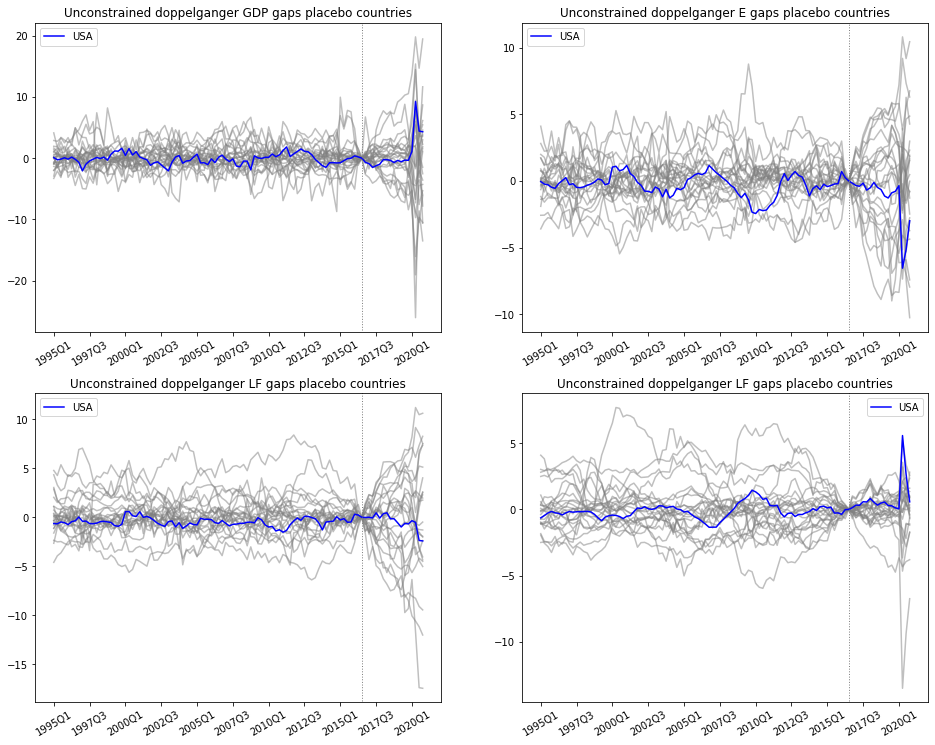

In [104]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_full(gap_dict_GDP_noboth, 'Unconstrained doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_full(gap_dict_Employment_noboth, 'Unconstrained doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_full(gap_dict_Labor_force_noboth, 'Unconstrained doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_full(gap_dict_Unemployment_rate_noboth, 'Unconstrained doppelganger LF gaps placebo countries')

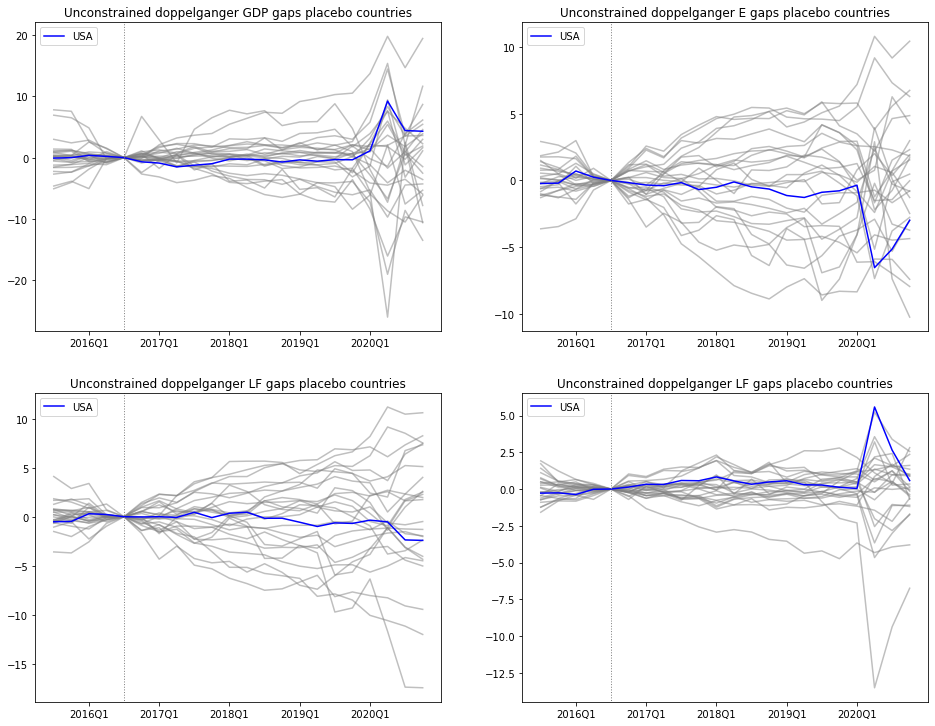

In [105]:
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)
placebo_gap_plotter_short(gap_dict_GDP_noboth, 'Unconstrained doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
placebo_gap_plotter_short(gap_dict_Employment_noboth, 'Unconstrained doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
placebo_gap_plotter_short(gap_dict_Labor_force_noboth, 
                    'Unconstrained doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
placebo_gap_plotter_short(gap_dict_Unemployment_rate_noboth, 
                    'Unconstrained doppelganger LF gaps placebo countries')

In [106]:
df_results_noboth = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            gap_dict_GDP_noboth['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_GDP_noboth_pos,2), np.round(p_values_GDP_noboth_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Employment_noboth['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Employment_noboth_pos,2), np.round(p_values_Employment_noboth_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Labor_force_noboth['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Labor_force_noboth_pos,2), np.round(p_values_Labor_force_noboth_neg,2),
        (pd.DataFrame(np.sign(
            gap_dict_Unemployment_rate_noboth['United States'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(p_values_Unemployment_rate_noboth_pos,2), np.round(p_values_Unemployment_rate_noboth_neg,2)
    ]).T)

p_noboth = pd.DataFrame(np.vstack([df_results_noboth.values, avg_pvalue_noboth]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_noboth.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_noboth

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
2016Q4 & - & 0.000000 & 1.000000 & - & 0.330000 & 0.670000 & - & 0.460000 & 0.540000 & + & 0.750000 & 0.250000 \\
2017Q1 & - & 0.000000 & 1.000000 & - & 0.290000 & 0.710000 & + & 0.500000 & 0.500000 & + & 0.960000 & 0.040000 \\
2017Q2 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 & - & 0.330000 & 0.670000 & + & 0.920000 & 0.080000 \\
2017Q3 & - & 0.080000 & 0.920000 & - & 0.420000 & 0.580000 & + & 0.670000 & 0.330000 & + & 0.920000 & 0.080000 \\
2017Q4 & - & 0.080000 & 0.920000 & - & 0.120000 & 0.880000 & - & 0.380000 & 0.620000 & + & 0.920000 & 0.080000 \\
2018Q1 & - & 0.330000 & 0.670000 & - & 0.290000 & 0.710000 & + & 0.750000 & 0.250000 & + & 0.920000 & 0.080000 \\
2018Q2 & - & 0.330000 & 0.670000 & - & 0.500000 & 0.500000 & + & 0.710000 & 0.290000 & + & 0.960000 & 0.040000 \\
2018Q3 & - & 0.250000 & 0.750000 & - & 0.330000 & 0.670000 & -

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.0,1.0,-,0.33,0.67,-,0.46,0.54,+,0.75,0.25
2017Q1,-,0.0,1.0,-,0.29,0.71,+,0.5,0.5,+,0.96,0.04
2017Q2,-,0.08,0.92,-,0.12,0.88,-,0.33,0.67,+,0.92,0.08
2017Q3,-,0.08,0.92,-,0.42,0.58,+,0.67,0.33,+,0.92,0.08
2017Q4,-,0.08,0.92,-,0.12,0.88,-,0.38,0.62,+,0.92,0.08
2018Q1,-,0.33,0.67,-,0.29,0.71,+,0.75,0.25,+,0.92,0.08
2018Q2,-,0.33,0.67,-,0.5,0.5,+,0.71,0.29,+,0.96,0.04
2018Q3,-,0.25,0.75,-,0.33,0.67,-,0.29,0.71,+,0.83,0.17
2018Q4,-,0.17,0.83,-,0.29,0.71,-,0.33,0.67,+,0.96,0.04
2019Q1,-,0.38,0.62,-,0.12,0.88,-,0.21,0.79,+,0.96,0.04


## Summary inference <a class="anchor" id="summary_inference"></a>

In [107]:
p_all = pd.DataFrame(
    np.vstack([
        p_baseline.iloc[-1,:],
        p_GDPbased.iloc[-1,:].values,
        p_Employmentbased.iloc[-1,:].values,
        p_Labor_forcebased.iloc[-1,:].values,
        p_Unemployment_ratebased.iloc[-1,:].values,
        p_invv.iloc[-1,:].values,
        p_cv.iloc[-1,:].values,
        p_nonn.iloc[-1,:].values,
        p_sum.iloc[-1,:].values,
        p_noboth.iloc[-1,:].values]),
columns=['GDP', '+T.E.', '-T.E.',
         'Emp.', '+T.E.', '-T.E.',
         'LF', '+T.E.', '-T.E.',
         'UR', '+T.E.', '-T.E.'],
index=['baseline', 'GDP-based', 'E-based',
      'LF-based', 'U-based', 'CV', 'Inv. variance',
      'No NN constrant', 'No sum constraint', 'Unconstrained'])

print(p_all.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

p_all

\begin{tabular}{rrrrrrrrrrrrr}
\toprule
 & GDP & +T.E. & -T.E. & Emp. & +T.E. & -T.E. & LF & +T.E. & -T.E. & UR & +T.E. & -T.E. \\
\midrule
baseline & + & 0.96 & 0.67 & - & 0.06 & 1.0 & - & 0.62 & 0.71 & + & 0.96 & 0.1 \\
GDP-based & + & 1.0 & 0.17 & - & 0.12 & 1.0 & - & 0.21 & 0.79 & + & 1.0 & 0.46 \\
E-based & + & 1.0 & 0.17 & - & 0.58 & 1.0 & + & 0.75 & 0.67 & + & 1.0 & 0.06 \\
LF-based & + & 0.83 & 0.33 & - & 0.08 & 1.0 & - & 0.12 & 0.79 & + & 1.0 & 0.17 \\
U-based & + & 0.92 & 0.33 & - & 0.29 & 1.0 & - & 0.42 & 0.92 & + & 0.96 & 0.58 \\
CV & - & 0.88 & 0.83 & - & 0.08 & 1.0 & - & 0.38 & 0.5 & + & 1.0 & 0.08 \\
Inv. variance & - & 0.92 & 0.75 & - & 0.04 & 1.0 & - & 0.42 & 0.5 & + & 1.0 & 0.12 \\
No NN constrant & + & 0.88 & 0.42 & - & 0.29 & 0.71 & - & 0.46 & 0.67 & + & 0.96 & 0.42 \\
No sum constraint & - & 0.96 & 0.79 & - & 0.12 & 1.0 & - & 0.15 & 1.0 & + & 0.96 & 0.1 \\
Unconstrained & + & 0.88 & 0.5 & - & 0.1 & 0.92 & - & 0.42 & 0.67 & + & 1.0 & 0.04 \\
\bottomrule
\end{tabular

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
baseline,+,0.96,0.67,-,0.06,1.0,-,0.62,0.71,+,0.96,0.1
GDP-based,+,1.0,0.17,-,0.12,1.0,-,0.21,0.79,+,1.0,0.46
E-based,+,1.0,0.17,-,0.58,1.0,+,0.75,0.67,+,1.0,0.06
LF-based,+,0.83,0.33,-,0.08,1.0,-,0.12,0.79,+,1.0,0.17
U-based,+,0.92,0.33,-,0.29,1.0,-,0.42,0.92,+,0.96,0.58
CV,-,0.88,0.83,-,0.08,1.0,-,0.38,0.5,+,1.0,0.08
Inv. variance,-,0.92,0.75,-,0.04,1.0,-,0.42,0.5,+,1.0,0.12
No NN constrant,+,0.88,0.42,-,0.29,0.71,-,0.46,0.67,+,0.96,0.42
No sum constraint,-,0.96,0.79,-,0.12,1.0,-,0.15,1.0,+,0.96,0.1
Unconstrained,+,0.88,0.5,-,0.1,0.92,-,0.42,0.67,+,1.0,0.04


## Summary robustness <a class="anchor" id="summary_robustness"></a>

Time placebo tests

In [108]:
def X_indices_creator(indicator, i):
    if indicator == 'GDP':
        indices = np.r_[0:(87-i), 261:266]
    elif indicator == 'E':
        indices = np.r_[87:(174-i), 261:266]
    elif indicator == 'LF':
        indices = np.r_[174:(261-i), 261:266]
    return indices


1/21 Performing SCM with time placebo full
Optimization terminated successfully.
         Current function value: 0.012213
         Iterations: 19371
         Function evaluations: 22356

2/21 Performing SCM with time placebo 2016q2
Optimization terminated successfully.
         Current function value: 0.012213
         Iterations: 49274
         Function evaluations: 54343

3/21 Performing SCM with time placebo 2016q1
Optimization terminated successfully.
         Current function value: 0.012172
         Iterations: 26248
         Function evaluations: 29654

4/21 Performing SCM with time placebo 2015q4
Optimization terminated successfully.
         Current function value: 0.012172
         Iterations: 19906
         Function evaluations: 22473

5/21 Performing SCM with time placebo 2015q3
Optimization terminated successfully.
         Current function value: 0.012179
         Iterations: 33093
         Function evaluations: 36984

6/21 Performing SCM with time placebo 2015q2
Optimi

,GDP,+T.E.,-T.E.,Emp.,+T.E.,-T.E.,LF,+T.E.,-T.E.,UR,+T.E.,-T.E.
2016Q4,-,0.05,0.95,+,0.05,0.95,+,0.0,1.0,-,0.95,0.05
2017Q1,-,0.05,0.95,-,0.05,0.95,-,0.75,0.25,-,0.95,0.05
2017Q2,-,0.05,0.95,-,0.1,0.9,-,0.9,0.1,-,0.95,0.05
2017Q3,-,0.05,0.95,+,0.05,0.95,+,0.0,1.0,-,0.95,0.05
2017Q4,+,0.35,0.65,-,0.45,0.55,-,0.9,0.1,-,0.75,0.25
2018Q1,+,0.5,0.5,-,0.3,0.7,-,0.9,0.1,-,0.8,0.2
2018Q2,+,0.4,0.6,-,0.35,0.65,-,0.85,0.15,-,0.65,0.35
2018Q3,+,0.4,0.6,-,0.4,0.6,-,0.9,0.1,-,0.4,0.6
2018Q4,+,0.4,0.6,-,0.35,0.65,-,0.85,0.15,-,0.45,0.55
2019Q1,+,0.5,0.5,-,0.55,0.45,-,0.7,0.3,+,0.7,0.3


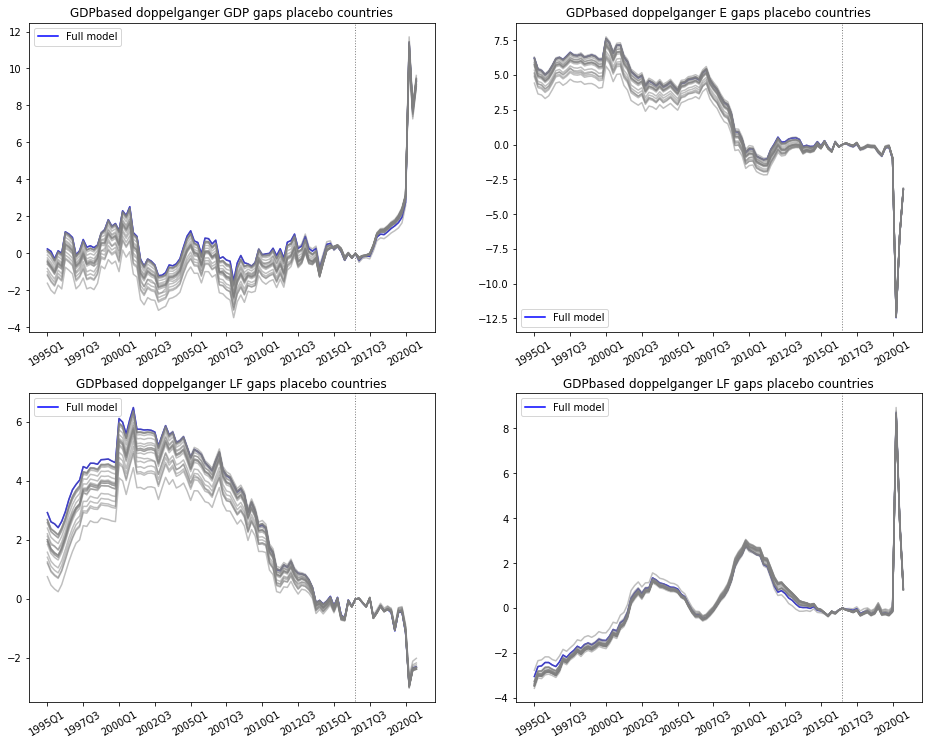

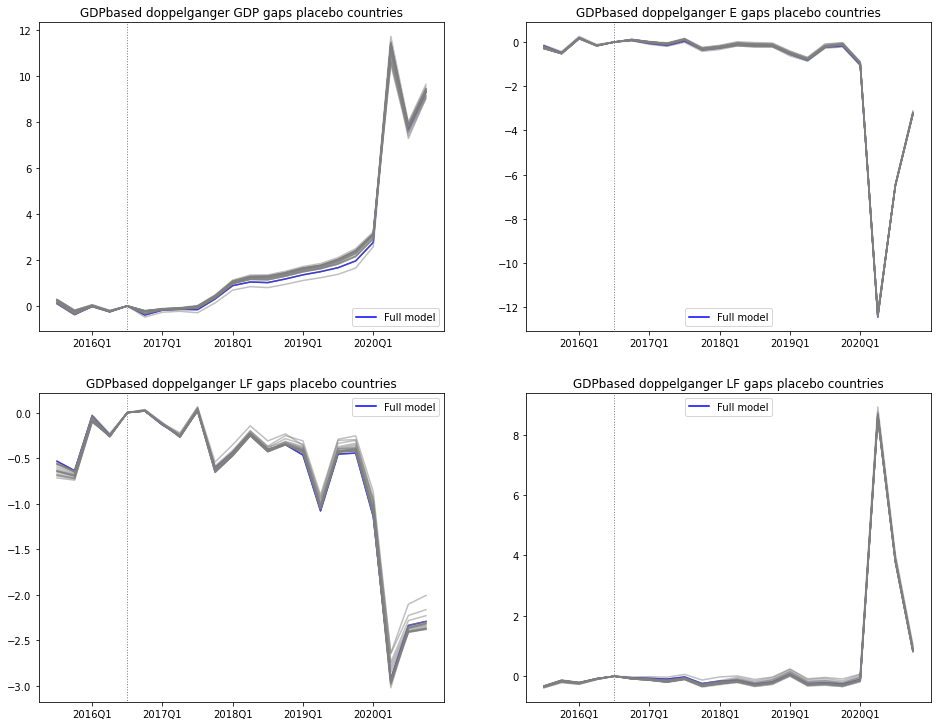

In [113]:
# name is last quarter included
GDPindices2016q3 = X_indices_creator('GDP', 0)
GDPindices2016q2 = X_indices_creator('GDP', 1)
GDPindices2016q1 = X_indices_creator('GDP', 2)
GDPindices2015q4 = X_indices_creator('GDP', 3)
GDPindices2015q3 = X_indices_creator('GDP', 4)
GDPindices2015q2 = X_indices_creator('GDP', 5)
GDPindices2015q1 = X_indices_creator('GDP', 6)
GDPindices2014q4 = X_indices_creator('GDP', 7)
GDPindices2014q3 = X_indices_creator('GDP', 8)
GDPindices2014q2 = X_indices_creator('GDP', 9)
GDPindices2014q1 = X_indices_creator('GDP', 10)
GDPindices2013q4 = X_indices_creator('GDP', 11)
GDPindices2013q3 = X_indices_creator('GDP', 12)
GDPindices2013q2 = X_indices_creator('GDP', 13)
GDPindices2013q1 = X_indices_creator('GDP', 14)
GDPindices2012q4 = X_indices_creator('GDP', 15)
GDPindices2012q3 = X_indices_creator('GDP', 16)
GDPindices2012q2 = X_indices_creator('GDP', 17)
GDPindices2012q1 = X_indices_creator('GDP', 18)
GDPindices2011q4 = X_indices_creator('GDP', 19)
GDPindices2011q3 = X_indices_creator('GDP', 20)

str_indices = ['full', '2016q2', '2016q1',
               '2015q4', '2015q3', '2015q2', '2015q1',
               '2014q4', '2014q3', '2014q2', '2014q1',
               '2013q4', '2013q3', '2013q2', '2013q1',
               '2012q4', '2012q3', '2012q2', '2012q1',
               '2011q4', '2011q3']

GDPindices = [GDPindices2016q3, GDPindices2016q2, GDPindices2016q1, 
           GDPindices2015q4, GDPindices2015q3, GDPindices2015q2, GDPindices2015q1,
           GDPindices2014q4, GDPindices2014q3, GDPindices2014q2, GDPindices2014q1,
           GDPindices2013q4, GDPindices2013q3, GDPindices2013q2, GDPindices2013q1, 
           GDPindices2012q4, GDPindices2012q3, GDPindices2012q2, GDPindices2012q1,
           GDPindices2011q4, GDPindices2011q3]

(GDPbased_time_weight_dict, time_gap_dict_GDP_GDPbased,
 time_gap_dict_Employment_GDPbased, time_gap_dict_Labor_force_GDPbased,
 time_gap_dict_Unemployment_rate_GDPbased) = time_weight_and_gap_computer(df_XY, SyntheticControl, GDPindices)

#### Create p-values
(time_p_values_GDP_GDPbased_pos, 
 time_p_values_GDP_GDPbased_neg) = time_pseudo_p_value(time_gap_dict_GDP_GDPbased)
(time_p_values_Employment_GDPbased_pos, 
 time_p_values_Employment_GDPbased_neg) = time_pseudo_p_value(time_gap_dict_Employment_GDPbased)
(time_p_values_Labor_force_GDPbased_pos, 
 time_p_values_Labor_force_GDPbased_neg) = time_pseudo_p_value(time_gap_dict_Labor_force_GDPbased)
(time_p_values_Unemployment_rate_GDPbased_pos, 
 time_p_values_Unemployment_rate_GDPbased_neg) = time_pseudo_p_value(time_gap_dict_Unemployment_rate_GDPbased)

time_avg_pvalue_GDPbased = []
for time_gap_dict_X in [time_gap_dict_GDP_GDPbased, time_gap_dict_Employment_GDPbased, 
                        time_gap_dict_Labor_force_GDPbased, time_gap_dict_Unemployment_rate_GDPbased]:
    time_avgte = np.round(np.mean(time_gap_dict_GDP_GDPbased['full'][87:]),2)
    if time_avgte > 0:
        time_avg_pvalue_GDPbased.append('+')
    else:
        time_avg_pvalue_GDPbased.append('-')
    time_pos_df = np.round((pd.DataFrame(
        time_ratiofit_pre_post(time_gap_dict_X, 'positive')[1].values()).rank(axis=0) - 1)/20,2)
    time_neg_df = np.round((pd.DataFrame(
        time_ratiofit_pre_post(time_gap_dict_X, 'negative')[1].values()).rank(axis=0) - 1)/20,2)
    time_df_avg_te_GDPbased = (pd.concat([time_pos_df, time_neg_df], axis=1).iloc[-1,:].values)
    time_avg_pvalue_GDPbased.append(time_df_avg_te_GDPbased)
    
time_avg_pvalue_GDPbased = np.hstack(time_avg_pvalue_GDPbased)


#### Plot
plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)

time_gap_plotter_full(time_gap_dict_GDP_GDPbased, 'GDPbased doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
time_gap_plotter_full(time_gap_dict_Employment_GDPbased, 'GDPbased doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
time_gap_plotter_full(time_gap_dict_Labor_force_GDPbased, 'GDPbased doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
time_gap_plotter_full(time_gap_dict_Unemployment_rate_GDPbased, 'GDPbased doppelganger LF gaps placebo countries')

plt.figure(figsize=(16,12.5))

plt.subplot(2,2,1)

time_gap_plotter_short(time_gap_dict_GDP_GDPbased, 'GDPbased doppelganger GDP gaps placebo countries')

plt.subplot(2,2,2)
time_gap_plotter_short(time_gap_dict_Employment_GDPbased, 'GDPbased doppelganger E gaps placebo countries')

plt.subplot(2,2,3)
time_gap_plotter_short(time_gap_dict_Labor_force_GDPbased, 'GDPbased doppelganger LF gaps placebo countries')

plt.subplot(2,2,4)
time_gap_plotter_short(time_gap_dict_Unemployment_rate_GDPbased, 'GDPbased doppelganger LF gaps placebo countries')

df_time_results_GDPbased = pd.DataFrame(
    np.vstack([
        (pd.DataFrame(np.sign(
            time_gap_dict_GDP_GDPbased['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_GDP_GDPbased_pos,2), np.round(time_p_values_GDP_GDPbased_neg,2),
        (pd.DataFrame(np.sign(
            time_gap_dict_Employment_GDPbased['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_Employment_GDPbased_pos,2), np.round(time_p_values_Employment_GDPbased_neg,2),
        (pd.DataFrame(np.sign(
            time_gap_dict_Labor_force_GDPbased['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_Labor_force_GDPbased_pos,2), np.round(time_p_values_Labor_force_GDPbased_neg,2),
        (pd.DataFrame(np.sign(
            time_gap_dict_Unemployment_rate_GDPbased['full'][87:])).replace([-1, 1], ['-', '+']))[0].values,
        np.round(time_p_values_Unemployment_rate_GDPbased_pos,2), np.round(time_p_values_Unemployment_rate_GDPbased_neg,2)
    ]).T)

time_p_GDPbased = pd.DataFrame(np.vstack([df_time_results_GDPbased.values, time_avg_pvalue_GDPbased]),
                          columns=['GDP', '+T.E.', '-T.E.',
                                   'Emp.', '+T.E.', '-T.E.',
                                   'LF', '+T.E.', '-T.E.',
                                   'UR', '+T.E.', '-T.E.'],
                          index=np.hstack(['2016Q4', '2017Q1', '2017Q2', '2017Q3', '2017Q4',
                                           '2018Q1', '2018Q2', '2018Q3', '2018Q4', '2019Q1',
                                           '2019Q2', '2019Q3', '2019Q4', '2020Q1', '2020Q2',
                                           '2020Q3', '2020Q4', 'Total']))

print(p_GDPbased.style.to_latex(hrules=True, column_format='rrrrrrrrrrrrr'))

time_p_GDPbased